# Problem Statement

> This project will focus on the Ames Housing dataset on Kaggle, where I will use the many features in the dataset to compute the sale price

> Dataset and column description can be found on https://jse.amstat.org/v19n3/decock/DataDocumentation.txt

> Goal: Build a regression model to predict housing prices, focusing on feature engineering and model explainability

# Load the data

In [1]:
import kagglehub
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt

# Download latest version
dataset_path = kagglehub.dataset_download("prevek18/ames-housing-dataset")

file_path = os.path.join(dataset_path, 'AmesHousing.csv')
print(file_path)
df = pd.read_csv(file_path)

100%|██████████| 185k/185k [00:00<00:00, 386kB/s]

Extracting files...
/root/.cache/kagglehub/datasets/prevek18/ames-housing-dataset/versions/1/AmesHousing.csv


# Exploratory Data Analysis

In [2]:
# Keep a copy of the original dataframe
if 'df_original' not in globals():
  df_original = df.copy()

In [3]:
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [4]:
df.shape

(2930, 82)

In [5]:
df.describe()

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2930.00000,2.930000e+03,2930.000000,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2907.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,1465.50000,7.144645e+08,57.387372,69.224590,10147.921843,6.094881,5.563140,1971.356314,1984.266553,101.896801,...,93.751877,47.533447,23.011604,2.592491,16.002048,2.243345,50.635154,6.216041,2007.790444,180796.060068
std,845.96247,1.887308e+08,42.638025,23.365335,7880.017759,1.411026,1.111537,30.245361,20.860286,179.112611,...,126.361562,67.483400,64.139059,25.141331,56.087370,35.597181,566.344288,2.714492,1.316613,79886.692357
min,1.00000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,733.25000,5.284770e+08,20.000000,58.000000,7440.250000,5.000000,5.000000,1954.000000,1965.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129500.000000
50%,1465.50000,5.354536e+08,50.000000,68.000000,9436.500000,6.000000,5.000000,1973.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,2197.75000,9.071811e+08,70.000000,80.000000,11555.250000,7.000000,6.000000,2001.000000,2004.000000,164.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213500.000000
max,2930.00000,1.007100e+09,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


> Here, we see that Order is just something to keep track of the order number in chronological order and won't matter in our dataset.

> By the description of PID as a Parcel Identification Number, I also don't see how that would be relevant, but I'll wait until after EDA to see if I should drop it

In [6]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
print(numerical_cols + '\n')
print(f"Number of numerical columns: {len(numerical_cols)}")


Index(['Order\n', 'PID\n', 'MS SubClass\n', 'Lot Frontage\n', 'Lot Area\n',
       'Overall Qual\n', 'Overall Cond\n', 'Year Built\n', 'Year Remod/Add\n',
       'Mas Vnr Area\n', 'BsmtFin SF 1\n', 'BsmtFin SF 2\n', 'Bsmt Unf SF\n',
       'Total Bsmt SF\n', '1st Flr SF\n', '2nd Flr SF\n', 'Low Qual Fin SF\n',
       'Gr Liv Area\n', 'Bsmt Full Bath\n', 'Bsmt Half Bath\n', 'Full Bath\n',
       'Half Bath\n', 'Bedroom AbvGr\n', 'Kitchen AbvGr\n', 'TotRms AbvGrd\n',
       'Fireplaces\n', 'Garage Yr Blt\n', 'Garage Cars\n', 'Garage Area\n',
       'Wood Deck SF\n', 'Open Porch SF\n', 'Enclosed Porch\n', '3Ssn Porch\n',
       'Screen Porch\n', 'Pool Area\n', 'Misc Val\n', 'Mo Sold\n', 'Yr Sold\n',
       'SalePrice\n'],
      dtype='object')
Number of numerical columns: 39


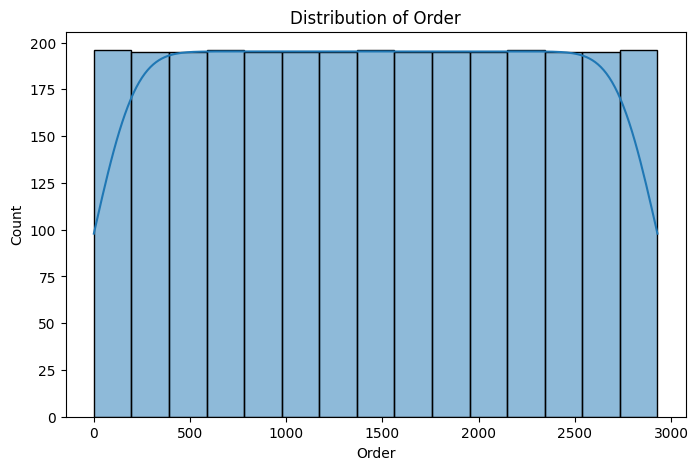

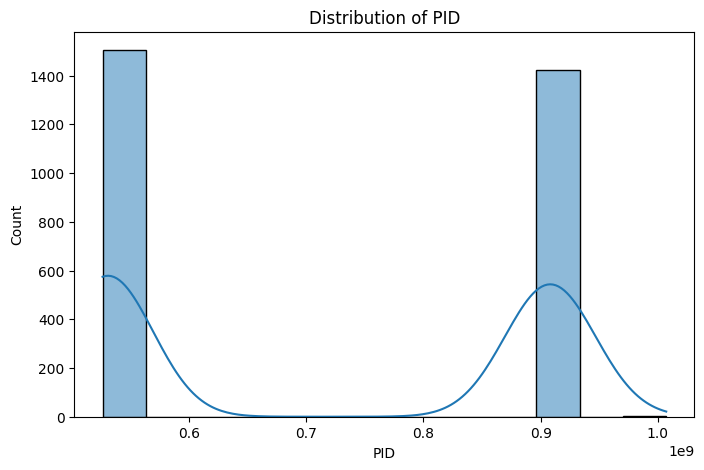

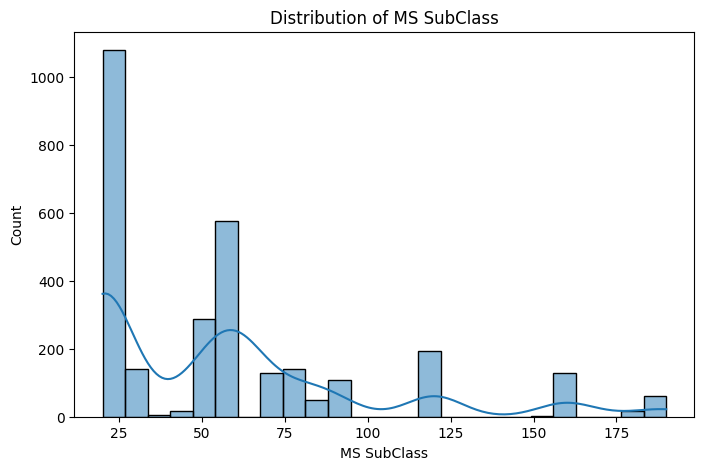

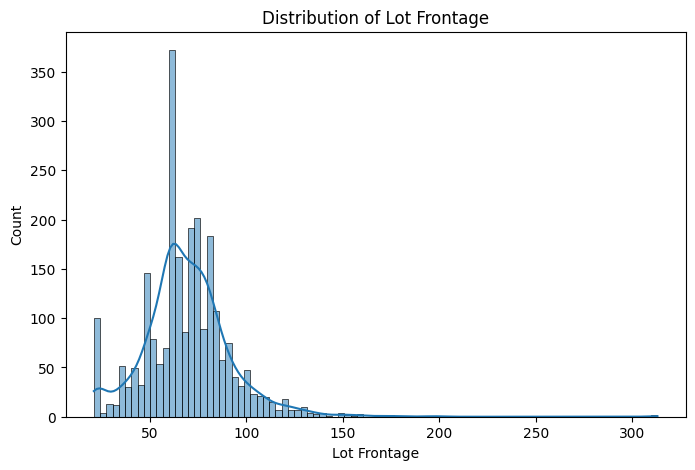

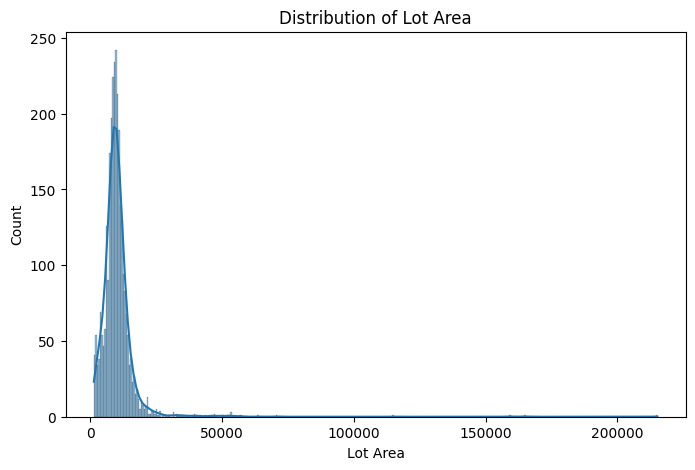

...

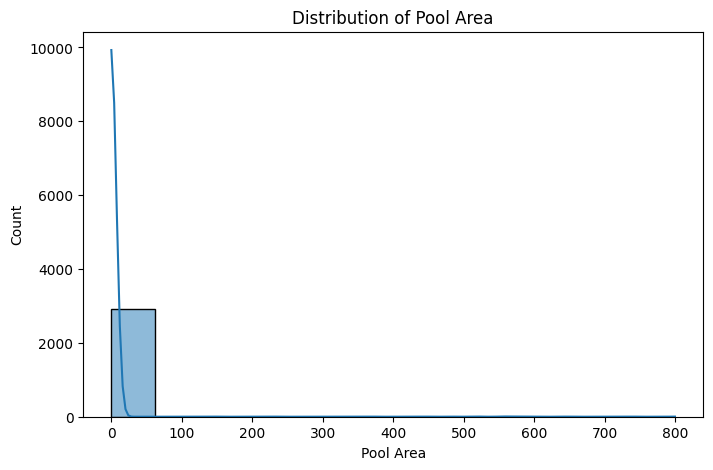

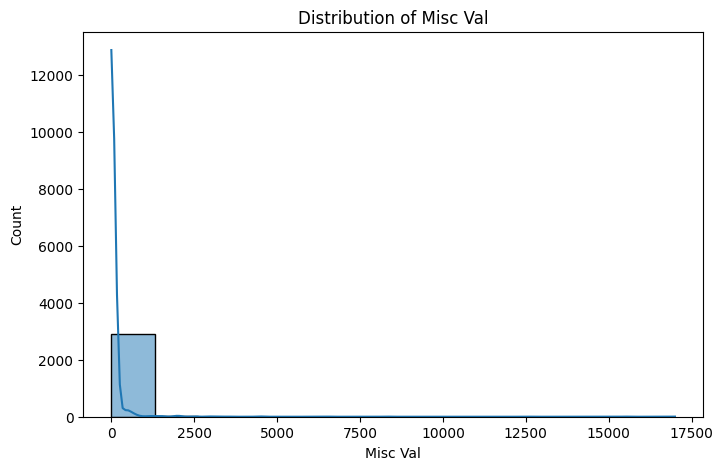

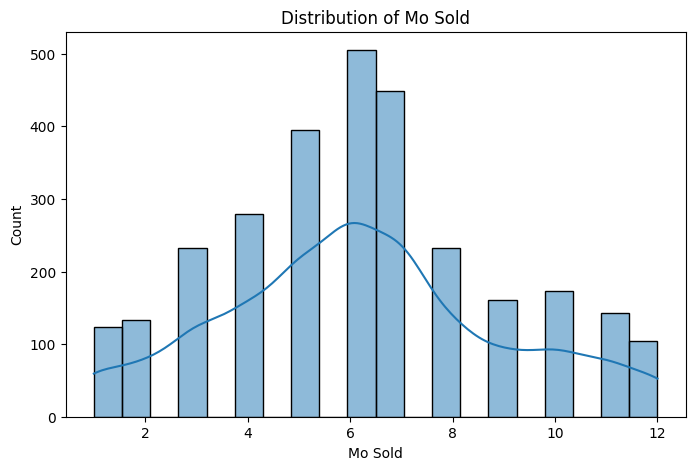

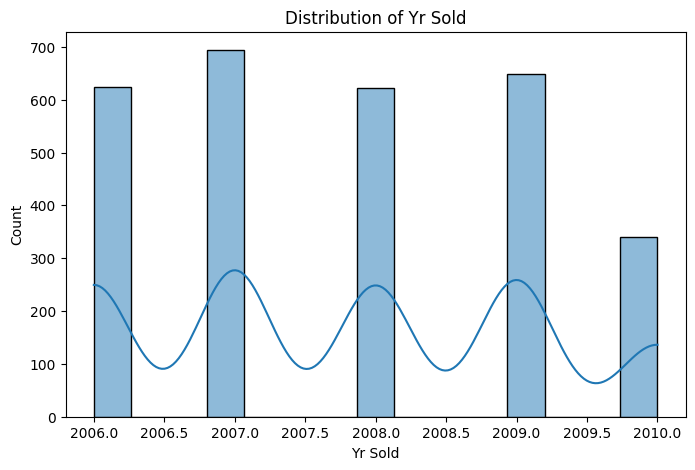

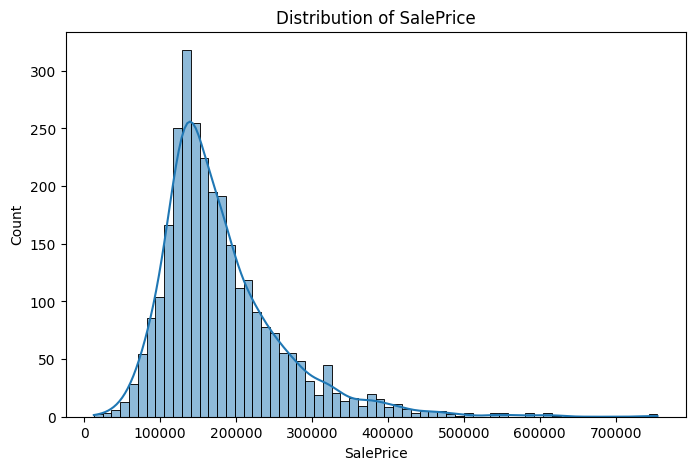

In [7]:
# Histograms for numerical columns

for col in numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()


> Order is uniformly distributed, indicating it is generated sequentially and independently of the data

> PID is bimodal at around 5.5 x 10^8 and 9 x 10^8

> MS Subclass is generally on the lower end but the frequency doesn't purely increase or purely decrease with it. Reading the dataset, it is not meant to behave as a numerical variable, but rather as a categorical label

> Lot Frontage and Lot Area are right-skewed with lots of high outliers

> Overall Qual is generally between 4 and 9, with a few occurences of 1 and 10

> Overall Cond is generally 5 but also sometimes 6 or 7, and is rarely 1, 2, 3, or 9

> YearBuilt is generally on the higher side (more houses were built more recently) with very few houses built before 1900 and between around 1904 and 1908

> Year Remod / Add is usually on the higher end or between 1950 and 1955, but is not exceptionally low in frequency for any 5-year span

> Mas Vnr Area is generally 0 or close to 0 but there are plenty of non-zero values and plenty of high outliers

> Likewise with BsmtFin SF1 and BsmtFin SF2

> Bsmt Unf SF has plenty of occurences of all values, except for a few high outliers above around 1900

> Total Bsmt SF has plenty of occurences of value 0 but most of them between around 500 and 2000, with some high outliers above 2000

> 1st Flr SF has many occurences of all values except for a few outliers above around 2000

> 2nd Flr SF has plenty of occurences of value 0 (IE no second floor)

> Low Qual Fin SF has almost all values 0 or close to 0

> Gr Liv Area has a few low and a few high outliers

> Bsmt Full Bath has most values 0, some values 1, and a few values 2

> Bsmt Half Bath is mostly 0 but has a few occurences of value 1

> Full Bath is mostly either 1 or 2 but there are very few occurences of value 0 and a few occurences of value 3

> Half Bath is mostly either 0 or 1 but there are very few occurences of value 2

> Bedroom AbvGr has a few occurences of 0 and values above 5, but mostly in the range of 1 to 4 inclusive (and most of those are value 3)

> Kitchen AbvGr is mostly 1 but there are a few occurences of value 2

> TotRms AbvGrd has an approximately normal distribution of values, with very few occurences of value 0 and values 12 or above

> Fireplaces is usually 0, 1, or 2, but very few occurences of value 3

> Garage Yr Blt is mostly on the higher side (in the range 1950 to 2000) but there is a noticeable number of values below 1950

> Garage Cars is mostly 2 but can also be 1, and is less frequently 3 or 0, and is very rarely 4 or 5

> Plenty of values with garage area close to 0 (such as if there are no garages), then plenty of values in each intermediate range from approximately 200 to 900 and right-skewed with plenty of high outliers above 1000

> Wood Deck SF is mostly close to 0 (IE most houses don't have a wood deck) and right-skewed with plenty of high outliers

> Open Porch SF is mostly close to 0 (IE no open porches) and then generally on the lower end with plenty of high outliers

> Enclosed Porch is mostly close to 0 (IE most houses don't have an enclosed porch) with a few having values between approximately 80 and 240 (I am eyeballing the plot) and very few having values above that

> Almost all houses have 0 for 3Ssn Porch (IE don't have a 3-season porch)

> Screen Porch is mostly 0 (IE most houses don't have a screen porch) and the non-zero values start from approximately 80 with an approximately normal distribution (80 is the lower end of this distribution)

> Pool Area is 0 for the vast majority of houses (IE most houses don't have a pool)

> The vast majority of houses have 0 or close to 0 for Misc Val (IE have little to no Misc Val)

> Mo Sold has plenty of entries for each value from 1 to 12, but significantly more houses are sold closer to the middle of the year than close to the start or end of the year

> Yr Sold has plenty of entries for each value from 2006 to 2009 inclusive and noticeably fewer entries for a value of 2010

> SalePrice is right-skewed with plenty of high outliers

>

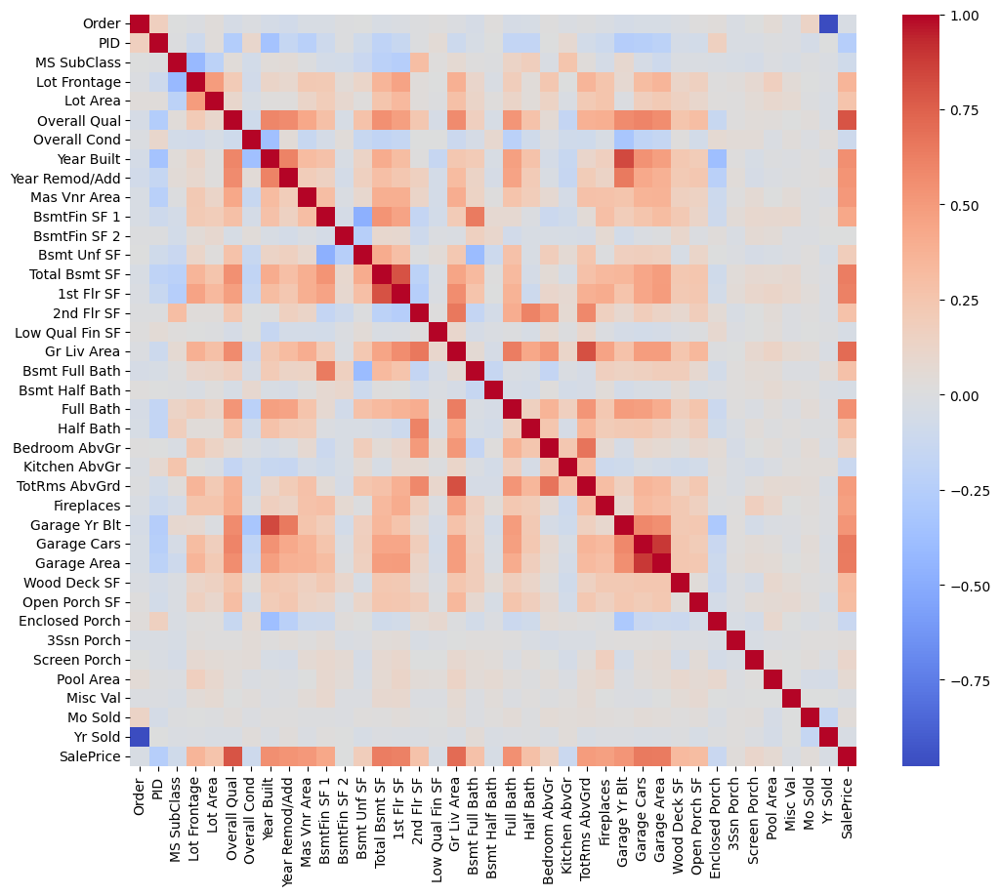

In [8]:
# Correlations of the features with each other
pd.set_option('display.max_rows', None)
corr_matrix = df[numerical_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
# annot=True leads to unreadable overlapping numbers
plt.show()

> Here, there are lots of strongly-correlated features, so I will note the ones with an absolute value of correlation coefficient above 0.5

In [9]:
# Get all the pairs of features where the absolute value of the correlation is above 0.5
corr_pairs = []
for i in range(len(numerical_cols)):
    for j in range(i+1, len(numerical_cols)):
        if abs(corr_matrix.iloc[i, j]) > 0.5:
            corr_pairs.append((numerical_cols[i], numerical_cols[j], round(corr_matrix.iloc[i, j], 2)))

# Sort corr_pairs by the value of the correlation coefficient
corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)
for i in range(len(corr_pairs)):
  print(corr_pairs[i])

('Order', 'Yr Sold', np.float64(-0.98))
('Garage Cars', 'Garage Area', np.float64(0.89))
('Year Built', 'Garage Yr Blt', np.float64(0.83))
('Gr Liv Area', 'TotRms AbvGrd', np.float64(0.81))
('Overall Qual', 'SalePrice', np.float64(0.8))
('Total Bsmt SF', '1st Flr SF', np.float64(0.8))
('Gr Liv Area', 'SalePrice', np.float64(0.71))
('Bedroom AbvGr', 'TotRms AbvGrd', np.float64(0.67))
('2nd Flr SF', 'Gr Liv Area', np.float64(0.66))
('Year Remod/Add', 'Garage Yr Blt', np.float64(0.65))
('Garage Cars', 'SalePrice', np.float64(0.65))
('BsmtFin SF 1', 'Bsmt Full Bath', np.float64(0.64))
('Garage Area', 'SalePrice', np.float64(0.64))
('Total Bsmt SF', 'SalePrice', np.float64(0.63))
('Gr Liv Area', 'Full Bath', np.float64(0.63))
('1st Flr SF', 'SalePrice', np.float64(0.62))
('Year Built', 'Year Remod/Add', np.float64(0.61))
('2nd Flr SF', 'Half Bath', np.float64(0.61))
('Overall Qual', 'Year Built', np.float64(0.6))
('Overall Qual', 'Garage Cars', np.float64(0.6))
('2nd Flr SF', 'TotRms AbvGrd

In [10]:
# get correlations with sale price, which is our target variable
corr_with_sale_price = df[numerical_cols].corrwith(df['SalePrice']).sort_values(ascending=False)
print(corr_with_sale_price)

SalePrice          1.000000
Overall Qual       0.799262
Gr Liv Area        0.706780
Garage Cars        0.647877
Garage Area        0.640401
Total Bsmt SF      0.632280
1st Flr SF         0.621676
Year Built         0.558426
Full Bath          0.545604
Year Remod/Add     0.532974
Garage Yr Blt      0.526965
Mas Vnr Area       0.508285
TotRms AbvGrd      0.495474
Fireplaces         0.474558
BsmtFin SF 1       0.432914
Lot Frontage       0.357318
Wood Deck SF       0.327143
Open Porch SF      0.312951
Half Bath          0.285056
Bsmt Full Bath     0.276050
2nd Flr SF         0.269373
Lot Area           0.266549
Bsmt Unf SF        0.182855
Bedroom AbvGr      0.143913
Screen Porch       0.112151
Pool Area          0.068403
Mo Sold            0.035259
3Ssn Porch         0.032225
BsmtFin SF 2       0.005891
Misc Val          -0.015691
Yr Sold           -0.030569
Order             -0.031408
Bsmt Half Bath    -0.035835
Low Qual Fin SF   -0.037660
MS SubClass       -0.085092
Overall Cond      -0

> In this case, the most correlated features with SalePrice are Overall Qual, Gr Liv Area, Garage Cars, Garage Area,

# Missing Values + Feature Engineering

In [11]:
def print_null_counts(df):
  null_counts = df.isnull().sum()[df.isnull().sum() > 0]
  print(null_counts)

In [12]:
print_null_counts(df)

Lot Frontage       490
Alley             2732
Mas Vnr Type      1775
Mas Vnr Area        23
Bsmt Qual           80
Bsmt Cond           80
Bsmt Exposure       83
BsmtFin Type 1      80
BsmtFin SF 1         1
BsmtFin Type 2      81
BsmtFin SF 2         1
Bsmt Unf SF          1
Total Bsmt SF        1
Electrical           1
Bsmt Full Bath       2
Bsmt Half Bath       2
Fireplace Qu      1422
Garage Type        157
Garage Yr Blt      159
Garage Finish      159
Garage Cars          1
Garage Area          1
Garage Qual        159
Garage Cond        159
Pool QC           2917
Fence             2358
Misc Feature      2824
dtype: int64


> From here, we see that many columns have only 1 missing value. Let's see those row and combine that with descriptive statistics to see how to impute or remove them

> Here, the null entry for Total Bsmt SF also has null for Pool QC, Misc Feature,

In [13]:
cols_with_nulls = ['BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', 'Electrical', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Garage Cars', 'Garage Area']

# Get all rows that have at least one null in the specified columns
rows_with_nulls = df[df[cols_with_nulls].isnull().any(axis=1)]

# For each of these rows, find and print the columns with null values
for index, row in rows_with_nulls.iterrows():
    null_columns = row.index[row.isnull()]
    print(f"Row {index}: Columns with null values: {list(null_columns)}")

Row 1341: Columns with null values: ['Alley', 'Mas Vnr Type', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1', 'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Fireplace Qu', 'Pool QC', 'Misc Feature']
Row 1497: Columns with null values: ['Alley', 'Mas Vnr Type', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Pool QC', 'Fence', 'Misc Feature']
Row 1577: Columns with null values: ['Alley', 'Mas Vnr Type', 'Electrical', 'Fireplace Qu', 'Pool QC', 'Fence', 'Misc Feature']
Row 2236: Columns with null values: ['Alley', 'Mas Vnr Type', 'Fireplace Qu', 'Garage Yr Blt', 'Garage Finish', 'Garage Cars', 'Garage Area', 'Garage Qual', 'Garage Cond', 'Pool QC', 'Misc Feature']


> Here, we see that the null for BsmtFin SF1, BsmtFin SF2, Bsmt Unf SF, Total Bsmt SF, and 1 of 2 for Bsmt Full Bath and Bsmt Half Bath come from row 1341

> Here, the 2nd null for Bsmt Full Bath and Bsmt Half Bath come from row 1497

> Here, the null for Electrical comes from row 1577

> Here, the null for Garage Cars and Garage Area comes from row 2236

In [14]:
for row_num in [1341, 1497, 1577, 2236]:
  print(df.loc[row_num])
  print('\n')

Order                   1342
PID                903230120
MS SubClass               20
MS Zoning                 RM
Lot Frontage            99.0
Lot Area                5940
Street                  Pave
Alley                    NaN
Lot Shape                IR1
Land Contour             Lvl
Utilities             AllPub
Lot Config               FR3
Land Slope               Gtl
Neighborhood         BrkSide
Condition 1            Feedr
Condition 2             Norm
Bldg Type               1Fam
House Style           1Story
Overall Qual               4
Overall Cond               7
Year Built              1946
Year Remod/Add          1950
Roof Style             Gable
Roof Matl            CompShg
Exterior 1st         MetalSd
Exterior 2nd          CBlock
Mas Vnr Type             NaN
Mas Vnr Area             0.0
Exter Qual                TA
Exter Cond                TA
Foundation             PConc
Bsmt Qual                NaN
Bsmt Cond                NaN
Bsmt Exposure            NaN
BsmtFin Type 1

In [15]:
for row_num in [1341, 1497, 1577, 2236]:
  df.drop(row_num, inplace=True)
df.reset_index(drop=True, inplace=True)
if 'dfv2' not in globals():
  dfv2 = df.copy()
print_null_counts(df)

Lot Frontage       490
Alley             2728
Mas Vnr Type      1771
Mas Vnr Area        23
Bsmt Qual           78
Bsmt Cond           78
Bsmt Exposure       81
BsmtFin Type 1      78
BsmtFin Type 2      79
Fireplace Qu      1419
Garage Type        157
Garage Yr Blt      158
Garage Finish      158
Garage Qual        158
Garage Cond        158
Pool QC           2913
Fence             2356
Misc Feature      2820
dtype: int64


> Now to check on the rows with up to 158 null values to see how to impute them. I am imputing them because we still have over 2900 rows (as we only dropped 4 of the 2930 rows) and 158 is a small proportion of that, but still can be important

> In this case, with 82 columns, it would be computationally inefficient to check the distribution of all columns in the data when comparing the entries with non-null and null values per column we're interested in. As such, I'll do a correlation matrix to see which features are most relevant. However, first I would like to see if just a few rows contribute to the null values in many columns

In [16]:
null_bsmtfin_type_1 = df[df['BsmtFin Type 1'].isnull()]
print(f"Number of rows with null BsmtFin Type 1: {len(null_bsmtfin_type_1)}")
null_bsmtfin_type_2 = df[df['BsmtFin Type 2'].isnull()]
print(f"Number of rows with null BsmtFin Type 2: {len(null_bsmtfin_type_2)}")
null_bsmtfin_type_1_and_2 = df[(df['BsmtFin Type 1'].isnull()) & (df['BsmtFin Type 2'].isnull())]
print(f"Number of rows with null BsmtFin Type 1 and 2: {len(null_bsmtfin_type_1_and_2)}")

Number of rows with null BsmtFin Type 1: 78
Number of rows with null BsmtFin Type 2: 79
Number of rows with null BsmtFin Type 1 and 2: 78


> It seems these null values for BsmtFin Type 1 and Type 2 are not intended, and all the nulls for both columns are the same rows. As such, I feel we can treat these columns the same in terms of imputation

> We can do this without losing information by imputing these values with "N/A" instead of a null value, going by the null counts for other columns when these basement columns are null

In [17]:
print_null_counts(null_bsmtfin_type_1_and_2)

Lot Frontage      14
Alley             76
Mas Vnr Type      68
Bsmt Qual         78
Bsmt Cond         78
Bsmt Exposure     78
BsmtFin Type 1    78
BsmtFin Type 2    78
Fireplace Qu      60
Garage Type       14
Garage Yr Blt     14
Garage Finish     14
Garage Qual       14
Garage Cond       14
Pool QC           77
Fence             69
Misc Feature      73
dtype: int64


In [18]:
df_temp = df.drop(null_bsmtfin_type_1_and_2.index)
print(df_temp.isnull().sum()[df_temp.isnull().sum() > 0])
print(f"Number of columns in df_temp with null values: {len(df_temp.isnull().sum()[df_temp.isnull().sum() > 0])}")
print(f"df_temp shape: {df_temp.shape}")

Lot Frontage       476
Alley             2652
Mas Vnr Type      1703
Mas Vnr Area        23
Bsmt Exposure        3
BsmtFin Type 2       1
Fireplace Qu      1359
Garage Type        143
Garage Yr Blt      144
Garage Finish      144
Garage Qual        144
Garage Cond        144
Pool QC           2836
Fence             2287
Misc Feature      2747
dtype: int64
Number of columns in df_temp with null values: 15
df_temp shape: (2848, 82)


> ** Because the columns we removed null values from (Bsmt Qual, Bsmt Cond, Bsmt Exposure, BsmtFin Type 1 and BsmtFin Type 2) were all directly related to basements, it seems that these missing values had something to do with basements, such as properties that didn't have basements at all **

> As such, I think we can just impute these missing values with standard values for the columns, such as N/A when missing. We can also do this for Bsmt Exposure, and can have a new column for "Has Basement" that is false when these are all null

In [19]:
basement_columns = ['Bsmt Qual', 'Bsmt Cond', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Bsmt Exposure']
for col in basement_columns:
  df[col] = df[col].fillna('NA')
print(df.shape)

(2926, 82)


In [20]:
# New column for "Has Basement"
df['Has Basement'] = df['Bsmt Qual'].apply(lambda x: 0 if x == 'NA' else 1)
print(len(df[df['Has Basement'] == 1]))
print(len(df[(df['Has Basement'] == 1) & (df['Bsmt Exposure'] == 'NA')]))
print(df['Bsmt Exposure'].isnull().sum())

2848
3
0


In [21]:
print(df['Bsmt Qual'].value_counts())
print(df['Bsmt Cond'].value_counts())
print(df['Bsmt Exposure'].value_counts())
print(df['BsmtFin Type 1'].value_counts())
print(df['BsmtFin Type 2'].value_counts())

Bsmt Qual
TA    1283
Gd    1217
Ex     258
Fa      88
NA      78
Po       2
Name: count, dtype: int64
Bsmt Cond
TA    2614
Gd     122
Fa     104
NA      78
Po       5
Ex       3
Name: count, dtype: int64
Bsmt Exposure
No    1904
Av     418
Gd     284
Mn     239
NA      81
Name: count, dtype: int64
BsmtFin Type 1
GLQ    859
Unf    850
ALQ    428
Rec    288
BLQ    269
LwQ    154
NA      78
Name: count, dtype: int64
BsmtFin Type 2
Unf    2497
Rec     106
LwQ      89
NA       79
BLQ      68
ALQ      53
GLQ      34
Name: count, dtype: int64


In [22]:
print(df.isnull().sum()[df.isnull().sum() > 0])
print(f"Number of columns in df_temp with null values: {len(df_temp.isnull().sum()[df_temp.isnull().sum() > 0])}")
print(f"df_temp shape: {df.shape}")

Lot Frontage      490
Alley            2728
Mas Vnr Type     1771
Mas Vnr Area       23
Fireplace Qu     1419
Garage Type       157
Garage Yr Blt     158
Garage Finish     158
Garage Qual       158
Garage Cond       158
Pool QC          2913
Fence            2356
Misc Feature     2820
dtype: int64
Number of columns in df_temp with null values: 15
df_temp shape: (2926, 83)


> Now let's see if something similar to the basement-related columns happened to the garage-related columns

In [23]:
df_garage_cols = ['Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Garage Cars', 'Garage Area']
print_null_counts(df[df_garage_cols])

Garage Type      157
Garage Yr Blt    158
Garage Finish    158
Garage Qual      158
Garage Cond      158
dtype: int64


In [24]:
print(f"Number of rows with null Garage Type: {len(df[df['Garage Type'].isnull()])}")
print(f"Number of rows with null Garage Yr Blt: {len(df[df['Garage Yr Blt'].isnull()])}")
print(f"Number of rows with null Garage Finish: {len(df[df['Garage Finish'].isnull()])}")
print(f"Number of rows with null Garage Qual: {len(df[df['Garage Qual'].isnull()])}")
print(f"Number of rows with null Garage Cond: {len(df[df['Garage Cond'].isnull()])}")
df_all_garage_null = df[(df['Garage Type'].isnull()) & (df['Garage Yr Blt'].isnull()) & (df['Garage Finish'].isnull()) & (df['Garage Qual'].isnull()) & (df['Garage Cond'].isnull())]
print(f"Number of rows with null all garage variables: {len(df_all_garage_null)}")

Number of rows with null Garage Type: 157
Number of rows with null Garage Yr Blt: 158
Number of rows with null Garage Finish: 158
Number of rows with null Garage Qual: 158
Number of rows with null Garage Cond: 158
Number of rows with null all garage variables: 157


In [25]:
print(f"Number of rows with null Garage Yr Blt, Garage Finish, Garage Qual, and Garage Cond: \n{len(df[(df['Garage Yr Blt'].isnull()) & (df['Garage Finish'].isnull()) & (df['Garage Qual'].isnull()) & (df['Garage Cond'].isnull())])}")

Number of rows with null Garage Yr Blt, Garage Finish, Garage Qual, and Garage Cond: 
158


> In this case, since the rows with a few garage variables missing have all garage variables missing, we can assume this is for a reason, such as due to homes not having garages

> As such, we can impute these with corresponding "standard" garage values corresponding to missing

In [26]:
index_nonnull_garage_type = df[(df['Garage Type'].isnull() == 0) & (df['Garage Yr Blt'].isnull()) & (df['Garage Finish'].isnull()) & (df['Garage Qual'].isnull()) & (df['Garage Cond'].isnull())].index
print(df.loc[index_nonnull_garage_type]['Garage Type']) # the garage type when the other variables are null

1355    Detchd
Name: Garage Type, dtype: object


In [27]:
# Number of entries with detached garage
print(len(df[(df['Garage Type'] == 'Detchd')]))

780


> It seems that this single entry with Garage Type = "Detchd" can be set to NA as well

In [28]:
print(df['Garage Yr Blt'].describe())
print(df['Garage Cars'].describe())
print(df['Garage Area'].describe())

count    2768.000000
mean     1978.140535
std        25.526451
min      1895.000000
25%      1960.000000
50%      1979.000000
75%      2002.000000
max      2207.000000
Name: Garage Yr Blt, dtype: float64
count    2926.000000
mean        1.766917
std         0.760800
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         5.000000
Name: Garage Cars, dtype: float64
count    2926.000000
mean      472.858852
std       215.104881
min         0.000000
25%       320.000000
50%       480.000000
75%       576.000000
max      1488.000000
Name: Garage Area, dtype: float64


> I'll impute Garage Yr Built with a placeholder value of 0, but also add a column 'Has Garage' that is false if this value is 0

> I'll impute Garage Cars with 0 due to it making sense

> I'll impute Garage Area with 0 due to it making sense

> I'll impute the categorical garage columns with 'NA'

> I'll also create a new column 'Has Garage' with 0 for rows where these columns are imputed and 1 for non-imputed rows

In [29]:
df['Garage Yr Blt'] = df['Garage Yr Blt'].fillna(0)
df['Garage Cars'] = df['Garage Cars'].fillna(0)
df['Garage Area'] = df['Garage Area'].fillna(0)
df['Garage Type'] = df['Garage Type'].fillna('NA')
df['Garage Finish'] = df['Garage Finish'].fillna('NA')
df['Garage Qual'] = df['Garage Qual'].fillna('NA')
df['Garage Cond'] = df['Garage Cond'].fillna('NA')
# ['Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Garage Cars', 'Garage Area']
df['Has Garage'] = df['Garage Yr Blt'].apply(lambda x: 0 if x == 0 else 1)
df.reset_index(drop=True, inplace=True)

In [30]:
print(df.isnull().sum()[df.isnull().sum() > 0])
print(f"Number of columns in df_temp with null values: {len(df_temp.isnull().sum()[df_temp.isnull().sum() > 0])}")

Lot Frontage     490
Alley           2728
Mas Vnr Type    1771
Mas Vnr Area      23
Fireplace Qu    1419
Pool QC         2913
Fence           2356
Misc Feature    2820
dtype: int64
Number of columns in df_temp with null values: 15


In [31]:
print(f"Number of entries with Has Garage == False: {len(df[df['Has Garage'] == 0])}")

Number of entries with Has Garage == False: 158


> Yes, it seems all the null values for garage columns have gone away

In [32]:
if 'dfv3' not in globals():
  dfv3 = df.copy()

> Now let's see what's up with Mas Vnr Area

In [33]:
null_mas_vnr_area_indices = df[df['Mas Vnr Area'].isnull()].index
print(null_mas_vnr_area_indices)

print(f"Number of rows with null Mas Vnr Area: {len(null_mas_vnr_area_indices)}")
print(df['Mas Vnr Area'].dtype)

Index([  55,  484,  517,  538,  867, 1095, 1119, 1122, 1127, 1184, 1453, 1724,
       1748, 1780, 1796, 1836, 1837, 2226, 2256, 2378, 2388, 2451, 2819],
      dtype='int64')
Number of rows with null Mas Vnr Area: 23
float64


> We could investigate the rows with null values for Mas Vnr Area, but with so many nulls filled in for other columns and so few nulls in this column, it might not be worth it. Instead, we can just fill this in with 0, since the column is of type float64

In [34]:
df['Mas Vnr Area'] = df['Mas Vnr Area'].fillna(0)
print_null_counts(df)

Lot Frontage     490
Alley           2728
Mas Vnr Type    1771
Fireplace Qu    1419
Pool QC         2913
Fence           2356
Misc Feature    2820
dtype: int64


> Now, with so many values of certain columns missing, I might just fill them in with 'NA'

> First off, Lot Frontage is numerical and doesn't make up an insane amount of the dataset, so I can make a column for "Has Lot Frontage" which is null when the row has missing values of Lot Frontage and fill in the missing Lot Frontage values with 0

> Impute Alley with 'NA', Pool QC with 'NA', Mas Vnr Type with 'NA', Fireplace Qu with 'NA', Pool QC with 'NA' Fence with 'NA', and Misc Feature with 'NA' since they're all categorical

In [35]:
df['Lot Frontage'] = df['Lot Frontage'].fillna(0)
df['Has Lot Frontage'] = df['Lot Frontage'].apply(lambda x: 0 if x == 0 else 1)

In [36]:
for col in ['Alley', 'Mas Vnr Type', 'Mas Vnr Type', 'Fireplace Qu', 'Pool QC', 'Fence', 'Misc Feature']:
  df[col] = df[col].fillna('NA')

print_null_counts(df)

Series([], dtype: int64)


> Yay, we got rid of all the nulls!

In [37]:
if 'dfv4' not in globals():
  dfv4 = df.copy()

> Now to focus on grouping infrequent values of features, so that the model doesn't "memorize" certain cases

In [38]:
# Value counts for categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
for col in categorical_cols:
    print(f"Value counts for {col}:")
    print(df[col].value_counts())
    print('\n')

Value counts for MS Zoning:
MS Zoning
RL         2271
RM          460
FV          139
RH           27
C (all)      25
I (all)       2
A (agr)       2
Name: count, dtype: int64


Value counts for Street:
Street
Pave    2914
Grvl      12
Name: count, dtype: int64


Value counts for Alley:
Alley
NA      2728
Grvl     120
Pave      78
Name: count, dtype: int64


Value counts for Lot Shape:
Lot Shape
Reg    1857
IR1     977
IR2      76
IR3      16
Name: count, dtype: int64


Value counts for Land Contour:
Land Contour
Lvl    2629
HLS     120
Bnk     117
Low      60
Name: count, dtype: int64


Value counts for Utilities:
Utilities
AllPub    2923
NoSewr       2
NoSeWa       1
Name: count, dtype: int64


Value counts for Lot Config:
Lot Config
Inside     2137
Corner      511
CulDSac     180
FR2          85
FR3          13
Name: count, dtype: int64


Value counts for Land Slope:
Land Slope
Gtl    2785
Mod     125
Sev      16
Name: count, dtype: int64


Value counts for Neighborhood:
Neighborhoo

Based on value counts and dataset description

> Here, many categories have several values that are very infrequent. I will group values that make up less than 0.5% of the data into an "other" category

> MS Zoning has only 2 rows with values "I (all)" and "A (agr)", which might screw up model training by making the model memorize those cases. Also, based on the dataset description, it makes sense if we also group "C (all)" (25) because these 3 make up businesses (A is agriculture, C is commercial, and I is industrial)

> Street = "Grvl" has only 12 values, but there are no values to group it with or other low-frequency values

> Lot Shape (Dataset description): I feel I can group Lot Shape = "IR2" (76) and "IR3" (16) since they both have lots on (2 or 3) sides of property and IR3 has few entries

> Utilities = "NoSewr" (2 rows) and "NoSeWa" (1 row) could be grouped

> Lot Config (Dataset description): Group Lot Config = "FR2" (85) and "FR3" (13)

> Land Slope (Dataset description): Group Land Slope being "Mod" or "Sev" into "Mod or Sev" since "Sev" only has 16 samples and this grouping makes logical sense

> Neighborhood = "Blueste" (10), "Greens" (8), "GrnHill" (2) and "Landmrk" (1) can be grouped into a single category for very small neighborhoods, though that could lose information on these individual neighborhoods. In any case, there isn't much information about these neighborhoods as is

> Condition1 = "RRNn" (9) and "RRNe" (6) are each < 0.5% of the values, and looking at the dataset description, they both imply houses being close to the railroad. Condition1 = "RRAn", "RRAe" can be grouped into "RRA" and "RRNne" and "RRNe" into 'RRN', since I **assume** that the railroad direction doesn't matter as much as the distance from it

> Condition2 != "Norm" has each value with < 0.5% frequency. Because of this and Condition2 being not 'Norm' only if more than 1 condition exists, I can use a single value to signify a row havig more than 1 condition without losing too much information

> Roof Style = Mansard (11) and Shed (5) into "Other"

> Roof Matl = "WdShake" (9) and "WdShngl" (7) can be grouped as Wood. Roof Matl = "Membran" (1), "ClyTile" (1), "Roll" (1), and "Metal" (1) can all be removed

> Exterior 1st (Dataset description): Exterior 1st = "BrkFace" (88) and "BrkComm" (6) since they both represent having bricks, "WdShing" (56), "AsbShng" (44) and "AsphShn" (all shingles), "Stucco" (43) and "ImStucc" (1) since they both appear to be Stucco. I will also remove the "CBlock" (2), "Stone" (2), and "PreCast" (1) values to not mess up model training

> Exterior 2nd = "Stone" (6), "AsphShn" (4), "CBlock" (2), "PreCast" (1), and "Other" (1) can all be grouped

> Mas Vnr Type = "CBlock" is just 1 sample and grouping it with other categories would lose information from those categories. I feel this isn't worth it, so I'll drop the row with Mas Vnr Type = "CBlock".

> Exter Qual = "Gd" (989) and "Ex" (107) can be grouped together to create a more robust group, but no value can sensibly be grouped with "Fa", so I'll leave that as is

> Exter Cond = "Gd" (299) and "Ex" (12) can be grouped since "Ex" has so few values, and likewise with "Fa" (67) and "Po" (3) since "Po" has so few values

> Foundation = 'Stone' (11) and 'Wood' (5)

> Bsmt Qual = "Fa" (88) and "Po" (2), but I'll keep "Gd" (1217) and "Ex" (258) as each of those categories has plenty of samples

> Bsmt Cond = "Gd" (122) and "Ex" (3), and "Fa" (104) and "Po" (5)

> Heating = "Grav" (9), "Wall" (6), "OthW" (2), "Floor" (1)

> Heating QC = "Fa" (92) and "Po" (3)

> Electrical = "FuseF" (50) and "FuseP" (8), since they are both 60-Amp fuse boxes. Not FuseA since that's over 60 Amps and not an underrepresented category. Consider dropping "Mix" (1)

> Kitchen Qual = "Fa" (70) and "Po" (1)

> Functional = "Min1" (65) and "Min2" (70) as they're both minor deductions. "Maj1" (19), "Maj2" (9), "Sev" (2), and "Sal" (2) as moderate to severe damage

> Fireplace Qu as "Fa" (75) and "Po" (46), and "Gd" (743) and "Ex" (43)

> Garage Qual = "Fa" (124) with "Po" (5), and "Gd" (24) with "Ex" (3)

> Garage Cond = "Fa" (74) with "Po" (14), and "Gd" (15) with "Ex" (3)

> Group Pool QC != "NA" to "Has Pool"

> Fence = "GdPrv" (118) and "GdWo" (112),a nd "MnPrv" (328) and "MnWw" (12)

> Misc Feature = "Gar2" (5), "Othr" (4), "Elev" (1), and "TenC" (1)

> Sale Type = "CWD" (12), "ConLI" (9), "ConLw" (8), "Oth" (7), "Con" (5), and "VWD" (1); group ConLI, ConLw, and Con (all relate to contracts based on the dataset description) with each other and others into an "other" group


In [39]:
for val in '1.5Fin', '2.5Fin', '1.5Unf', '2.5Unf':
  print(f"{val}: \n{df[df['House Style'] == val]['SalePrice'].describe()}\n")

1.5Fin: 
count       314.000000
mean     137529.923567
std       47225.667545
min       37900.000000
25%      113000.000000
50%      129675.000000
75%      149375.000000
max      410000.000000
Name: SalePrice, dtype: float64

2.5Fin: 
count         8.000000
mean     220000.000000
std      118211.976671
min      104000.000000
25%      164250.000000
50%      194000.000000
75%      223750.000000
max      475000.000000
Name: SalePrice, dtype: float64

1.5Unf: 
count        19.000000
mean     109663.157895
std       20569.589488
min       64500.000000
25%       99850.000000
50%      113000.000000
75%      120000.000000
max      139400.000000
Name: SalePrice, dtype: float64

2.5Unf: 
count        24.000000
mean     177158.333333
std       76114.764132
min       97500.000000
25%      129125.000000
50%      160950.000000
75%      206125.000000
max      415000.000000
Name: SalePrice, dtype: float64



> Here, because the sale price varies significantly with the values of House Style, I will not try to group them

In [40]:
# Value counts for categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
for col in categorical_cols:
    print(f"Value counts for {col}:")
    print(df[col].value_counts())
    print('\n')

Value counts for MS Zoning:
MS Zoning
RL         2271
RM          460
FV          139
RH           27
C (all)      25
I (all)       2
A (agr)       2
Name: count, dtype: int64


Value counts for Street:
Street
Pave    2914
Grvl      12
Name: count, dtype: int64


Value counts for Alley:
Alley
NA      2728
Grvl     120
Pave      78
Name: count, dtype: int64


Value counts for Lot Shape:
Lot Shape
Reg    1857
IR1     977
IR2      76
IR3      16
Name: count, dtype: int64


Value counts for Land Contour:
Land Contour
Lvl    2629
HLS     120
Bnk     117
Low      60
Name: count, dtype: int64


Value counts for Utilities:
Utilities
AllPub    2923
NoSewr       2
NoSeWa       1
Name: count, dtype: int64


Value counts for Lot Config:
Lot Config
Inside     2137
Corner      511
CulDSac     180
FR2          85
FR3          13
Name: count, dtype: int64


Value counts for Land Slope:
Land Slope
Gtl    2785
Mod     125
Sev      16
Name: count, dtype: int64


Value counts for Neighborhood:
Neighborhoo

In [41]:
df['MS Zoning'] = df['MS Zoning'].replace(['C (all)', 'I (all)', 'A (agr)'], 'Business')
df['Lot Shape'] = df['Lot Shape'].replace(['IR2', 'IR3'], 'IR_2_or_3')
df['Utilities'] = df['Utilities'].replace(['NoSewr', 'NoSeWa'], 'Non-public')
df['Lot Config'] = df['Lot Config'].replace(['FR2', 'FR3'], 'FR_2_or_3')
df['Land Slope'] = df['Land Slope'].replace(['Mod', 'Sev'], 'Mod_or_Sev')
df['Neighborhood'] = df['Neighborhood'].replace(['Blueste', 'Greens', 'GrnHill', 'Landmrk'], 'Small Neighborhood')
df['Condition 1'] = df['Condition 1'].replace(['RRNn', 'RRNe'], 'RRN')
df['Condition 1'] = df['Condition 1'].replace(['RRAn', 'RRAe'], 'RRA')
df['Condition 2'] = df['Condition 2'].replace(['Feedr', 'Artery', 'PosA', 'PosN', 'RRNn', 'RRAe', 'RRAn'], 'Abnormal')
df['Roof Style'] = df['Roof Style'].replace(['Shed', 'Mansard'], 'Other')
df['Roof Matl'] = df['Roof Matl'].replace(['WdShake', 'WdShngl'], 'Wood')
df['Roof Matl'] = df['Roof Matl'].replace(['Membran', 'ClyTile', 'Roll', 'Metal'], 'Other')
for col in ['Exterior 1st', 'Exterior 2nd']:
  df[col] = df[col].replace(['BrkFace', 'BrkComm'], 'Brick')
  df[col] = df[col].replace(['Wd Shng', 'WdShing'], 'Wood')
  df[col] = df[col].replace(['AsbShng', 'AsphShn'], 'Non-Wood Shingles')
  df[col] = df[col].replace(['Stucco', 'ImStucc'], 'Stucco')
  # Remove the rows with col = 'CBlock', 'Stone', 'PreCast', and 'Other'
  df = df[~((df[col] == 'CBlock') | (df[col] == 'Stone') | (df[col] == 'PreCast') | (df[col] == 'Other'))]
# Remove the row with Mas Vnr Type == 'CBlock'
df = df[df['Mas Vnr Type'] != 'CBlock']
df['Exter Qual'] = df['Exter Qual'].replace(['Fa', 'Po'], 'Other')
df['Exter Cond'] = df['Exter Cond'].replace(['Gd', 'Ex'], 'Gd or Ex')
df['Exter Cond'] = df['Exter Cond'].replace(['Fa', 'Po'], 'Fa or Po')
df['Foundation'] = df['Foundation'].replace(['Stone', 'Wood'], 'Other')
df['Bsmt Qual'] = df['Bsmt Qual'].replace(['Gd', 'Ex'], 'Gd or Ex')
df['Bsmt Qual'] = df['Bsmt Qual'].replace(['Fa', 'Po'], 'Fa or Po')
df['Bsmt Cond'] = df['Bsmt Cond'].replace(['Gd', 'Ex'], 'Gd or Ex')
df['Bsmt Cond'] = df['Bsmt Cond'].replace(['Fa', 'Po'], 'Fa or Po')
df['Heating'] = df['Heating'].replace(['Grav', 'Wall', 'OthW', 'Floor'], 'Other')
df['Heating QC'] = df['Heating QC'].replace(['Fa', 'Po'], 'Fa or Po')
df['Electrical'] = df['Electrical'].replace(['FuseF', 'FuseP'], 'Fuse60A')
df = df[df['Electrical'] != 'Mix']
df['Kitchen Qual'] = df['Kitchen Qual'].replace(['Fa', 'Po'], 'Fa or Po')
df['Functional'] = df['Functional'].replace(['Min1', 'Min2'], 'Minor')
df['Functional'] = df['Functional'].replace(['Maj1', 'Maj2', 'Sev', 'Sal'], 'Major')
df['Functional'] = df['Functional'].replace(['Maj2', 'Sev', 'Sal'], 'Other')
df['Fireplace Qu'] = df['Fireplace Qu'].replace(['Gd', 'Ex'], 'Gd or Ex')
df['Fireplace Qu'] = df['Fireplace Qu'].replace(['Fa', 'Po'], 'Fa or Po')
df['Garage Qual'] = df['Garage Qual'].replace(['Gd', 'Ex'], 'Gd or Ex')
df['Garage Qual'] = df['Garage Qual'].replace(['Fa', 'Po'], 'Fa or Po')
df['Garage Cond'] = df['Garage Cond'].replace(['Gd', 'Ex'], 'Gd or Ex')
df['Garage Cond'] = df['Garage Cond'].replace(['Fa', 'Po'], 'Fa or Po')
df['Pool QC'] = df['Pool QC'].apply(lambda x: 'NA' if x == 'NA' else 'Has Pool')
df['Fence'] = df['Fence'].replace(['GdPrv', 'GdWo'], 'Gd')
df['Fence'] = df['Fence'].replace(['MnPrv', 'MnWw'], 'Mn')
df['Misc Feature'] = df['Misc Feature'].replace(['Gar2', 'Othr', 'Elev', 'TenC'], 'Other')
df['Sale Type'] = df['Sale Type'].replace(['ConLI', 'ConLw', 'Con'], 'Contract')
df['Sale Type'] = df['Sale Type'].replace(['CWD', 'Oth', 'VWD'], 'Other')

In [42]:
for col in categorical_cols:
  print(f"{df[col].value_counts()}\n")

MS Zoning
RL          2260
RM           459
FV           139
Business      28
RH            26
Name: count, dtype: int64

Street
Pave    2900
Grvl      12
Name: count, dtype: int64

Alley
NA      2715
Grvl     120
Pave      77
Name: count, dtype: int64

Lot Shape
Reg          1847
IR1           973
IR_2_or_3      92
Name: count, dtype: int64

Land Contour
Lvl    2616
HLS     120
Bnk     116
Low      60
Name: count, dtype: int64

Utilities
AllPub        2909
Non-public       3
Name: count, dtype: int64

Lot Config
Inside       2128
Corner        507
CulDSac       179
FR_2_or_3      98
Name: count, dtype: int64

Land Slope
Gtl           2771
Mod_or_Sev     141
Name: count, dtype: int64

Neighborhood
NAmes                 440
CollgCr               267
OldTown               238
Edwards               192
Somerst               182
NridgHt               166
Gilbert               165
Sawyer                151
NWAmes                131
SawyerW               125
Mitchel               112
BrkSide

In [43]:
# Remove or group category values with frequency less than 10
df = df[df['Utilities'] != 'Non-public'] # count 3
df = df[df['Roof Matl'] != 'Other'] # count 4
df['House Style'] = df['House Style'].replace(['1.5Fin', '1.5Unf'], '1.5 Stories')
df['House Style'] = df['House Style'].replace(['2.5Fin', '2.5Unf'], '2.5 Stories')

In [44]:
for col in categorical_cols:
  print(f"{df[col].value_counts()}\n")

MS Zoning
RL          2254
RM           459
FV           139
Business      27
RH            26
Name: count, dtype: int64

Street
Pave    2894
Grvl      11
Name: count, dtype: int64

Alley
NA      2708
Grvl     120
Pave      77
Name: count, dtype: int64

Lot Shape
Reg          1845
IR1           969
IR_2_or_3      91
Name: count, dtype: int64

Land Contour
Lvl    2613
HLS     120
Bnk     114
Low      58
Name: count, dtype: int64

Utilities
AllPub    2905
Name: count, dtype: int64

Lot Config
Inside       2127
Corner        505
CulDSac       176
FR_2_or_3      97
Name: count, dtype: int64

Land Slope
Gtl           2766
Mod_or_Sev     139
Name: count, dtype: int64

Neighborhood
NAmes                 439
CollgCr               267
OldTown               238
Edwards               191
Somerst               182
NridgHt               166
Gilbert               164
Sawyer                151
NWAmes                131
SawyerW               125
Mitchel               112
BrkSide               107
Craw

In [45]:
# Drop Order and PID as those are just identifiers and could confuse our model
df.drop(['Order', 'PID'], axis=1, inplace=True)

In [46]:
if 'dfv5' not in globals():
  dfv5 = df.copy()

In [47]:
print(df.shape)
# Now, we have only 25 rows removed versus our original dataset (2930 to 2905) and only 3 more columns

(2905, 83)


> Finally, I feel ready to start building a model

> Note that we don't really need to redo our EDA since we only got rid of around 25 rows

> I will test a variety of models to predict sale price from these features, keeping in mind that many of the numerical features are somewhat significantly correlated with each other and thus working with models that can handle highly-correlated features

# Model Building

## Helper Functions

In [59]:
# Import libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from sklearn.model_selection import GridSearchCV

In [49]:
!pip install scikit-learn-intelex
from sklearnex import patch_sklearn
patch_sklearn()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.3/111.3 MB 9.0 MB/s eta 0:00:00


Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)


In [50]:
import warnings

# Suppress specific FutureWarning messages from scikit-learn
warnings.filterwarnings("ignore", category=FutureWarning, module='sklearn.utils.deprecation')
warnings.filterwarnings("ignore", category=FutureWarning, module='sklearn.base')

print("FutureWarnings from sklearn.utils.deprecation and sklearn.base have been suppressed.")

FutureWarnings from sklearn.utils.deprecation and sklearn.base have been suppressed.


In [51]:
# Function to analyze predictions versus actual values
import matplotlib.pyplot as plt
import seaborn as sns

def print_scores(y_test, y_pred):
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred):.2f}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred)):.2f}")
    print(f"R-squared: {r2_score(y_test, y_pred):.2f}")

def compare_predictions_values(y_test, y_pred, model_name='', to_plot=True, to_print_scores=True):
  if to_plot == True:
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=y_test, y=y_pred)
    plt.xlabel('Actual SalePrice')
    plt.ylabel('Predicted SalePrice')
    if model_name != '':
        plt.title(f'{model_name}: Actual vs. Predicted SalePrice')
    else:
        plt.title('Actual vs. Predicted SalePrice')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--') # Perfect prediction line
    plt.show()

    # Plot the residuals
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 7))
    sns.histplot(residuals, kde=True)
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    if model_name != '':
        plt.title(f'{model_name}: Distribution of Residuals')
    else:
        plt.title('Distribution of Residuals')
    plt.show()

    # Plot the actual values versus the residuals
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=y_test, y=residuals)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual SalePrice')
    plt.ylabel('Residuals')
    if model_name != '':
        plt.title(f'{model_name}: Actual Sale Price vs. Residual')
    else:
        plt.title('Actual Sale Price vs. Residual')
    plt.show()
  if (to_print_scores == True):
      print_scores(y_test, y_pred)

In [52]:
# Print the scores for the normal/low price, high price, and all testing data
def print_scores_low_normal_high_all(y_test_normal_low_price, y_pred_normal_low_price, y_test_high_price, y_pred_high_price, y_test, y_pred_test, model_name=''):
  first_string = ''
  if model_name != '':
    first_string = f"{model_name}" # the string to go before the Full Dataset / Low to Normal Sale Price / High Sale
  else:
    first_string = "Model"

  print(f"\n{first_string}: Low to Normal Sale Price")
  print_scores(y_test_normal_low_price, y_pred_normal_low_price)

  print(f"\n{first_string}: High Sale Price")
  print_scores(y_test_high_price, y_pred_high_price)

  print(f"\n{first_string}: Full Dataset")
  print_scores(y_test, y_pred_test)

In [53]:
# Quickly get the model performance on low to normal price, high price, and all testing data
def model_compare_predictions_values_all(model, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, to_plot = True, model_name=''):
  if model_name == '':
    model_name = 'Model'
  y_pred = model.predict(X_test_preprocessed)
  y_pred_normal_low_price = model.predict(X_test_normal_low_price_preprocessed)
  y_pred_high_price = model.predict(X_test_high_price_preprocessed)
  y_pred_all_data = model.predict(X_test_preprocessed)
  if to_plot == True:
    print(f"\n{model_name}: Low to Normal Sale Price")
    compare_predictions_values(y_test_normal_low_price, y_pred_normal_low_price, model_name=f'{model_name} on Normal/Low Price Data', to_plot = to_plot, to_print_scores=False)
    print(f"\n{model_name}: High Sale Price")
    compare_predictions_values(y_test_high_price, y_pred_high_price, model_name=f'{model_name} on High Price Data', to_plot = to_plot, to_print_scores=False)
    print(f"\n{model_name}: Full Dataset")
    compare_predictions_values(y_test, y_pred_all_data, model_name=f'{model_name} on Full Dataset', to_plot = to_plot, to_print_scores=False)

  print(f"\n{model_name}: Scores")
  print_scores_low_normal_high_all(y_test_normal_low_price, y_pred_normal_low_price, y_test_high_price, y_pred_high_price, y_test, y_pred_all_data, model_name = model_name)

In [54]:
def compare_predictions_values_all(y_test_normal_low_price, y_pred_normal_low_price, y_test_high_price, y_pred_high_price, y_test, y_pred_test, to_plot = True, model_name=''):
  first_string = ''
  if model_name != '':
    first_string = model_name # the string to go before the Full Dataset / Low to Normal Sale Price / High Sale
  if model_name == '':
    first_string = "Model"

  if to_plot == True:
    print(f"\n{first_string}: Low to Normal Sale Price")
    compare_predictions_values(y_test_normal_low_price, y_pred_normal_low_price, model_name=f'{first_string} on Normal/Low Price Data', to_plot = to_plot, to_print_scores=False)
    print(f"\n{first_string}: High Sale Price")
    compare_predictions_values(y_test_high_price, y_pred_high_price, model_name=f'{first_string} on High Price Data', to_plot = to_plot, to_print_scores=False)
    print(f"\n{first_string}: Full Dataset")
    compare_predictions_values(y_test, y_pred_test, model_name=f'{first_string} on Full Dataset', to_plot = to_plot, to_print_scores=False)

  print(f"\n{first_string}: Scores")
  print_scores_low_normal_high_all(y_test_normal_low_price, y_pred_normal_low_price, y_test_high_price, y_pred_high_price, y_test, y_pred_test, model_name = model_name)

In [55]:
def log_undo_model_compare_predictions_values_all(model, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, to_plot = True, model_name=''):
  if model_name == '':
    model_name = 'Model'
  y_pred_all_log = model.predict(X_test_preprocessed)
  y_pred_normal_low_price_log = model.predict(X_test_normal_low_price_preprocessed)
  y_pred_high_price_log = model.predict(X_test_high_price_preprocessed)

  y_pred_all = np.exp(y_pred_all_log)
  y_pred_normal_low_price = np.exp(y_pred_normal_low_price_log)
  y_pred_high_price = np.exp(y_pred_high_price_log)

  compare_predictions_values_all(y_test_normal_low_price, y_pred_normal_low_price, y_test_high_price, y_pred_high_price, y_test, y_pred_all, to_plot = to_plot, model_name=model_name)
  # this function has the scores printed

In [56]:
RS = 42 # random state for reproducibility

## Train/Test Splitting and Transforming the Data

> One thing to also note is that we don't have very many samples for very high sale prices, and there are lots of high outliers for sale price. As such, we will note the metrics for the full dataset, the dataset with non-outlier sale prices, and the dataset with high outlier sale prices

In [57]:
# Create a column transformer to apply different transformations to different columns

# Separate features (X) and target (y)
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']

# Identify numerical and categorical features
numerical_features = X.select_dtypes(include=np.number).columns.tolist()
categorical_features = X.select_dtypes(include='object').columns.tolist()

# Create preprocessing pipelines for numerical and categorical features
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Create a column transformer to apply different transformations to different columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS)

# Apply preprocessing once to the training and test data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)
preprocessed_feature_names = preprocessor.get_feature_names_out() # Get feature names after preprocessing

## Lasso Regression

> Starting with Lasso Regression since it can help with feature selection

In [60]:
from sklearn.linear_model import Lasso

# Create the Lasso regression pipeline
lasso_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Lasso(random_state=RS)) # Using a default alpha for now, will tune later
])


In [62]:
# Train the Lasso model using the original (unpreprocessed) X_train DataFrame

# Define a range of alpha values to search
# It's good practice to search on a logarithmic scale for alpha
param_grid = {
    'regressor__alpha': np.logspace(-4, 0, 100) # search from 0.0001 to 1.0
}

# Create the GridSearchCV object
# cv=5 means 5-fold cross-validation
# scoring='neg_mean_squared_error' is used because GridSearchCV maximizes score,
# so we maximize negative MSE to minimize positive MSE
lasso_grid_search = GridSearchCV(lasso_pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit GridSearchCV to the training data
lasso_grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['MS '
                                                                          'SubClass',
                                                                          'Lot '
                                                                          'Frontage',
                                                                          'Lot '
                                                                          'Area',
                                                                          'Overall '
                                                                          'Qual',
                                                                          'Overall '
                                                                          'Cond',
                                                                          'Year '
                                                                          'Built',
                                                                          'Year '
                                                                          'Remod/Add',
                                                                          'Mas '
                                                                          'Vnr '
                                                                          'Area',
                                                                          'BsmtFin '
                                                                          'SF '
                                                                          '1',
                                                                          'BsmtFin '
                                                                          'SF '
                                                                          '2',
                                                                          'Bsmt '
                                                                          'Unf '
                                                                          'SF',
                                                                          'Total '
                                                                          'Bsmt '
                                                                          'SF',
                                                                          '1st '
                                                                          'Flr '
                                                                          'SF',
                                                                          '2nd '
                                                                          'Flr '
                                                                          'SF',
                                                                          'Low '
                                                                          'Qual '...
       1.17681195e-01, 1.29154967e-01, 1.41747416e-01, 1.55567614e-01,
       1.70735265e-01, 1.87381742e-01, 2.05651231e-01, 2.25701972e-01,
       2.47707636e-01, 2.71858824e-01, 2.98364724e-01, 3.27454916e-01,
       3.59381366e-01, 3.94420606e-01, 4.32876128e-01, 4.75081016e-01,
       5.21400829e-01, 5.72236766e-01, 6.28029144e-01, 6.89261210e-01,
       7.56463328e-01, 8.30217568e-01, 9.11162756e-01, 1.00000000e+00])},
             scoring='neg_mean_squared_error')

Best Alpha for Lasso Regression: 1.0000


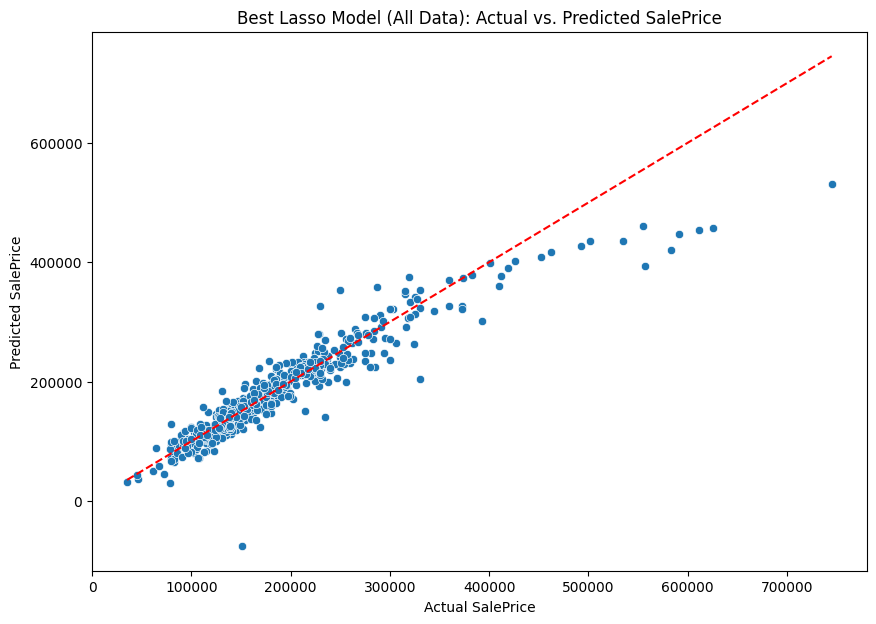

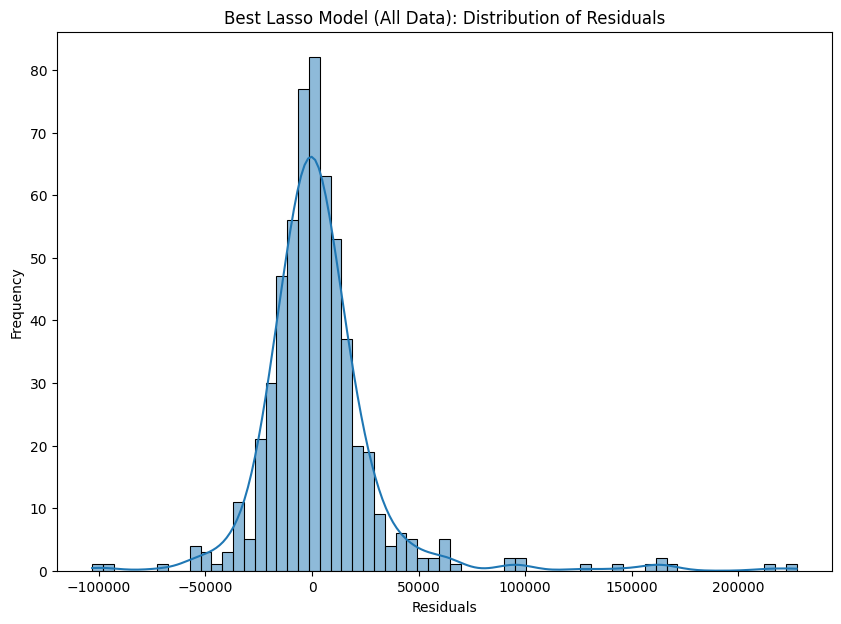

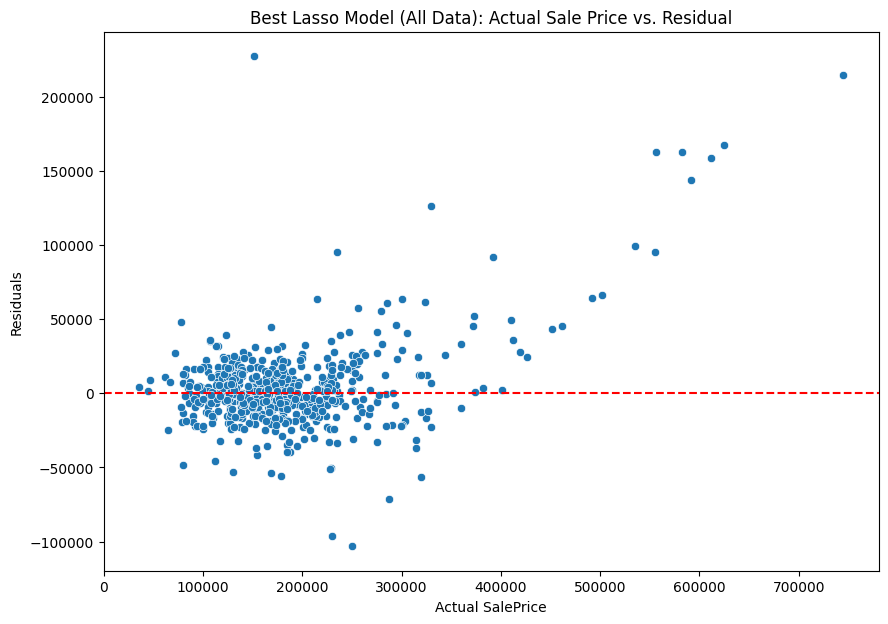

Mean Squared Error: 854451585.02
Root Mean Squared Error: 29231.00
R-squared: 0.88


In [63]:
# Get the best alpha value
best_alpha_lasso = lasso_grid_search.best_params_['regressor__alpha']
print(f"Best Alpha for Lasso Regression: {best_alpha_lasso:.4f}")

# Get the best model
best_lasso_model = lasso_grid_search.best_estimator_

# Make predictions with the best model
y_pred_best_lasso = best_lasso_model.predict(X_test)

compare_predictions_values(y_test, y_pred_best_lasso, model_name='Best Lasso Model (All Data)')

### See the features selected by Lasso Regression

In [ ]:
# See the features with non-zero coefficients selected by lasso regression
lasso_coefs = best_lasso_model.named_steps['regressor'].coef_
feature_names = best_lasso_model.named_steps['preprocessor'].get_feature_names_out()
lasso_selected_features = feature_names[lasso_coefs != 0]
# print(lasso_selected_features)
print(f"Number of selected features: {len(lasso_selected_features)}")

Number of selected features: 217


## Redoing the preprocessor steps for the selected features

In [ ]:
from sklearn.feature_selection import SelectFromModel

# Create a column transformer to apply different transformations to different columns

# Separate features (X) and target (y)
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS)

# Identify numerical and categorical features
numerical_features = X.select_dtypes(include=np.number).columns.tolist()
categorical_features = X.select_dtypes(include='object').columns.tolist()

# Create initial preprocessing steps (scaling and one-hot encoding)
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Create a ColumnTransformer for these initial preprocessing steps
initial_preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define a Lasso model for feature selection
# We'll use the best alpha (1.0) determined by GridSearchCV from cell 6f1058e4
best_alpha_lasso = best_lasso_model.named_steps['regressor'].alpha
lasso_selector = Lasso(alpha=best_alpha_lasso, random_state=RS, max_iter=5000) # Added max_iter for stability

# Create the final 'preprocessor' as a Pipeline that includes initial transformations and Lasso feature selection
preprocessor = Pipeline(steps=[
    ('initial_transform', initial_preprocessor),
    ('feature_selection', SelectFromModel(estimator=lasso_selector, prefit=False)) # prefit=False as it will be fitted in this pipeline
])

# Apply this combined preprocessor to the training and test data
# The fit_transform on X_train will fit the initial_transform and the feature_selection
X_train_preprocessed = preprocessor.fit_transform(X_train, y_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Get feature names after all preprocessing steps
selected_features_mask = preprocessor.named_steps['feature_selection'].get_support()
initial_transformed_feature_names = preprocessor.named_steps['initial_transform'].get_feature_names_out()
preprocessed_feature_names = initial_transformed_feature_names[selected_features_mask]

print(f"Original number of features after scaling and one-hot encoding (before Lasso): {len(initial_transformed_feature_names)}")
print(f"Number of features after global Lasso selection: {X_train_preprocessed.shape[1]}")
print(f"Shape of X_train_preprocessed after Lasso: {X_train_preprocessed.shape}")
print(f"Shape of X_test_preprocessed after Lasso: {X_test_preprocessed.shape}")

Original number of features after scaling and one-hot encoding (before Lasso): 246
Number of features after global Lasso selection: 215
Shape of X_train_preprocessed after Lasso: (2324, 215)
Shape of X_test_preprocessed after Lasso: (581, 215)


In [ ]:
# Apply this feature selection to our data

# Create a list to hold the original feature names
original_selected_feature_names = []

# Iterate through lasso_selected_features and convert them back to original names
for feature_name_prefixed in lasso_selected_features:
    if feature_name_prefixed.startswith('num__'):
        original_selected_feature_names.append(feature_name_prefixed.replace('num__', ''))
    elif feature_name_prefixed.startswith('cat__'):
        # For categorical features, we need to find the original column name
        # Example: 'cat__MS Zoning_Business' should map to 'MS Zoning'
        # We need to find the longest matching prefix from our original categorical_features list
        stripped_feature_name = feature_name_prefixed.replace('cat__', '')
        best_match_original_cat_col = None
        for original_cat_col in categorical_features:
            # Ensure the stripped name starts with the original cat col and handle cases like 'Garage Type_2Types'
            if stripped_feature_name.startswith(original_cat_col) and \
               (len(stripped_feature_name) == len(original_cat_col) or \
                (len(stripped_feature_name) > len(original_cat_col) and stripped_feature_name[len(original_cat_col)] == '_')):
                if best_match_original_cat_col is None or len(original_cat_col) > len(best_match_original_cat_col):
                    best_match_original_cat_col = original_cat_col
        if best_match_original_cat_col and best_match_original_cat_col not in original_selected_feature_names: # Avoid duplicates
            original_selected_feature_names.append(best_match_original_cat_col)


# Remove duplicate feature names that might arise from one-hot encoding if multiple categories of one feature were selected
original_selected_feature_names = list(set(original_selected_feature_names))

# Add 'SalePrice' to the list of columns to select from the original df
columns_to_select = original_selected_feature_names + ['SalePrice']

# Filter the original df using these original column names
df_lasso_selected = df[columns_to_select]

In [ ]:
print(df_lasso_selected.shape)

(2905, 82)


## Separating data based on low to medium and high sale price

### Creating dataframes for low to medium sale price and high sale price

In [ ]:
Q1 = y_train.quantile(0.25)
Q3 = y_train.quantile(0.75)
IQR = Q3 - Q1
outlier_lower_bound = Q3 + 1.5 * IQR

print(f"First Quartile (Q1): {Q1:.2f}")
print(f"Third Quartile (Q3): {Q3:.2f}")
print(f"Interquartile Range (IQR): {IQR:.2f}")
print(f"Upper Bound for Outliers: {outlier_lower_bound:.2f}")

First Quartile (Q1): 129000.00
Third Quartile (Q3): 213000.00
Interquartile Range (IQR): 84000.00
Upper Bound for Outliers: 339000.00


In [ ]:
for val in [200000, 250000, 300000, 350000]:
  print(f"{val}: \n{df[df['SalePrice'] > val]['SalePrice'].describe()}\n")

200000: 
count       850.000000
mean     277700.910588
std       77196.760893
min      200100.000000
25%      223625.000000
50%      254825.000000
75%      309750.000000
max      755000.000000
Name: SalePrice, dtype: float64

250000: 
count       441.000000
mean     327928.029478
std       77818.972353
min      250580.000000
25%      272500.000000
50%      305000.000000
75%      360000.000000
max      755000.000000
Name: SalePrice, dtype: float64

300000: 
count       229.000000
mean     378954.082969
std       77849.976257
min      301000.000000
25%      321000.000000
50%      356383.000000
75%      405749.000000
max      755000.000000
Name: SalePrice, dtype: float64

350000: 
count       119.000000
mean     430047.050420
std       77849.583247
min      354000.000000
25%      376794.000000
50%      404000.000000
75%      456173.500000
max      755000.000000
Name: SalePrice, dtype: float64



In [ ]:
print(f"{outlier_lower_bound}: \n{df[df['SalePrice'] > outlier_lower_bound]['SalePrice'].describe()}\n")

339000.0: 
count       137.000000
mean     418926.014599
std       77999.884721
min      339750.000000
25%      370878.000000
50%      394617.000000
75%      445000.000000
max      755000.000000
Name: SalePrice, dtype: float64



In [ ]:
print(df.shape)

(2905, 83)


From here, I think that using the upper bound based on an outlier could leave too few samples in the data for higher sale prices. As such, I will stick to using 250,000 as the threshold, so that we have plenty of data for the higher end of sale prices

In [ ]:
upper_bound_price = 250000

In [ ]:
df_high_price = df[df['SalePrice'] > upper_bound_price]
df_normal_low_price = df[df['SalePrice'] <= upper_bound_price]

print(f"Shape of df_high_price: {df_high_price.shape}")
print(f"Shape of df_normal_low_price: {df_normal_low_price.shape}")

Shape of df_high_price: (441, 83)
Shape of df_normal_low_price: (2464, 83)


In [ ]:
# Create boolean masks based on y_train and y_test
y_train_high_mask = y_train > upper_bound_price
y_test_high_mask = y_test > upper_bound_price
y_train_normal_low_mask = y_train <= upper_bound_price
y_test_normal_low_mask = y_test <= upper_bound_price

# Apply the masks to the respective X and y sets
# Convert boolean Series to NumPy arrays for positional indexing to avoid IndexingError
X_train_high_price = X_train[y_train_high_mask.to_numpy()]
X_test_high_price = X_test[y_test_high_mask.to_numpy()]
y_train_high_price = y_train[y_train_high_mask.to_numpy()]
y_test_high_price = y_test[y_test_high_mask.to_numpy()]

X_train_normal_low_price = X_train[y_train_normal_low_mask.to_numpy()]
X_test_normal_low_price = X_test[y_test_normal_low_mask.to_numpy()]
y_train_normal_low_price = y_train[y_train_normal_low_mask.to_numpy()]
y_test_normal_low_price = y_test[y_test_normal_low_mask.to_numpy()]

In [ ]:
print(y_train_normal_low_price.shape)
print(y_test_normal_low_price.shape)
print(y_train_high_price.shape)
print(y_test_high_price.shape)

(1965,)
(499,)
(359,)
(82,)


> Okay, so 1965 training and 499 test samples for normal/low price data, and 359 training and 82 test samples for high price data

### Prepare Normal/Low and High Sale Price Data for Modeling

In [ ]:
X_train_normal_low_price_preprocessed = preprocessor.transform(X_train_normal_low_price)
X_test_normal_low_price_preprocessed = preprocessor.transform(X_test_normal_low_price)
X_train_high_price_preprocessed = preprocessor.transform(X_train_high_price)
X_test_high_price_preprocessed = preprocessor.transform(X_test_high_price)

print(f"Shape of X_normal_low_price_train_preprocessed: {X_train_normal_low_price_preprocessed.shape}")
print(f"Shape of X_normal_low_price_test_preprocessed: {X_test_normal_low_price_preprocessed.shape}")


print(f"Shape of X_high_price_train_preprocessed: {X_train_high_price_preprocessed.shape}")
print(f"Shape of X_high_price_test_preprocessed: {X_test_high_price_preprocessed.shape}")

Shape of X_normal_low_price_train_preprocessed: (1965, 215)
Shape of X_normal_low_price_test_preprocessed: (499, 215)
Shape of X_high_price_train_preprocessed: (359, 215)
Shape of X_high_price_test_preprocessed: (82, 215)


## Random Forest


Random Forest (Non-Tuned): Low to Normal Sale Price


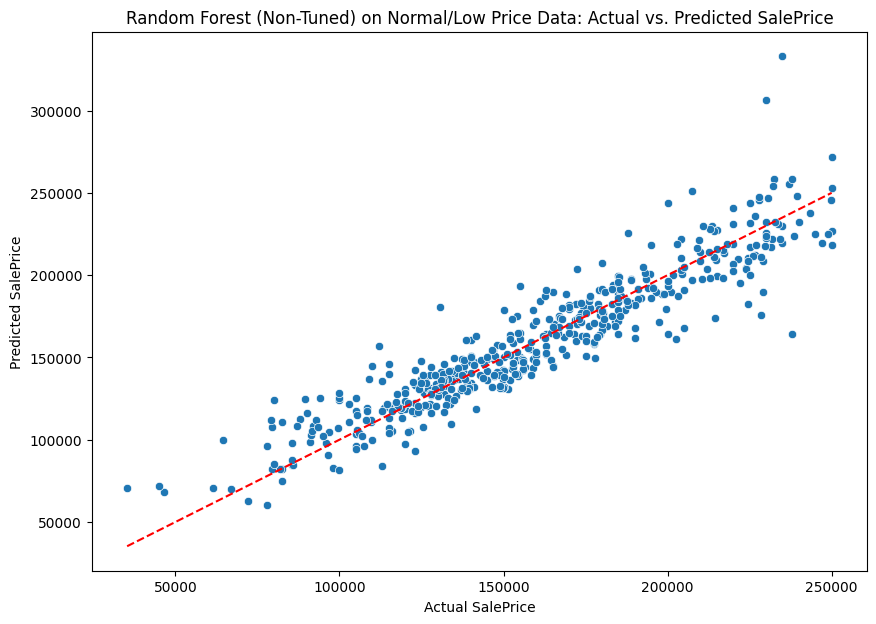

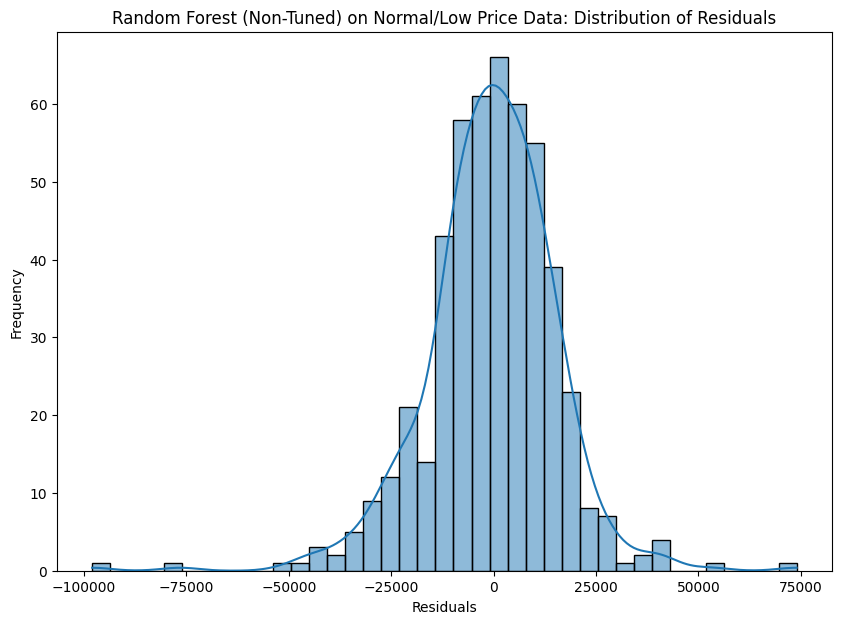

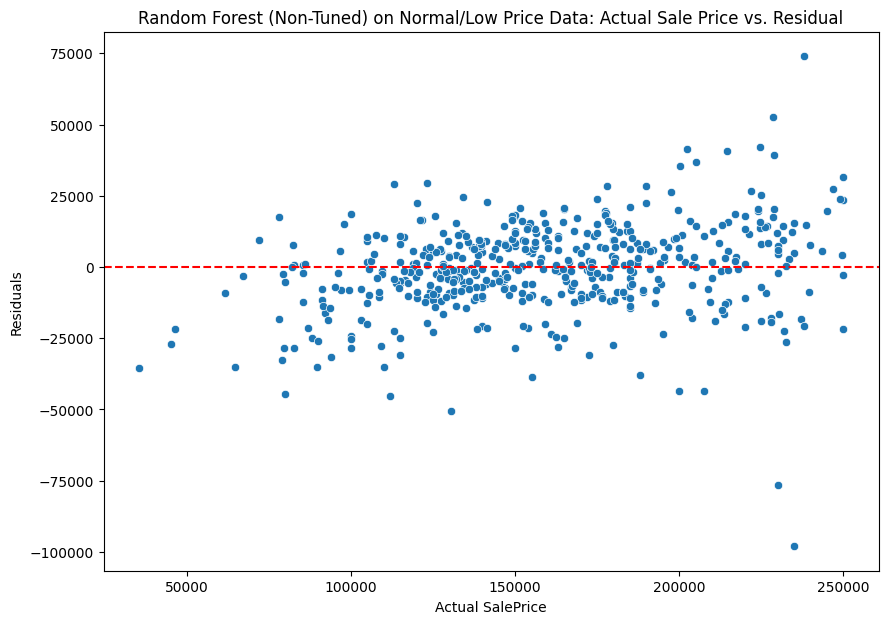


Random Forest (Non-Tuned): High Sale Price


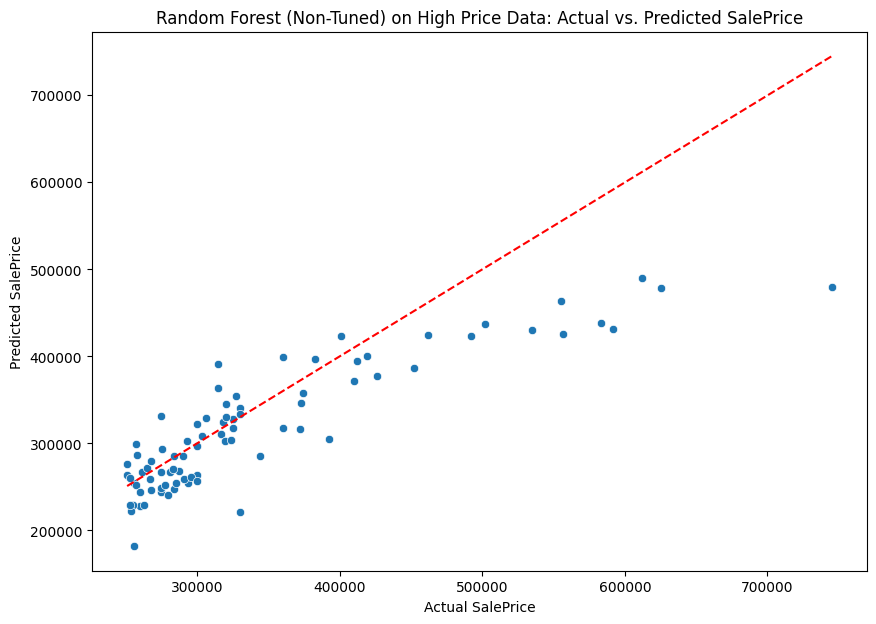

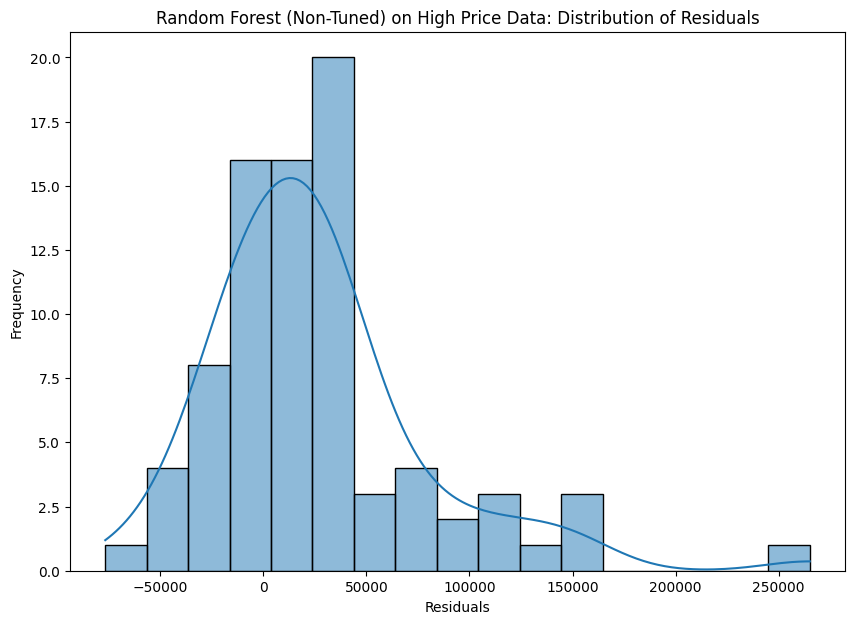

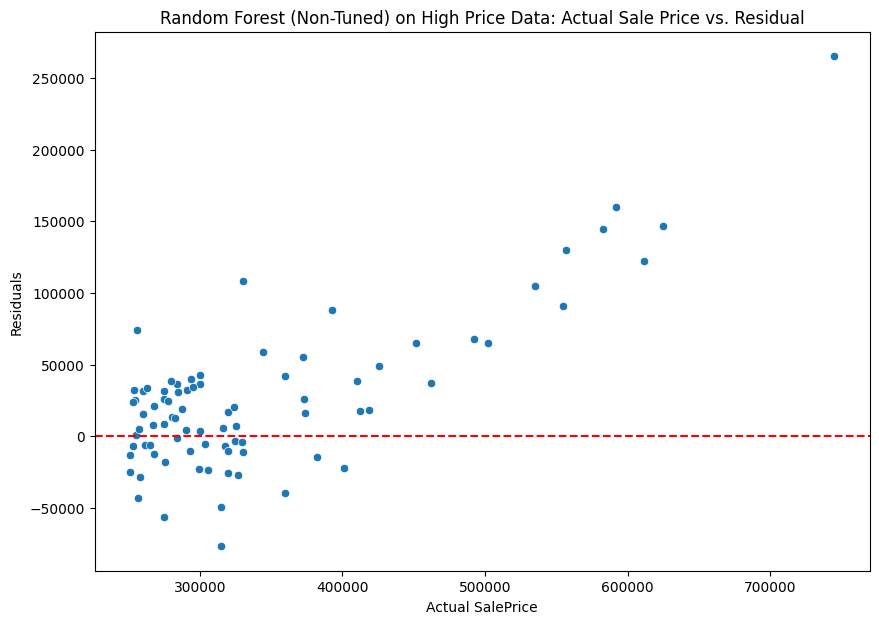


Random Forest (Non-Tuned): Full Dataset


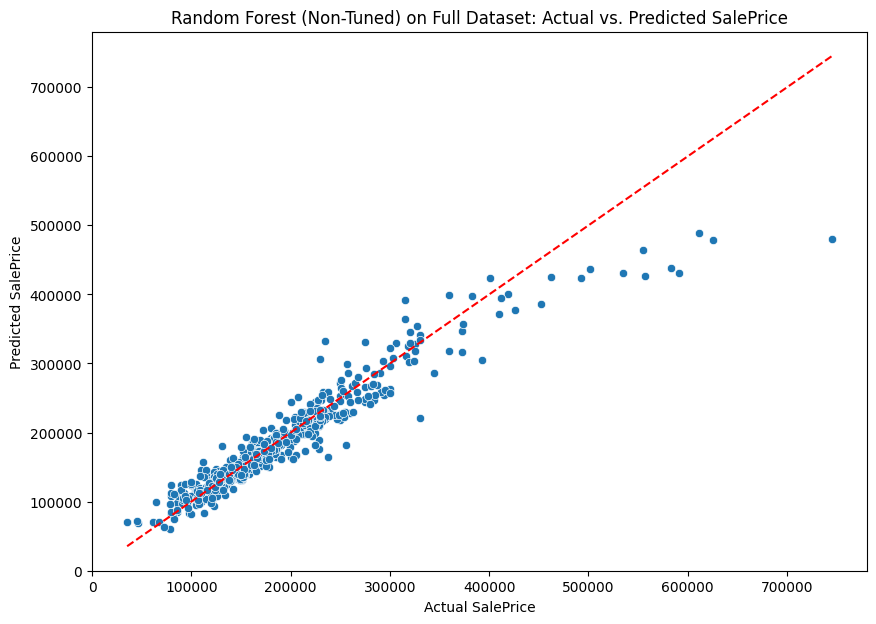

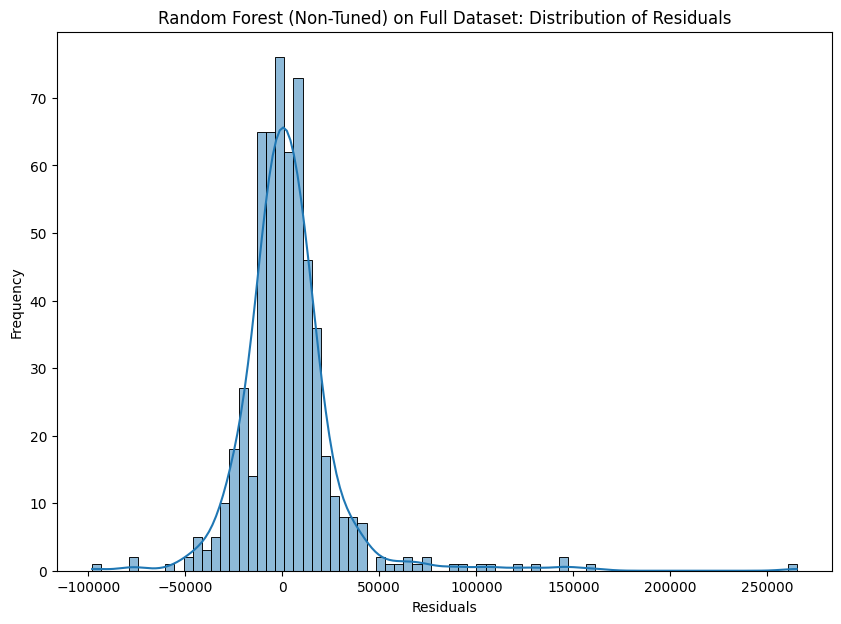

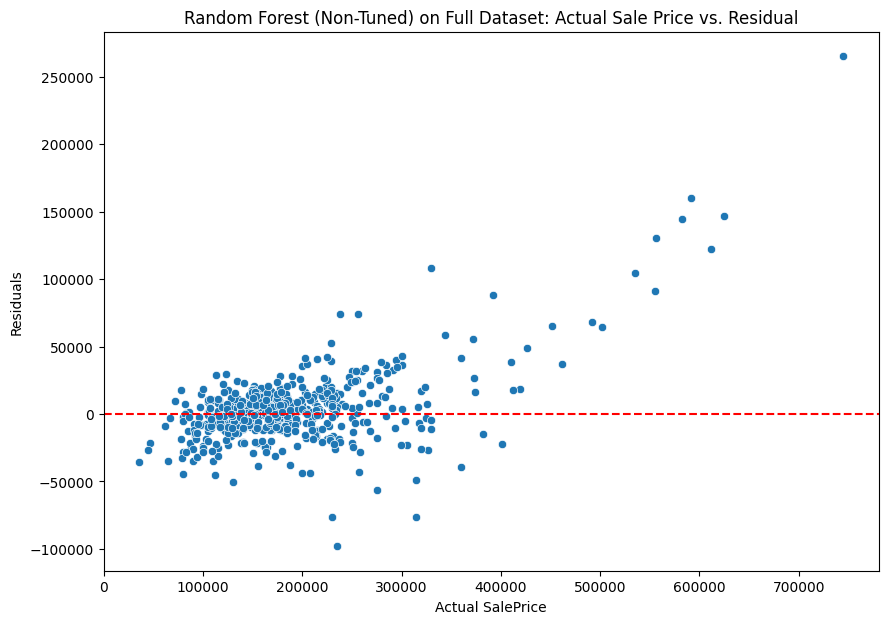


Random Forest (Non-Tuned): Scores

Random Forest (Non-Tuned): Low to Normal Sale Price
Mean Squared Error: 251781715.06
Root Mean Squared Error: 15867.63
R-squared: 0.86

Random Forest (Non-Tuned): High Sale Price
Mean Squared Error: 3452785997.90
Root Mean Squared Error: 58760.41
R-squared: 0.68

Random Forest (Non-Tuned): Full Dataset
Mean Squared Error: 703558567.37
Root Mean Squared Error: 26524.68
R-squared: 0.90


In [ ]:
from sklearn.ensemble import RandomForestRegressor


rfr = RandomForestRegressor(random_state=RS) # Added random_state for reproducibility
rfr.fit(X_train_preprocessed, y_train)
y_pred_rf = rfr.predict(X_test_preprocessed)

model_compare_predictions_values_all(rfr, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'Random Forest (Non-Tuned)')

> Currently, we see that there are plenty of high sale price outliers contributing to high residuals. However, there are also plenty of intermediate sale price values contributing to high residuals, so maybe this model is not ideal for our purposes

> One thing to try, just to be sure, is to take log transforms to keep all sale price values numerically close together, and maybe this will improve the model's predictions for higher values of sale price

### Hyperparameter Tuning for Random Forest

In [ ]:
# Hyperparameter tuning for Random Forest
grid_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_rfr_all = GridSearchCV(rfr, grid_params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_rfr_all.fit(X_train_preprocessed, y_train)
grid_search_rfr_all.best_params_

{'max_depth': 20,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 100}


Random Forest (Tuned): Low to Normal Sale Price


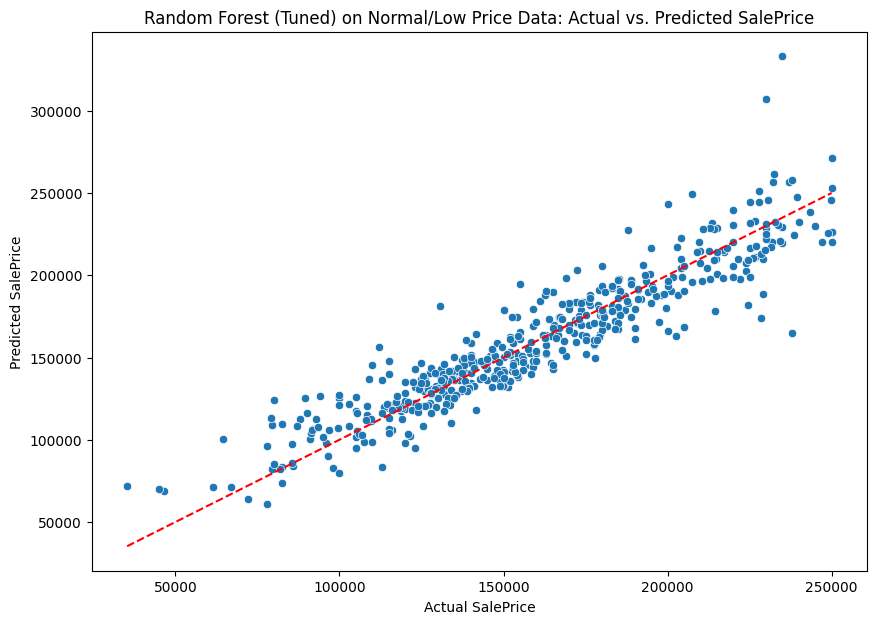

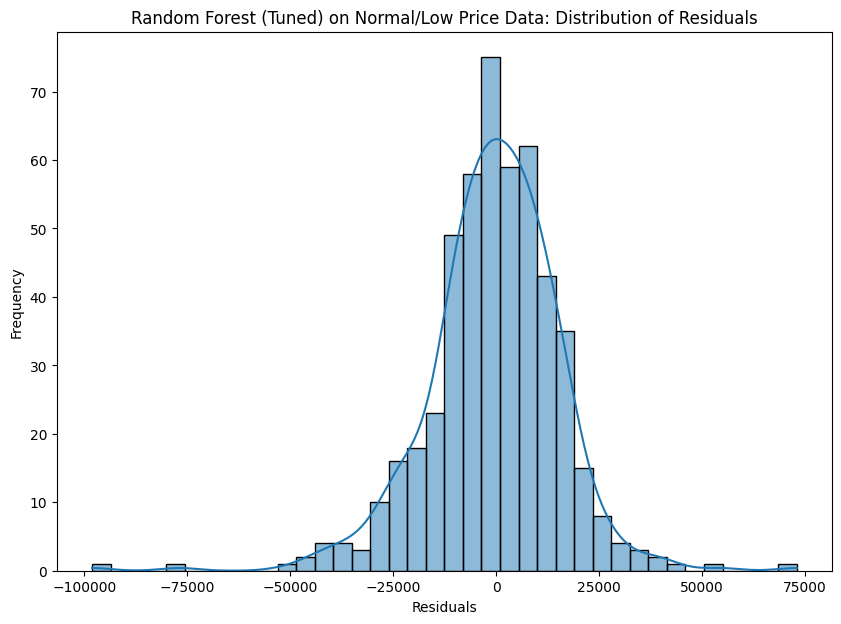

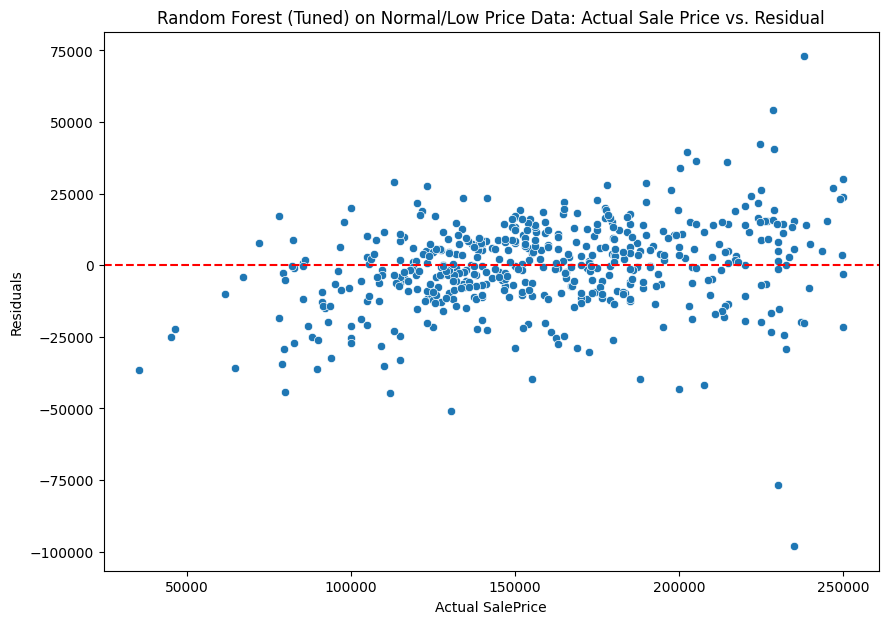


Random Forest (Tuned): High Sale Price


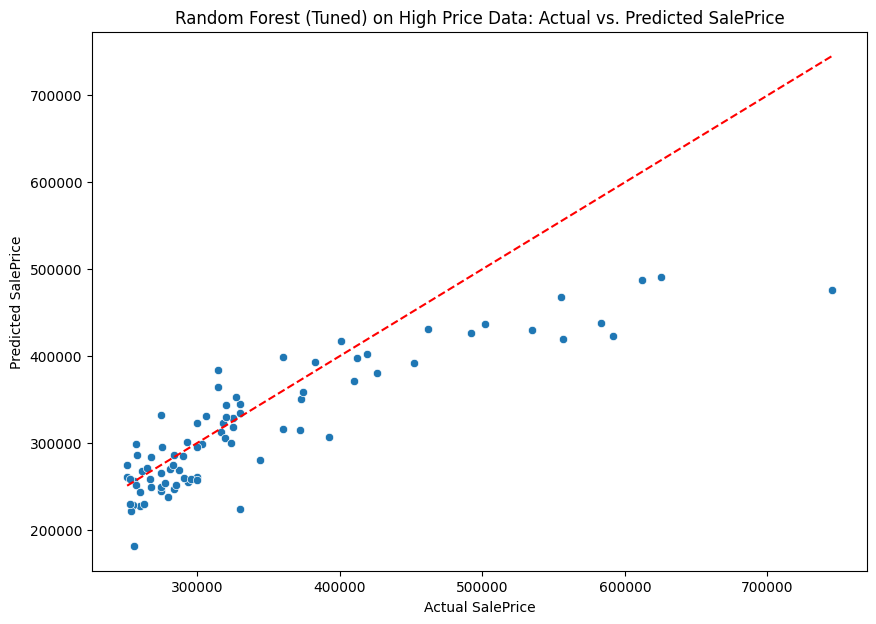

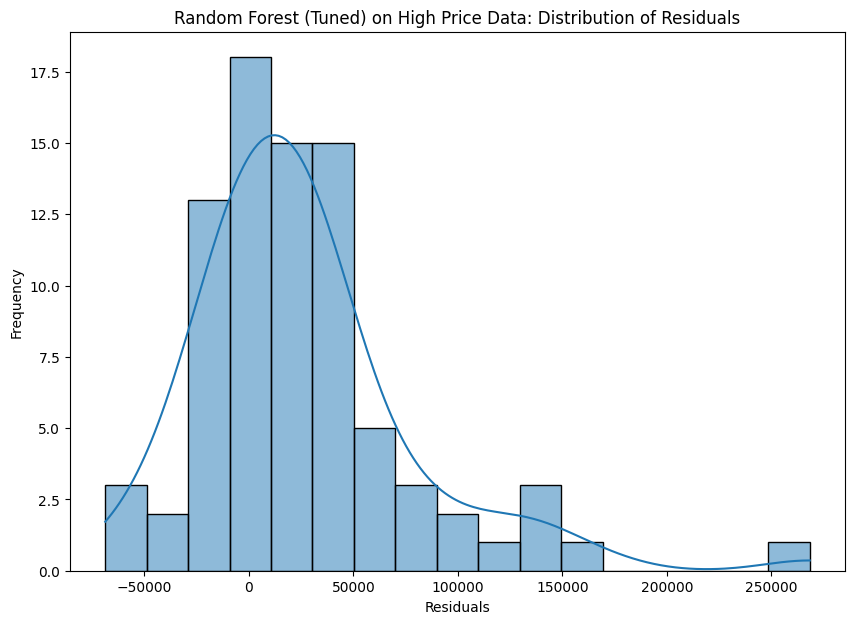

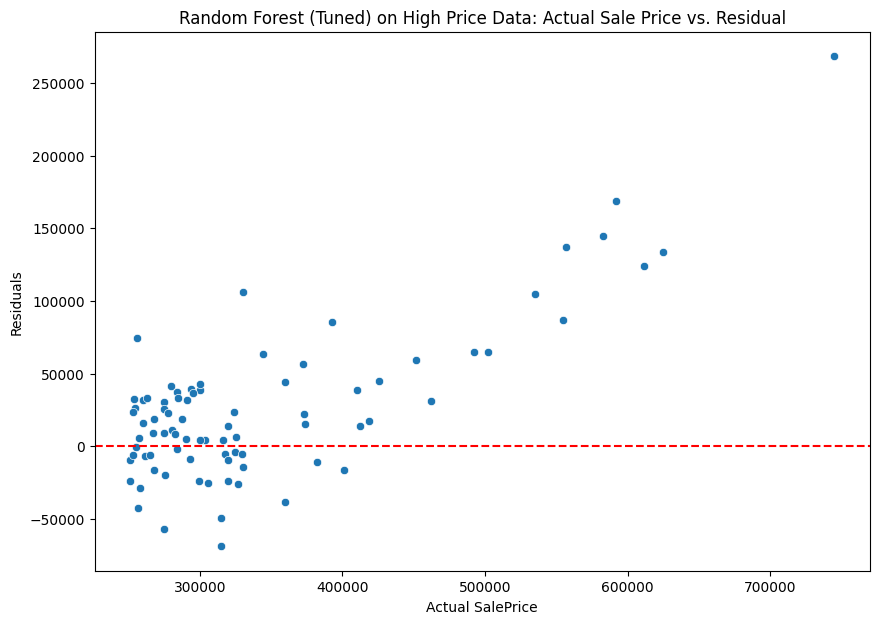


Random Forest (Tuned): Full Dataset


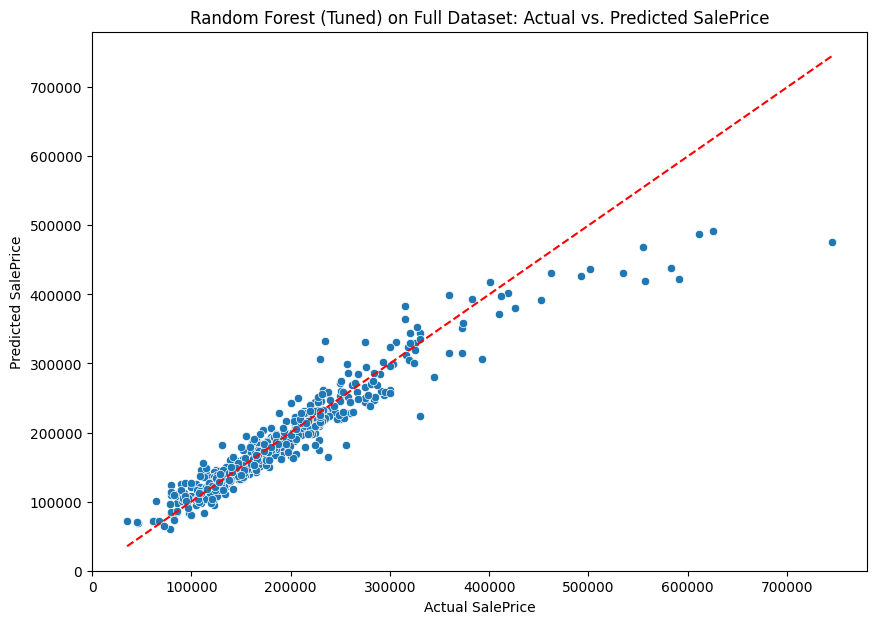

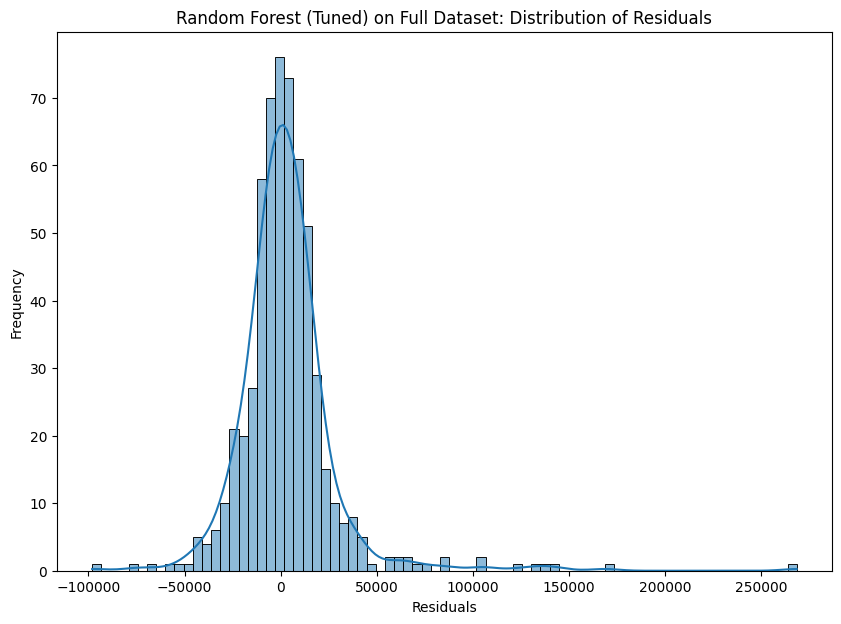

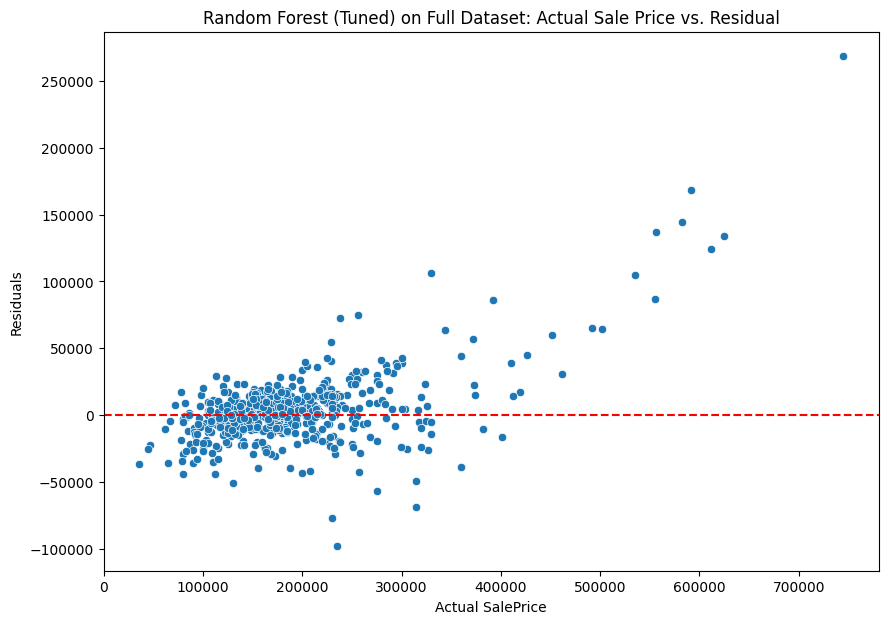


Random Forest (Tuned): Scores

Random Forest (Tuned): Low to Normal Sale Price
Mean Squared Error: 253322330.95
Root Mean Squared Error: 15916.10
R-squared: 0.86

Random Forest (Tuned): High Sale Price
Mean Squared Error: 3442424622.61
Root Mean Squared Error: 58672.18
R-squared: 0.68

Random Forest (Tuned): Full Dataset
Mean Squared Error: 703419384.16
Root Mean Squared Error: 26522.05
R-squared: 0.90


In [ ]:
# Re-fit the model with the best parameters
rfr_best = RandomForestRegressor(n_estimators=grid_search_rfr_all.best_params_['n_estimators'], min_samples_split=grid_search_rfr_all.best_params_['min_samples_split'], min_samples_leaf=grid_search_rfr_all.best_params_['min_samples_leaf'], max_depth=grid_search_rfr_all.best_params_['max_depth'], random_state=RS)
rfr_best.fit(X_train_preprocessed, y_train)
model_compare_predictions_values_all(rfr_best, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'Random Forest (Tuned)')

> From here, it seems that the RMSE is not high enough for high price data that we need to customize the model for it. I note that the RMSE will likely be always high since there are many high outlier prices that we don't have much data for.

> I will try log transforms to help deal with vast differences in the scale of sale price values. If this doesn't improve RMSE on high sale price data, I will stop explicitly trying to largely reduce RMSE for high sale price data for the reasons above

### Random Forest with log transforms


Random Forest (Log Transformed): Low to Normal Sale Price


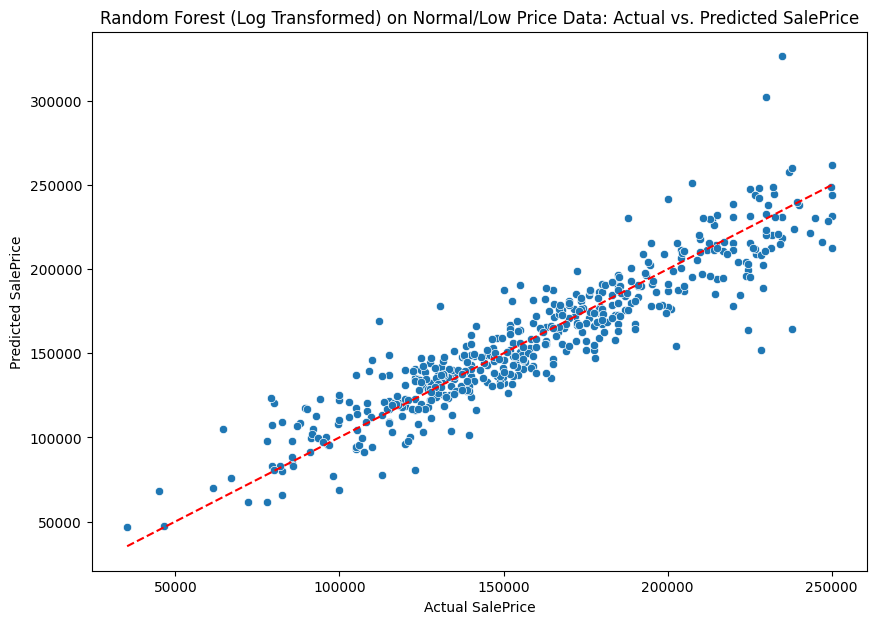

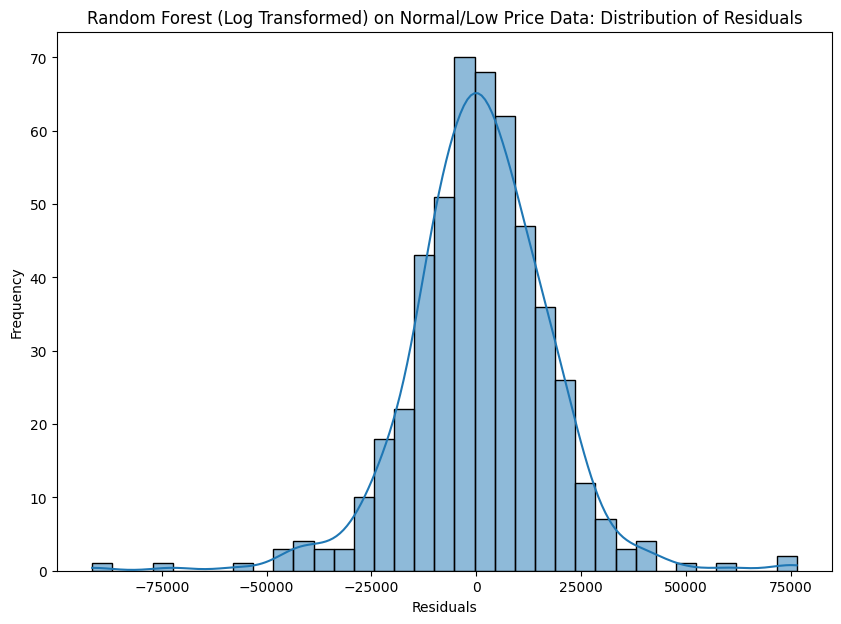

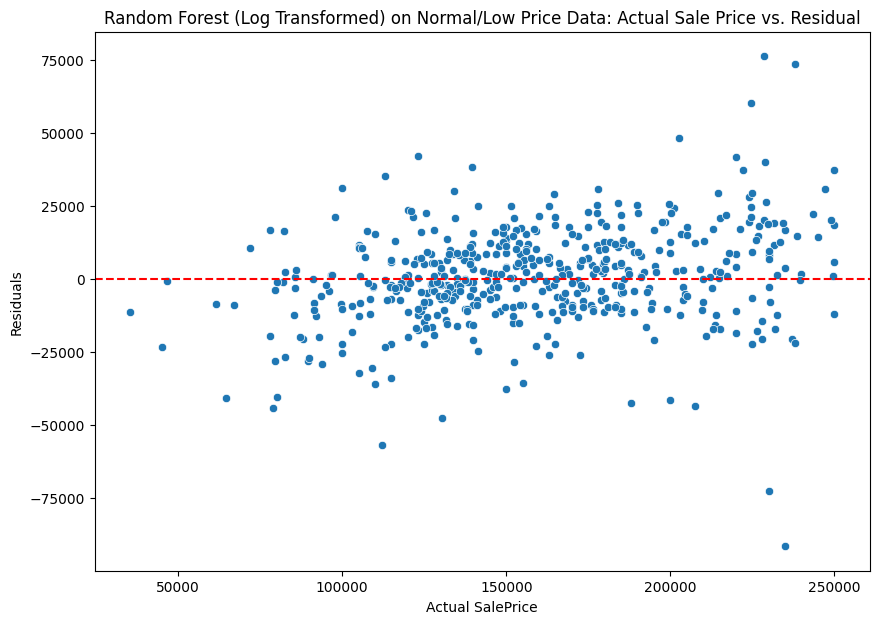


Random Forest (Log Transformed): High Sale Price


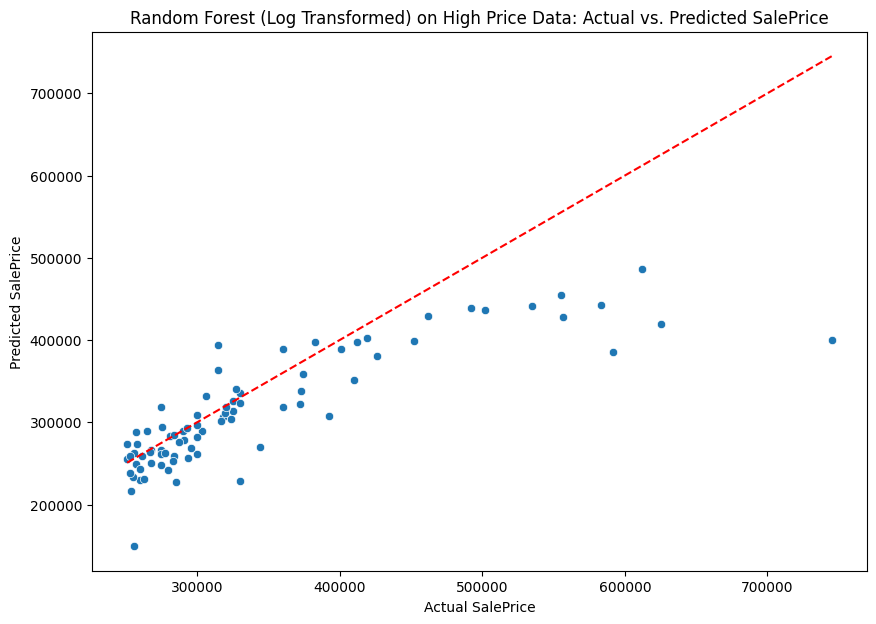

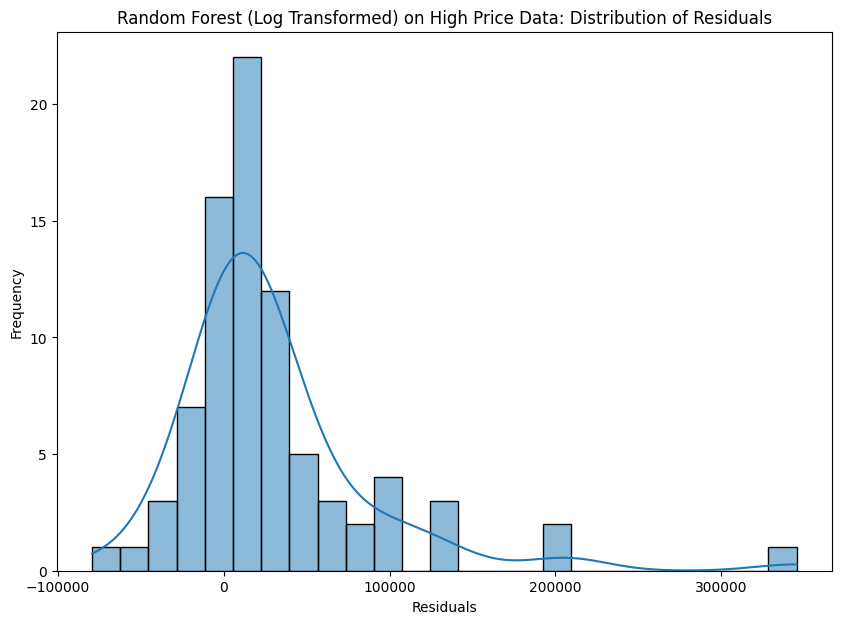

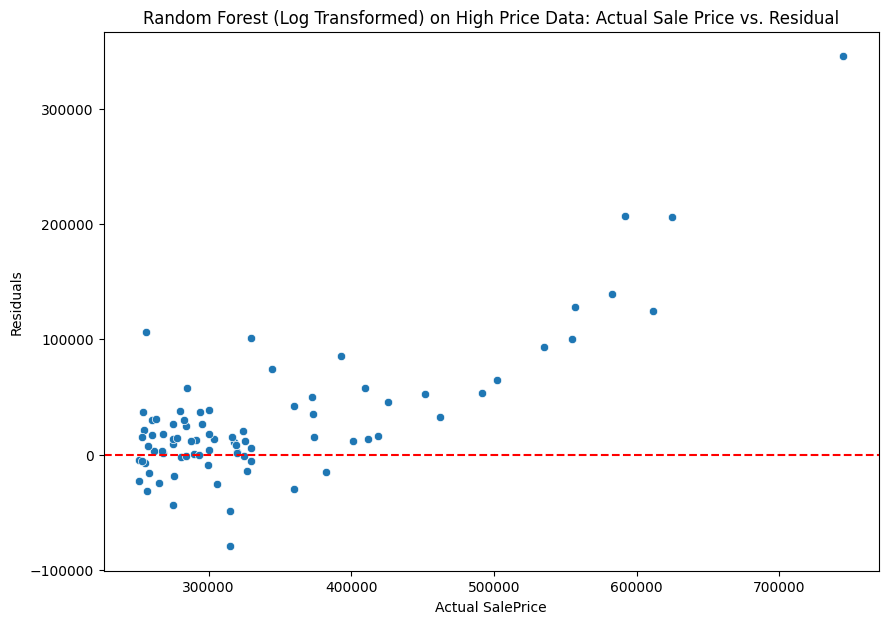


Random Forest (Log Transformed): Full Dataset


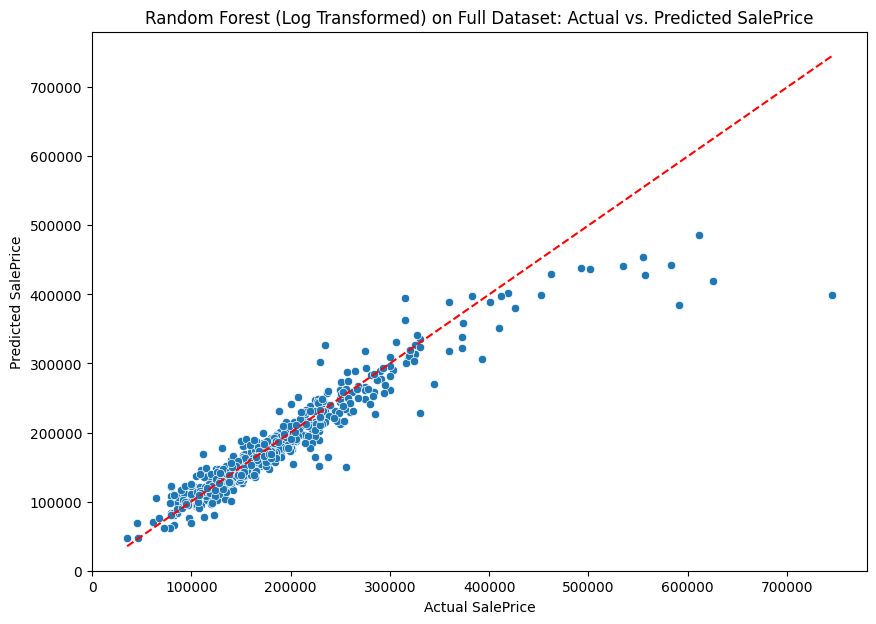

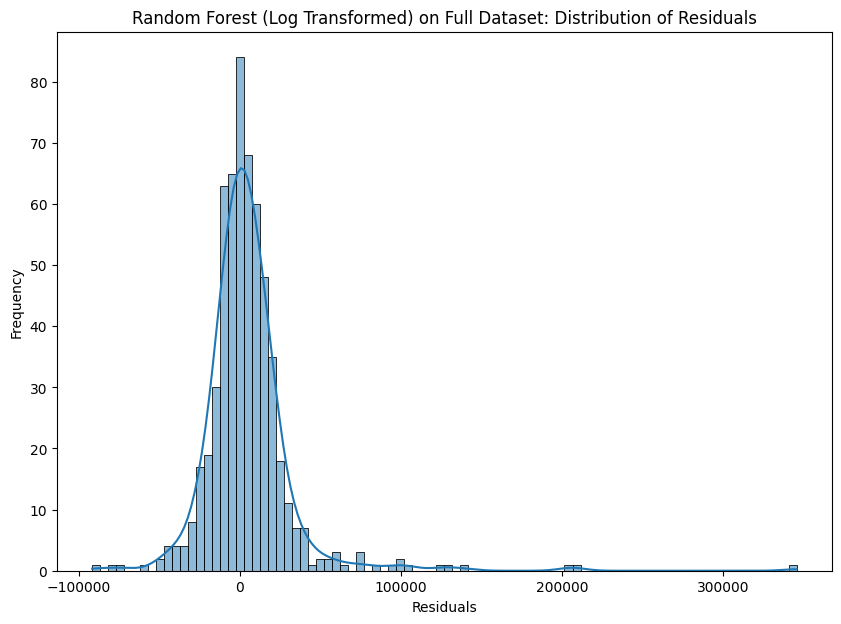

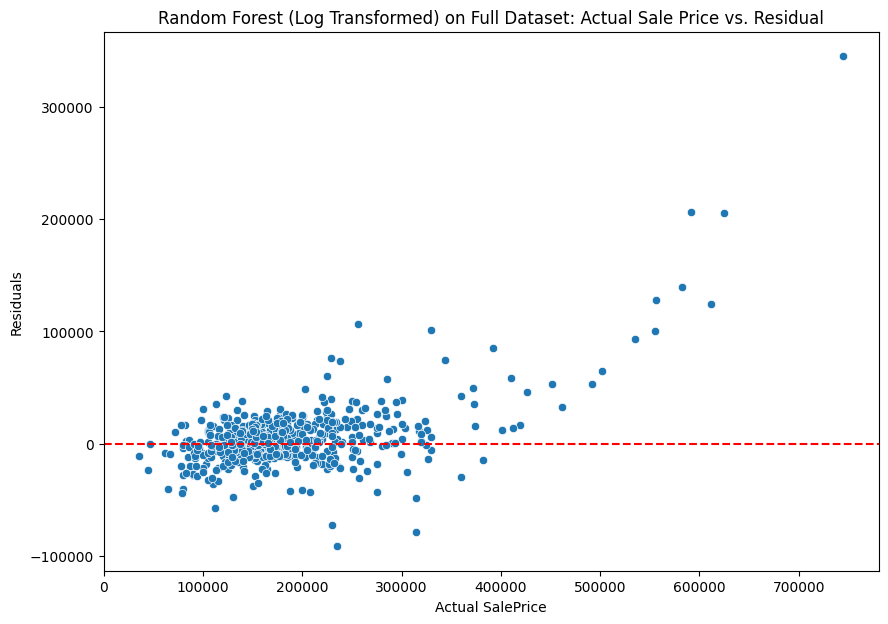


Random Forest (Log Transformed): Scores

Random Forest (Log Transformed): Low to Normal Sale Price
Mean Squared Error: 284007409.92
Root Mean Squared Error: 16852.52
R-squared: 0.85

Random Forest (Log Transformed): High Sale Price
Mean Squared Error: 4448137800.33
Root Mean Squared Error: 66694.36
R-squared: 0.59

Random Forest (Log Transformed): Full Dataset
Mean Squared Error: 871716002.03
Root Mean Squared Error: 29524.84
R-squared: 0.88


In [ ]:
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

rfr_log = RandomForestRegressor(random_state=RS) # Added random_state for reproducibility
rfr_log.fit(X_train_preprocessed, y_train_log)
log_undo_model_compare_predictions_values_all(rfr_log, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'Random Forest (Non-Tuned, Log Transformed)')

> Here, doing log transforms did not help either.

> Now, let's try hyperparameter tuning, and if that doesn't help, we'll try a model that is less sensitive to high outliers.

### Hyperparameter Tuning for Random Forest with Log Transforms

In [ ]:
# y_train_log and y_test_log are already defined
grid_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rfr_log_tuned = RandomForestRegressor(random_state=RS)

grid_search_rfr_log_tuned = GridSearchCV(rfr_log_tuned, grid_params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_rfr_log_tuned.fit(X_train_preprocessed, y_train_log)
grid_search_rfr_log_tuned.best_params_

{'max_depth': None,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 200}


Random Forest (Log Transformed): Low to Normal Sale Price


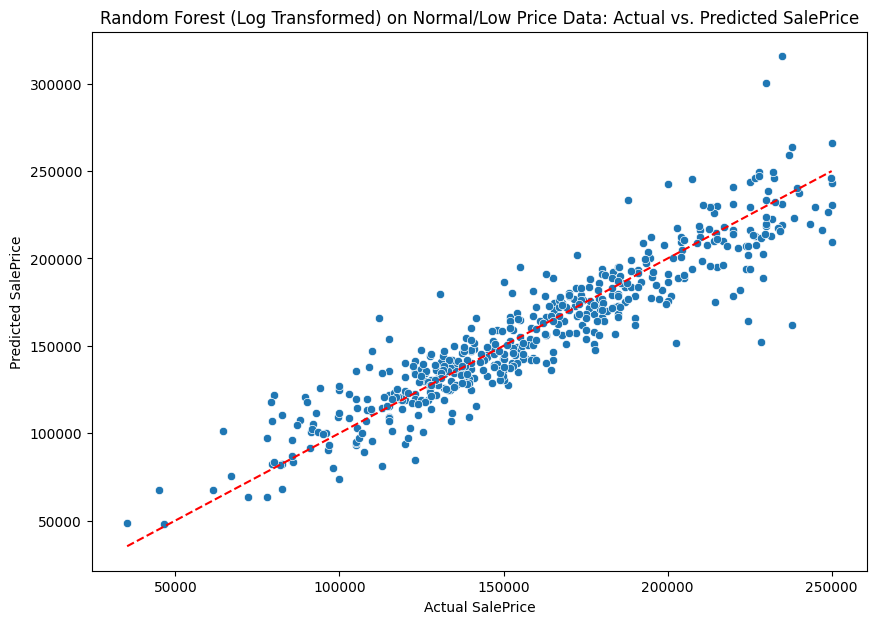

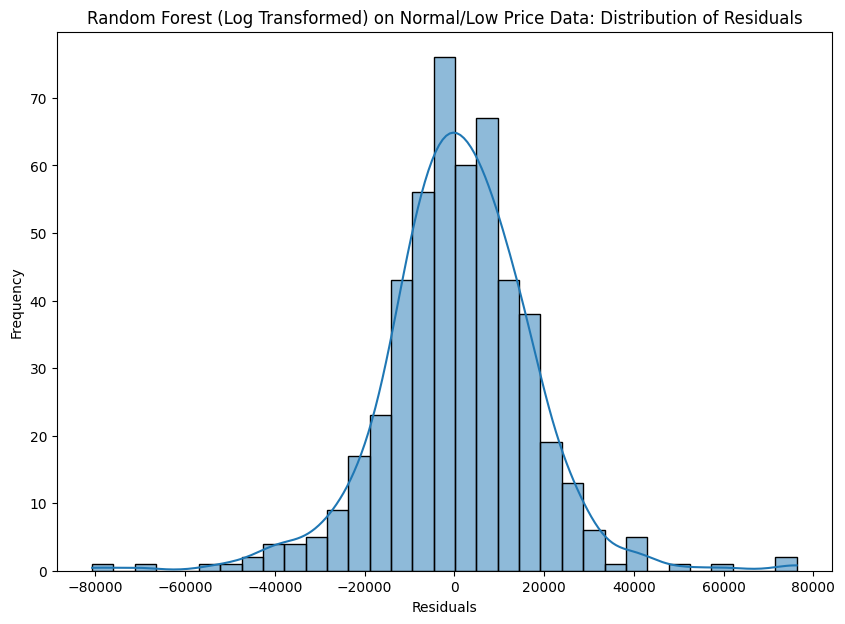

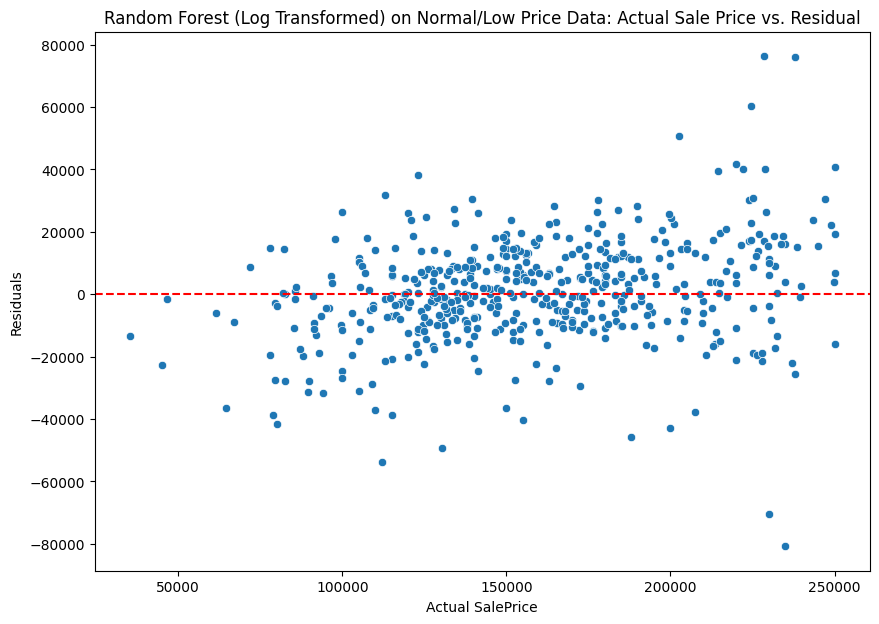


Random Forest (Log Transformed): High Sale Price


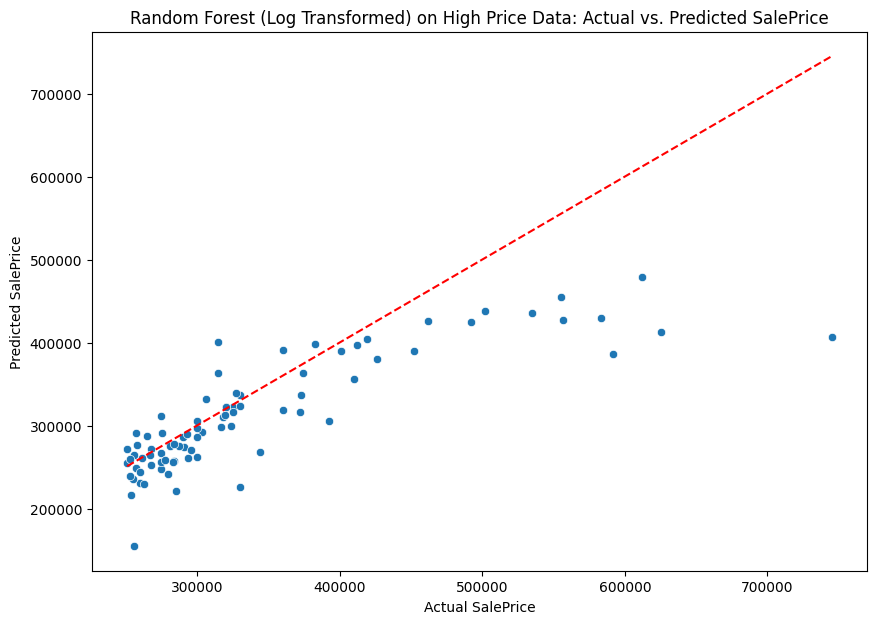

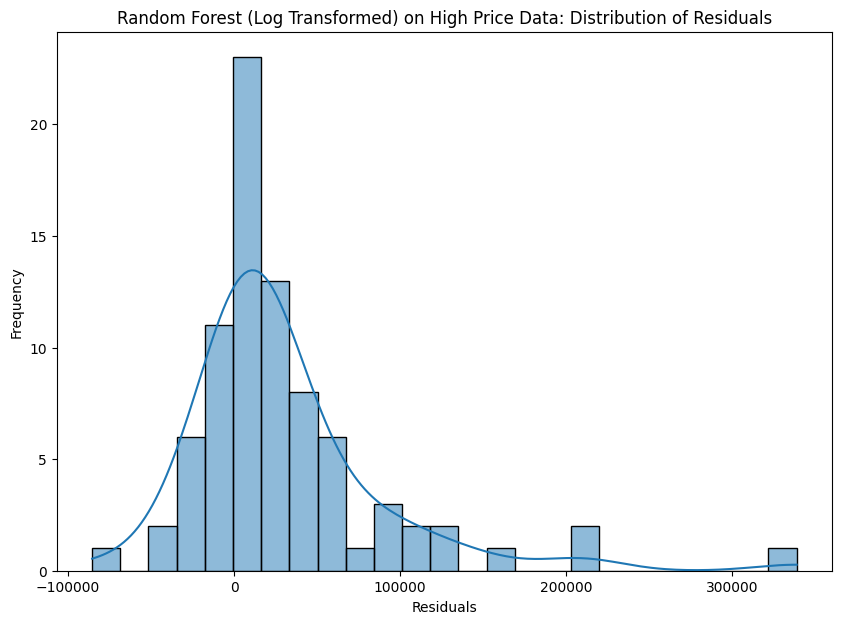

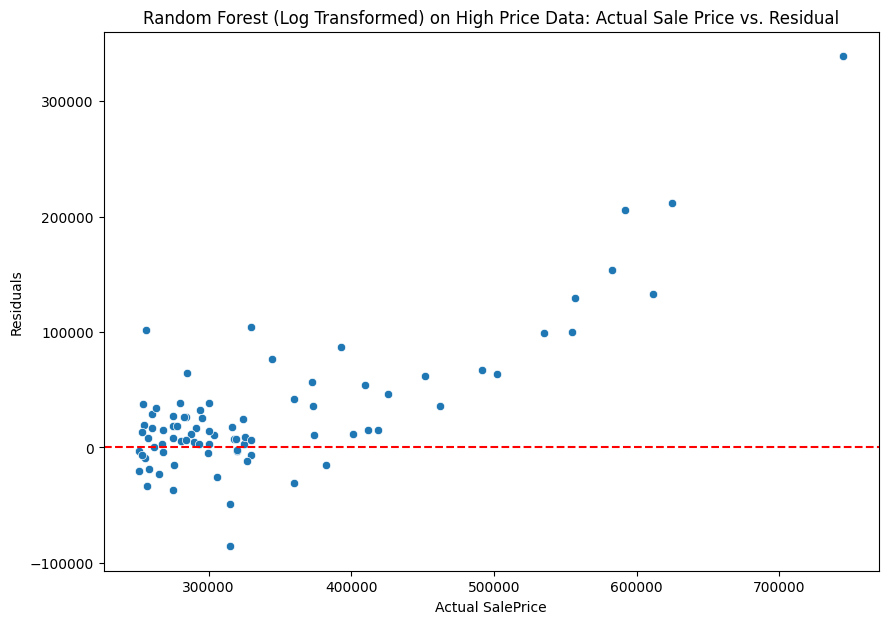


Random Forest (Log Transformed): Full Dataset


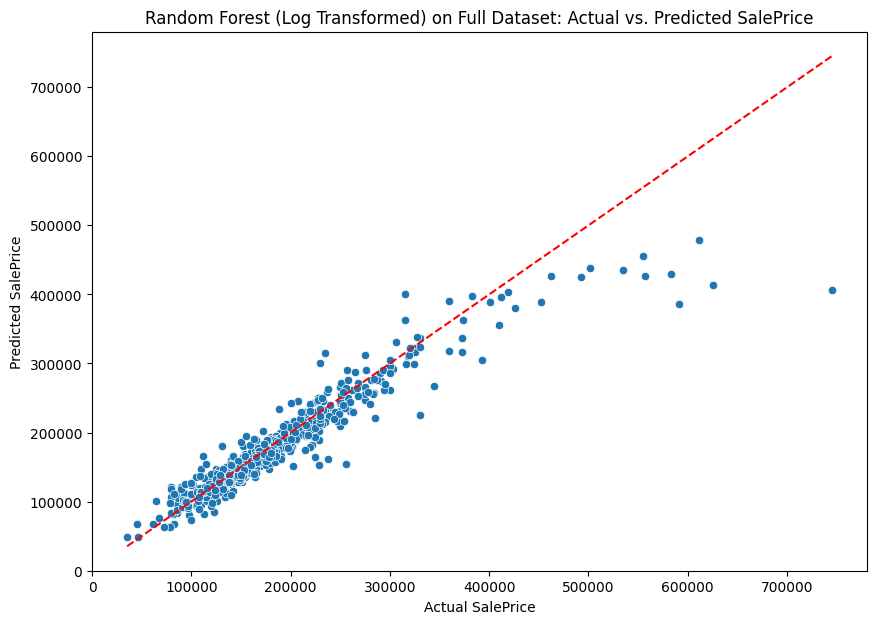

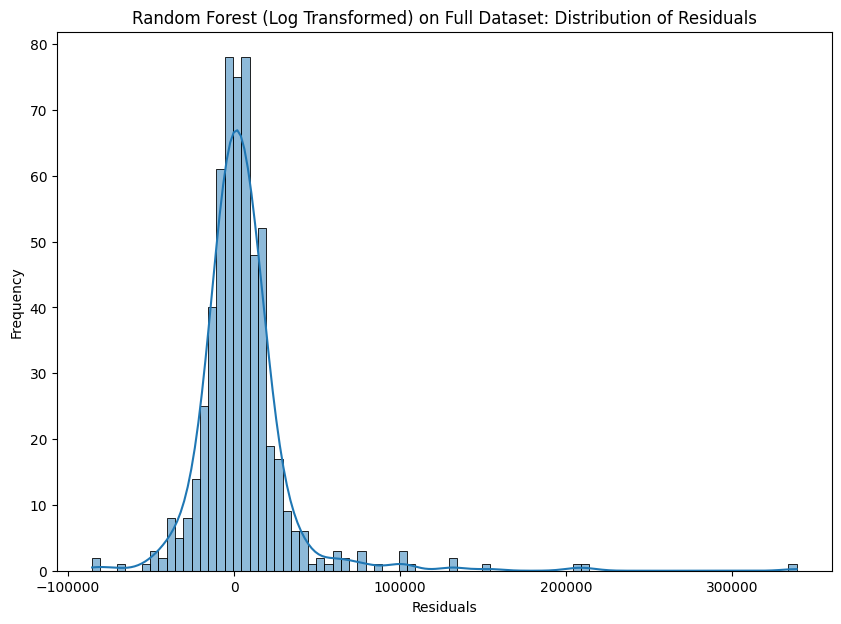

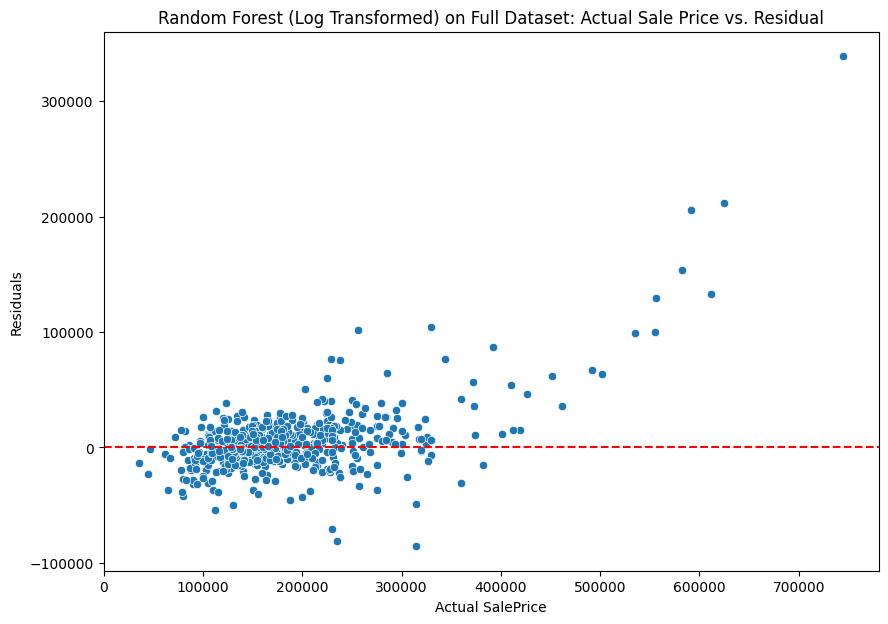


Random Forest (Log Transformed): Scores

Random Forest (Log Transformed): Low to Normal Sale Price
Mean Squared Error: 277246983.06
Root Mean Squared Error: 16650.74
R-squared: 0.85

Random Forest (Log Transformed): High Sale Price
Mean Squared Error: 4568983549.84
Root Mean Squared Error: 67594.26
R-squared: 0.58

Random Forest (Log Transformed): Full Dataset
Mean Squared Error: 882965396.96
Root Mean Squared Error: 29714.73
R-squared: 0.88


In [ ]:
rfr_log_tuned = RandomForestRegressor(n_estimators=grid_search_rfr_log_tuned.best_params_['n_estimators'], min_samples_split=grid_search_rfr_log_tuned.best_params_['min_samples_split'], min_samples_leaf=grid_search_rfr_log_tuned.best_params_['min_samples_leaf'], max_depth=grid_search_rfr_log_tuned.best_params_['max_depth'], random_state=RS)
rfr_log_tuned.fit(X_train_preprocessed, y_train_log)

log_undo_model_compare_predictions_values_all(rfr_log_tuned, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'Random Forest (Log Transformed)')

> Okay, log scaling indeed does not help much on predicting sale price for high sale price data. As such, I think I'll just have to accept the high RMSE on high sale price data

## XGBoost

In [ ]:
# Implement XGBoost on the original data
from xgboost import XGBRegressor

xgb = XGBRegressor(random_state=RS)
xgb.fit(X_train_preprocessed, y_train)
y_pred_xgb = xgb.predict(X_test_preprocessed)


XGBoost (Non-tuned): Low to Normal Sale Price


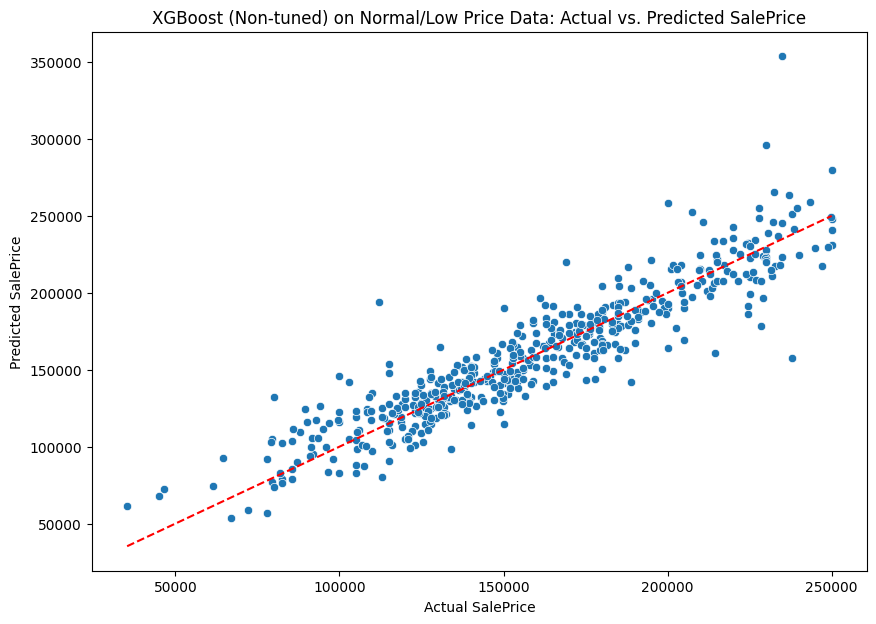

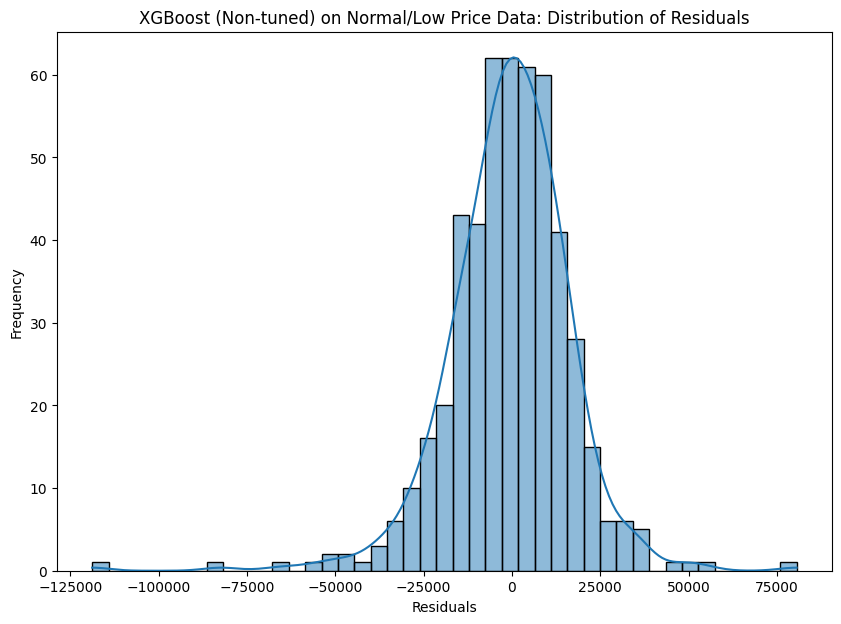

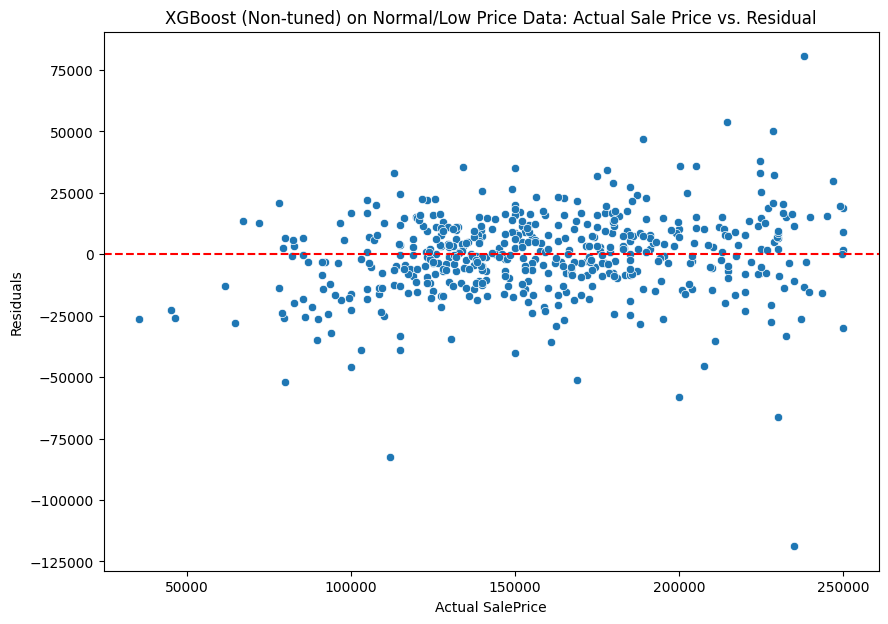


XGBoost (Non-tuned): High Sale Price


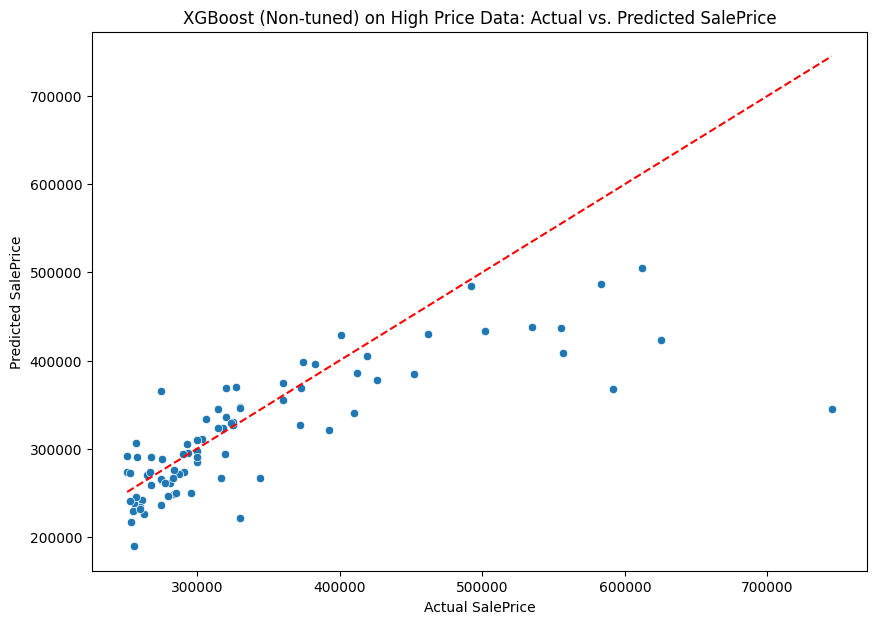

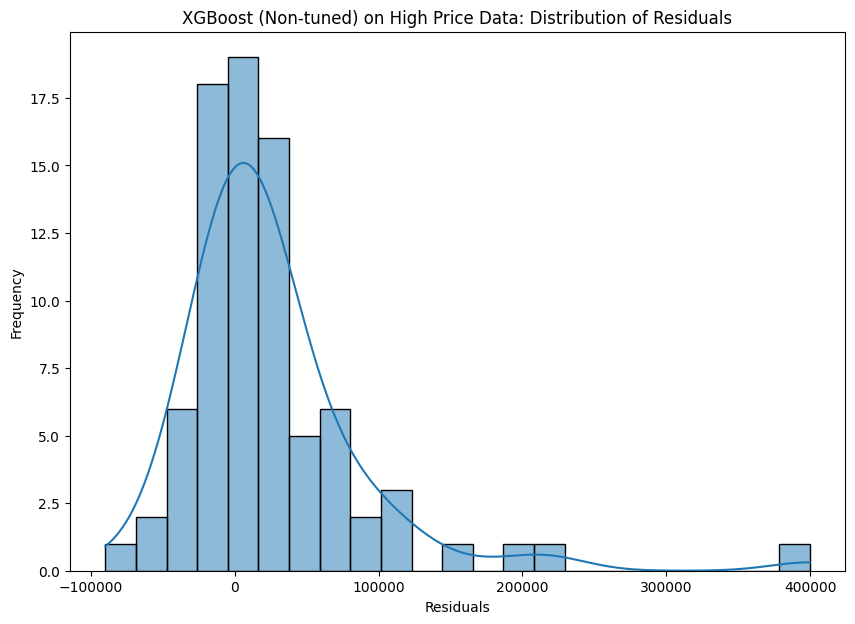

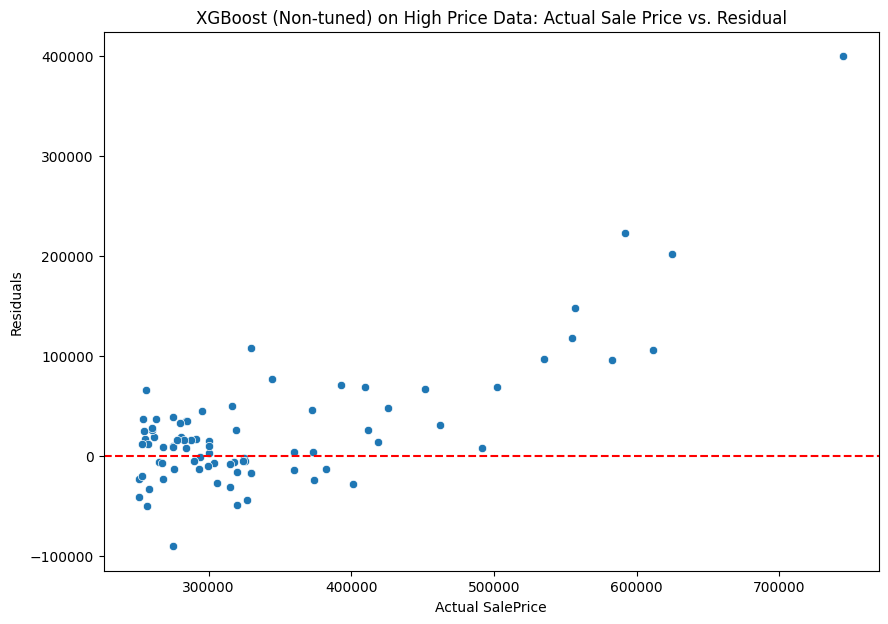


XGBoost (Non-tuned): Full Dataset


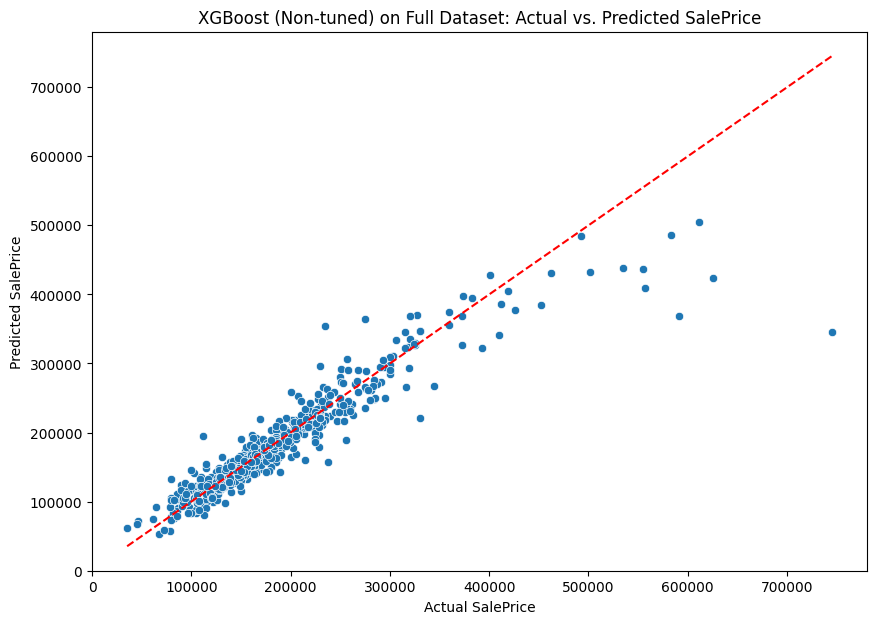

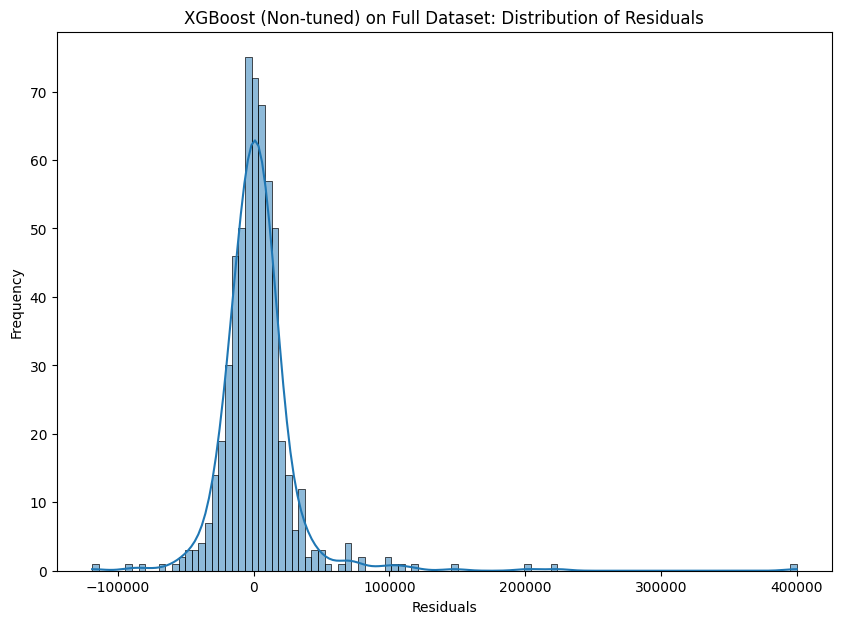

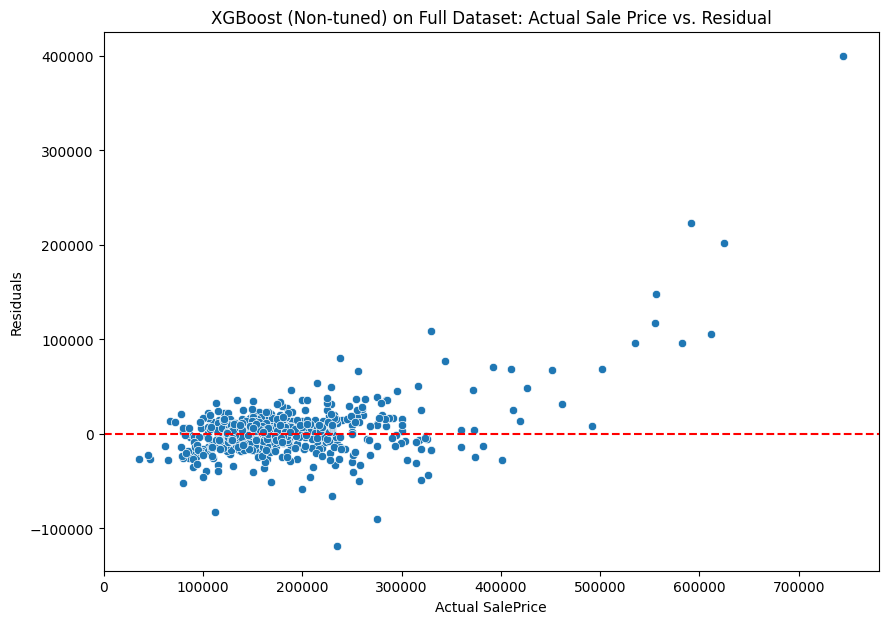


XGBoost (Non-tuned): Scores

XGBoost (Non-tuned): Low to Normal Sale Price
Mean Squared Error: 298911296.00
Root Mean Squared Error: 17289.05
R-squared: 0.84

XGBoost (Non-tuned): High Sale Price
Mean Squared Error: 4952424960.00
Root Mean Squared Error: 70373.47
R-squared: 0.54

XGBoost (Non-tuned): Full Dataset
Mean Squared Error: 955689408.00
Root Mean Squared Error: 30914.23
R-squared: 0.87


In [ ]:
model_compare_predictions_values_all(xgb, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'XGBoost (Non-tuned)')

> Now, let's try tuning XGBoost

In [ ]:
# Hyperparameter tuning for XGBoost
xgb = XGBRegressor(random_state=RS)
grid_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 3]
}

grid_search_xgboost = GridSearchCV(xgb, grid_params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_xgboost.fit(X_train_preprocessed, y_train)
grid_search_xgboost.best_params_

{'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 300}


XGBoost (Tuned): Low to Normal Sale Price


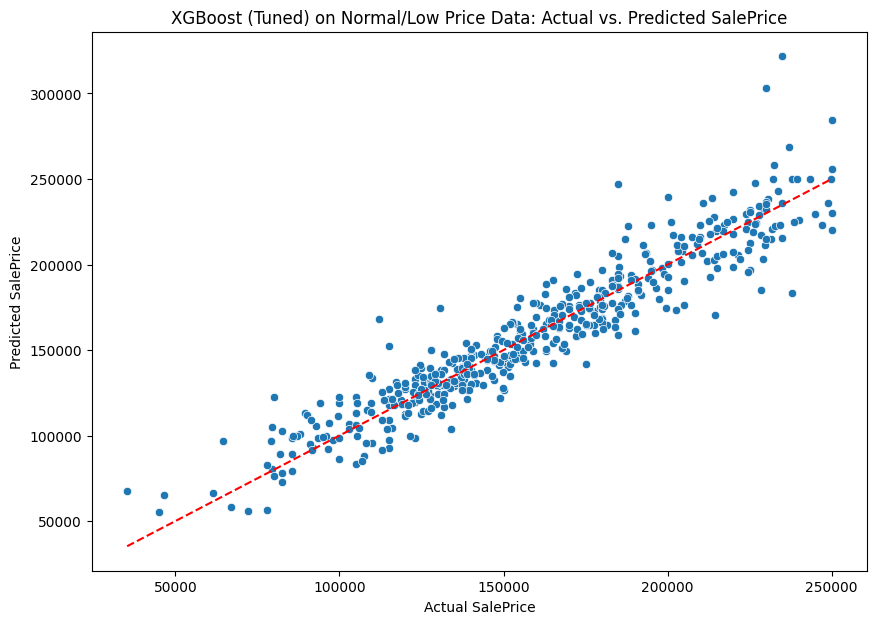

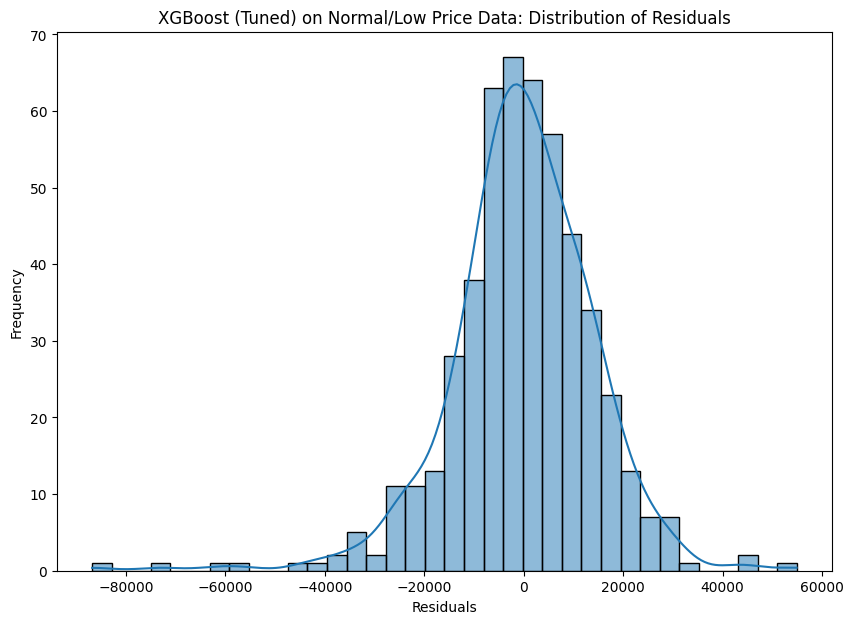

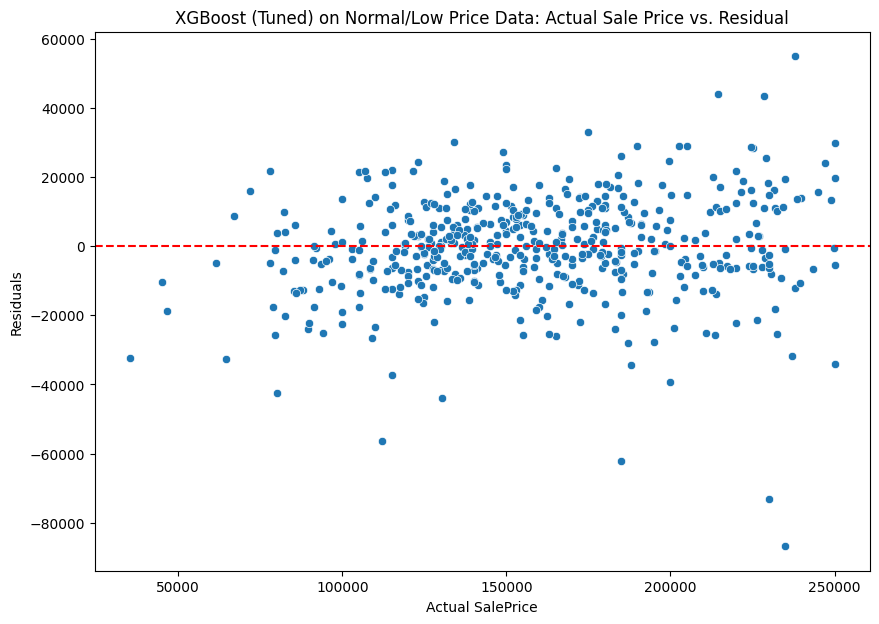


XGBoost (Tuned): High Sale Price


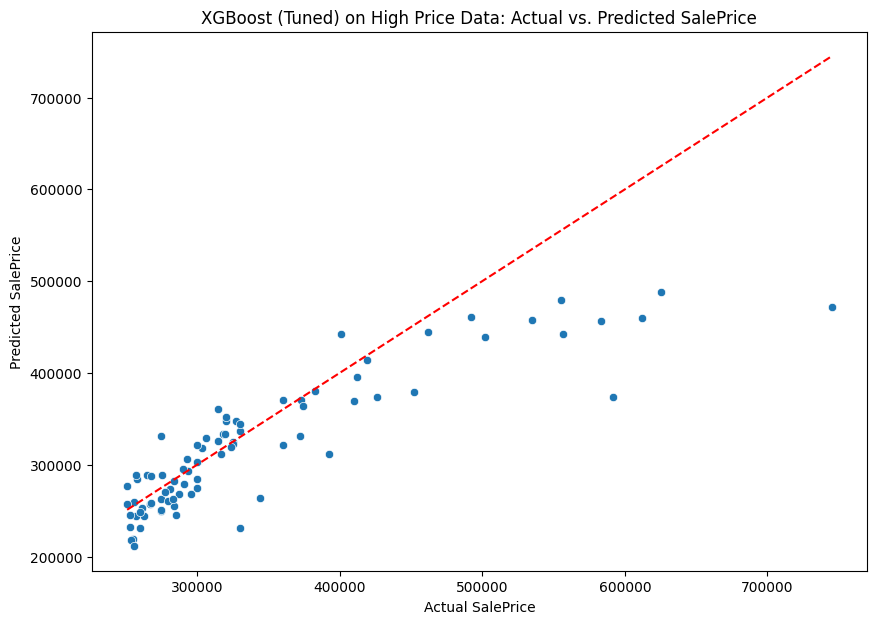

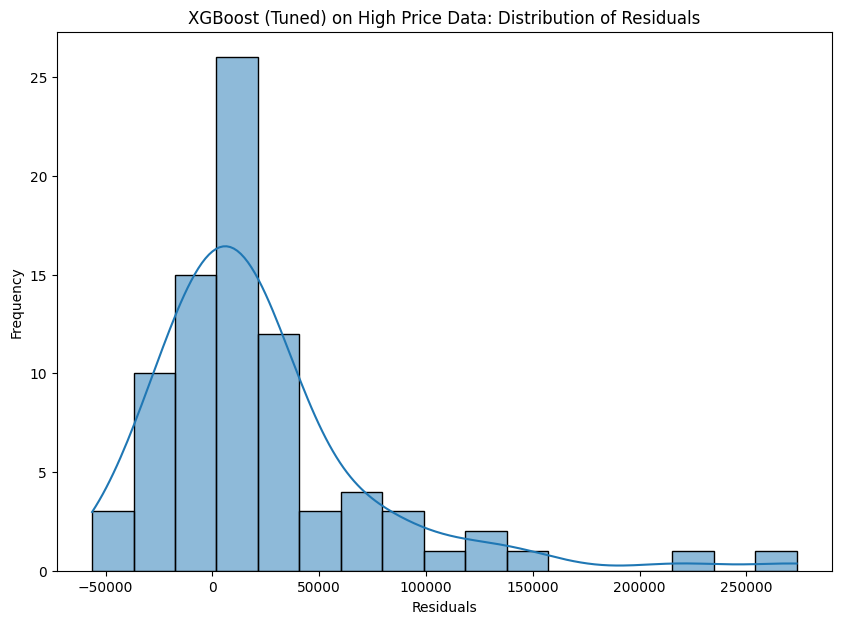

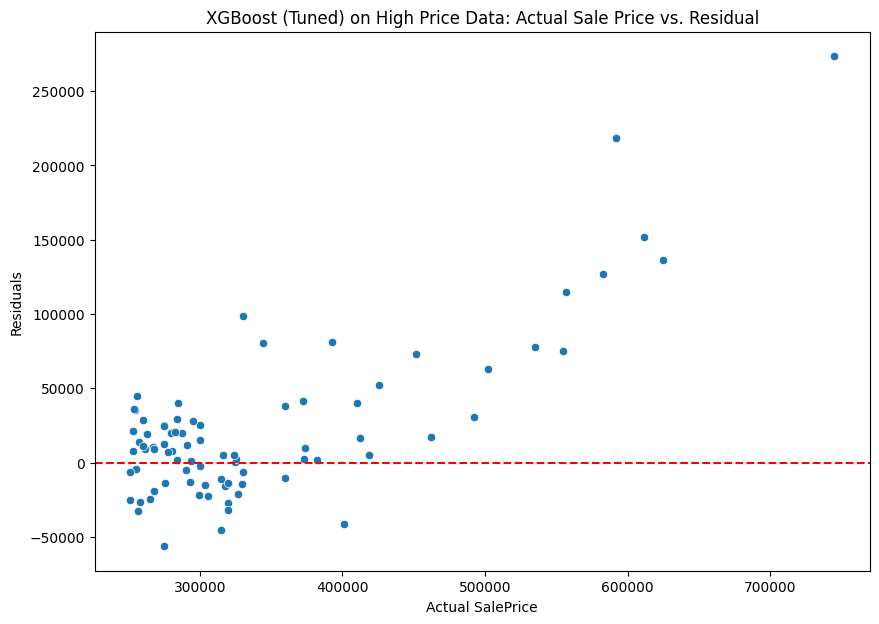


XGBoost (Tuned): Full Dataset


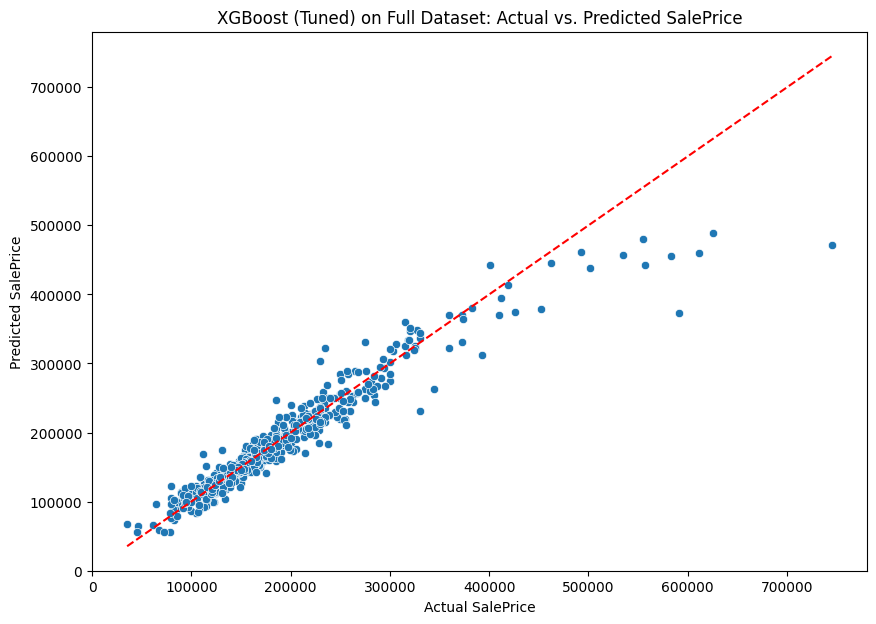

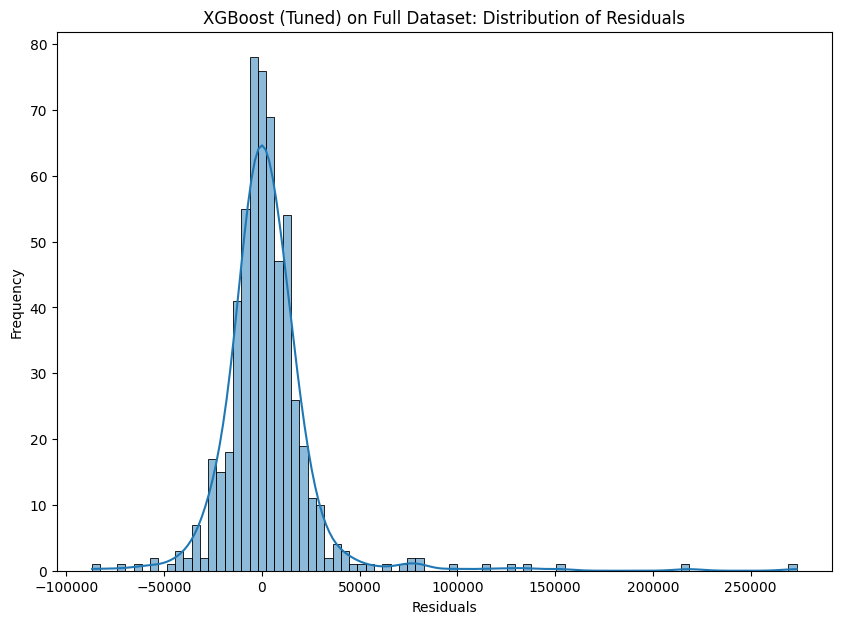

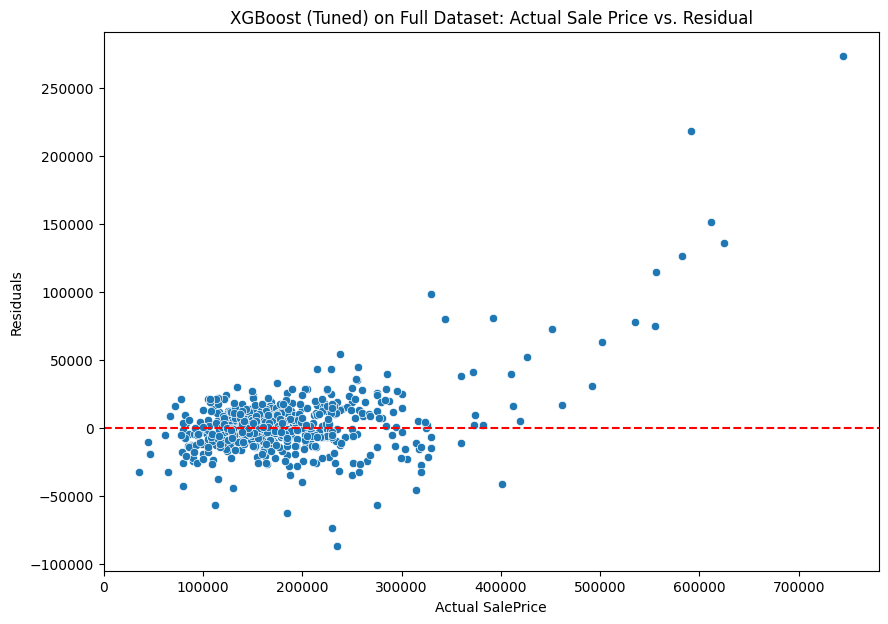


XGBoost (Tuned): Scores

XGBoost (Tuned): Low to Normal Sale Price
Mean Squared Error: 212248656.00
Root Mean Squared Error: 14568.76
R-squared: 0.89

XGBoost (Tuned): High Sale Price
Mean Squared Error: 3355362560.00
Root Mean Squared Error: 57925.49
R-squared: 0.69

XGBoost (Tuned): Full Dataset
Mean Squared Error: 655855104.00
Root Mean Squared Error: 25609.67
R-squared: 0.91


In [ ]:
xgboost_best = XGBRegressor(n_estimators=grid_search_xgboost.best_params_['n_estimators'], learning_rate=grid_search_xgboost.best_params_['learning_rate'], max_depth=grid_search_xgboost.best_params_['max_depth'], min_child_weight=grid_search_xgboost.best_params_['min_child_weight'], random_state=RS)
xgboost_best.fit(X_train_preprocessed, y_train)

model_compare_predictions_values_all(xgboost_best, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'XGBoost (Tuned)')

> It doesn't seem the model choice makes much of a difference for RMSE. Noting the continued high residual values for high sale prices and the many high outliers for sale price in our boxplots, I think that maybe the problem is that we don't have much data for high values of sale price.

In [ ]:
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

## XGBoost Hyperparameter Tuning with Log Transforms

In [ ]:
xgboost_log = XGBRegressor(random_state=RS)
grid_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 3]
}
# y_train_log and y_test_log are already defined
grid_search_xgboost_log = GridSearchCV(xgboost_log, grid_params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_xgboost_log.fit(X_train_preprocessed, y_train_log)

grid_search_xgboost_log.best_params_

{'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 300}


XGBoost (Log Transformed): Low to Normal Sale Price


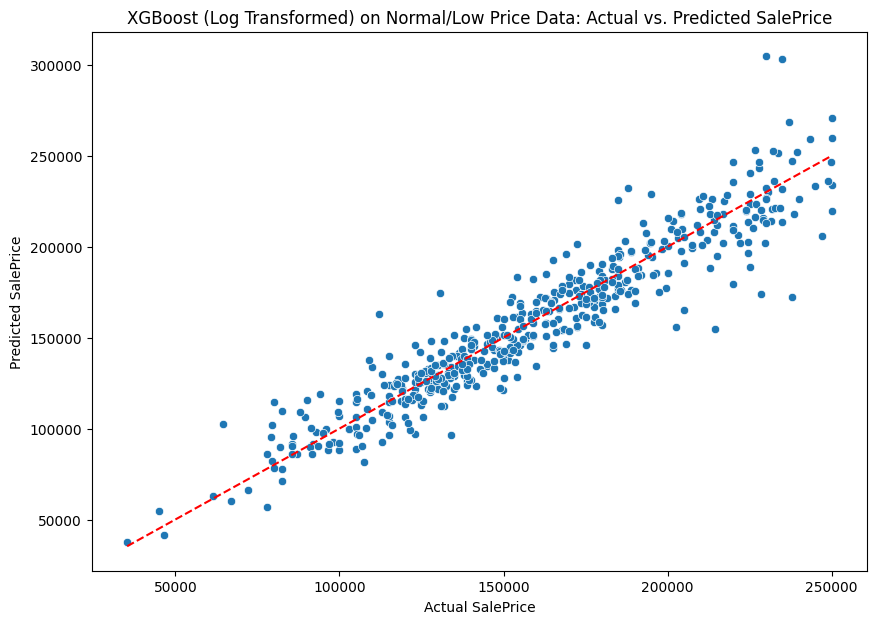

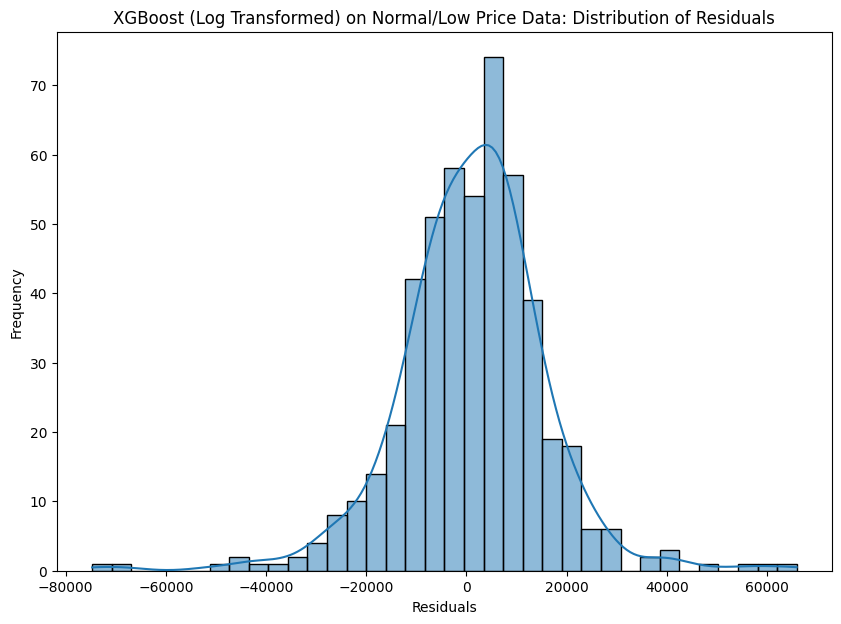

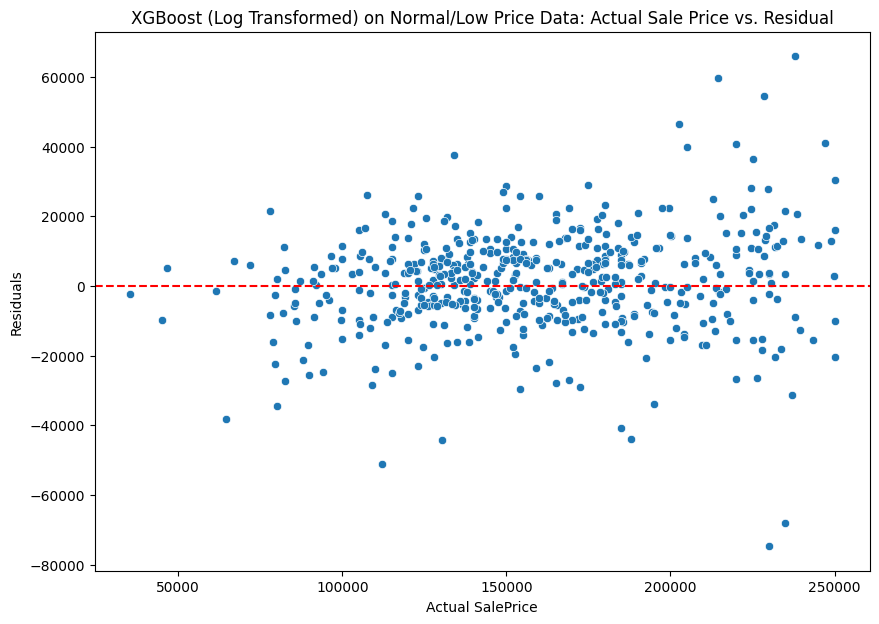


XGBoost (Log Transformed): High Sale Price


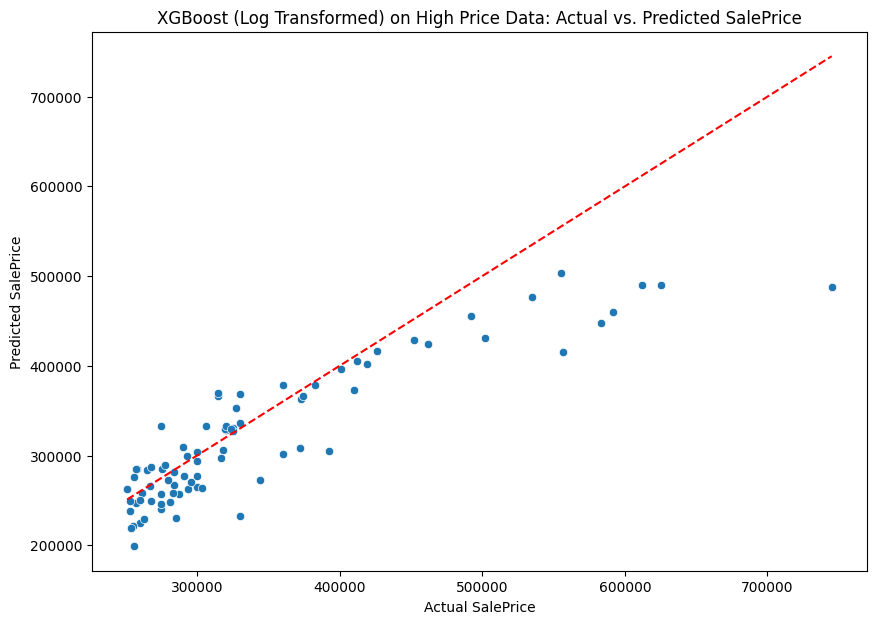

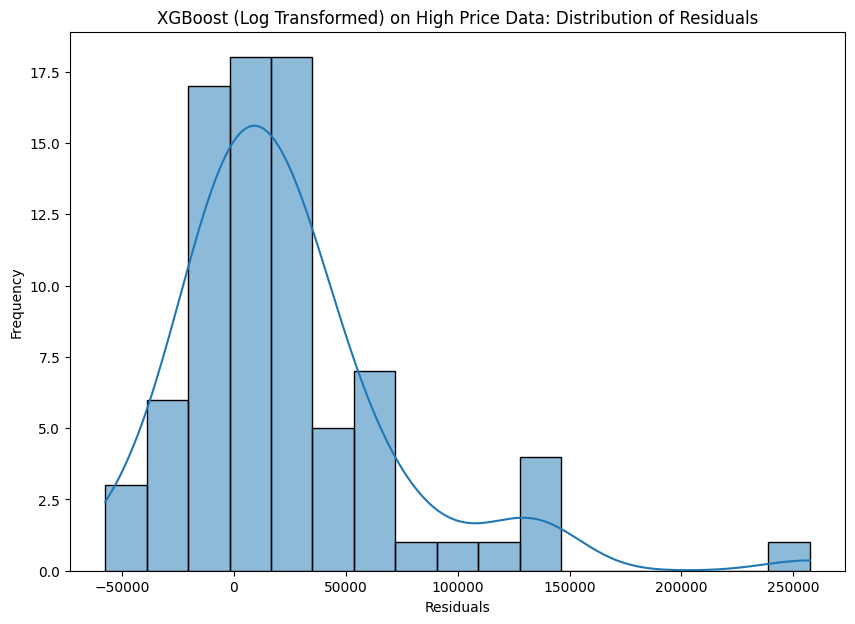

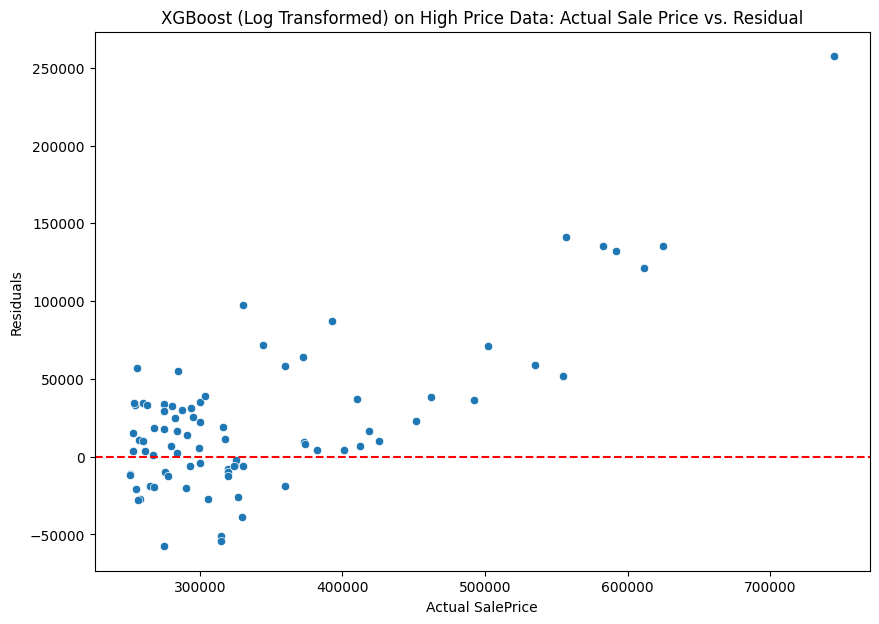


XGBoost (Log Transformed): Full Dataset


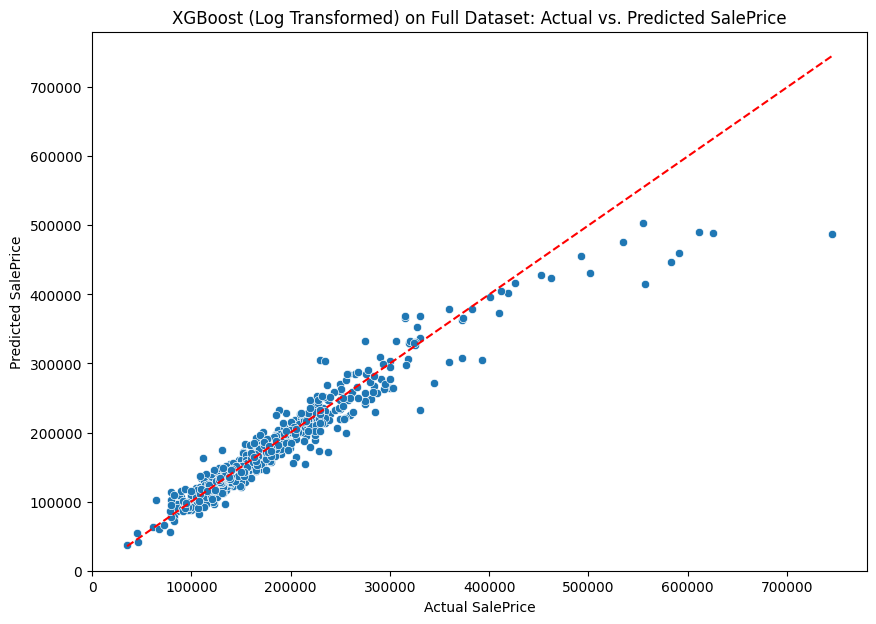

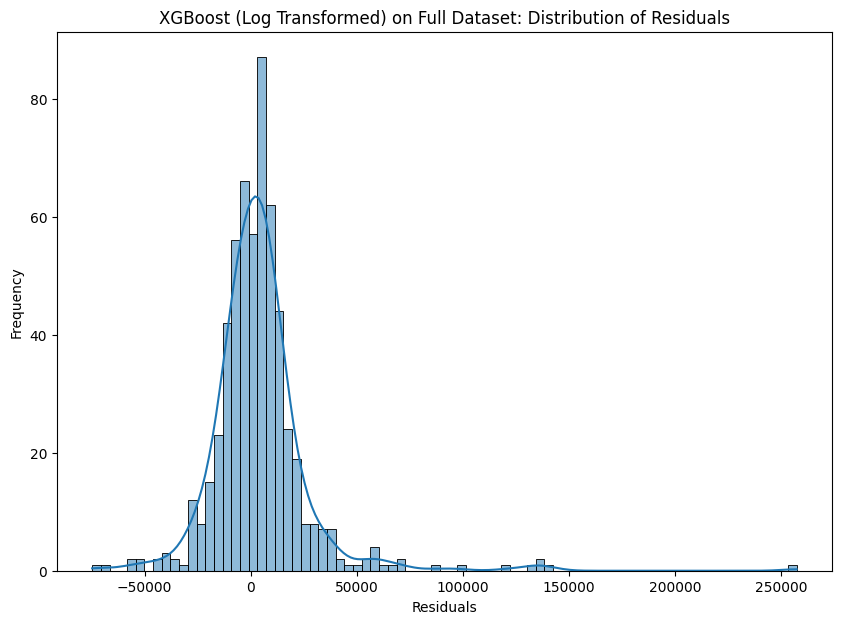

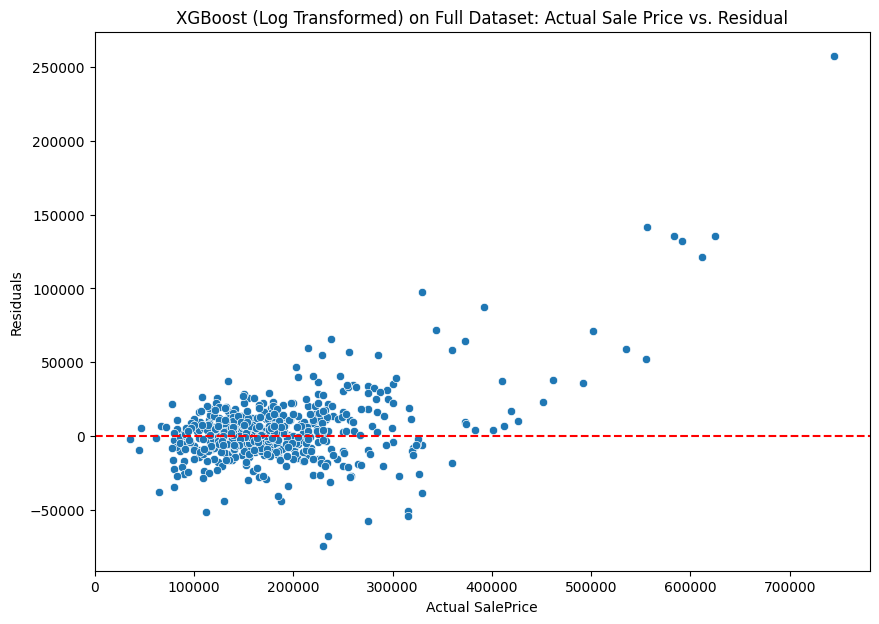


XGBoost (Log Transformed): Scores

XGBoost (Log Transformed): Low to Normal Sale Price
Mean Squared Error: 216025280.00
Root Mean Squared Error: 14697.80
R-squared: 0.88

XGBoost (Log Transformed): High Sale Price
Mean Squared Error: 2930023424.00
Root Mean Squared Error: 54129.69
R-squared: 0.73

XGBoost (Log Transformed): Full Dataset
Mean Squared Error: 599068160.00
Root Mean Squared Error: 24475.87
R-squared: 0.92


In [ ]:
xgboost_log = XGBRegressor(n_estimators=grid_search_xgboost_log.best_params_['n_estimators'], learning_rate=grid_search_xgboost_log.best_params_['learning_rate'], max_depth=grid_search_xgboost_log.best_params_['max_depth'], min_child_weight=grid_search_xgboost_log.best_params_['min_child_weight'], random_state=RS)
xgboost_log.fit(X_train_preprocessed, y_train_log)

log_undo_model_compare_predictions_values_all(xgboost_log, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'XGBoost (Log Transformed)')

## Reducing features and re-training models

In [ ]:
print(X_train_high_price_preprocessed.shape)
print(X_test_high_price_preprocessed.shape)

(359, 215)
(82, 215)


Here, I think that 215 features is excessive for 359 samples, so I will try to reduce the number of features for the data to see if it helps in predicting prices for high sale price data. I will see the feature importances to determine how many features I should use

### Extract Feature Importances for All-Data XGBoost and High-Price XGBoost


**Reasoning**:
To extract and display the feature importances, I will first get the feature importances from the trained `xgboost_high_price` model and the corresponding feature names from the `preprocessor`. Then, I will create a DataFrame to store this information, sort it by importance, and print the top 20 most important features.



In [ ]:
feature_importances = xgboost_best.feature_importances_
feature_names = preprocessor.get_feature_names_out()

# Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print("Top 20 Most Important Features for High Sale Price Prediction:")
print(feature_importance_df.head(20))

Top 20 Most Important Features for High Sale Price Prediction:
                     Feature  Importance
3          num__Overall Qual    0.209169
141  cat__Bsmt Qual_Gd or Ex    0.132853
25          num__Garage Cars    0.127206
168     cat__Kitchen Qual_Ex    0.070854
129       cat__Exter Qual_Ex    0.037849
23           num__Fireplaces    0.034266
15          num__Gr Liv Area    0.031694
42         cat__MS Zoning_RL    0.031631
171     cat__Kitchen Qual_TA    0.029990
196      cat__Garage Cond_TA    0.023203
165       cat__Central Air_N    0.017151
43         cat__MS Zoning_RM    0.014763
145    cat__Bsmt Exposure_Gd    0.014739
18            num__Full Bath    0.014093
12           num__1st Flr SF    0.011885
11        num__Total Bsmt SF    0.008979
5            num__Year Built    0.008027
180  cat__Garage Type_Attchd    0.007997
8          num__BsmtFin SF 1    0.007708
6        num__Year Remod/Add    0.006480


**Reasoning**:
Based on the extracted feature importances, I will now select the top original features (both numerical and categorical) to create new training and testing datasets for the high-price segment. This will involve filtering the original high-price feature sets (`X_train_high_price`, `X_test_high_price`) and then applying a new `ColumnTransformer` fitted only on these selected features.



In [ ]:
from sklearn.ensemble import RandomForestRegressor

### Select Features for All Data based on Importance Threshold

In [ ]:
importance_threshold = 0.01  # Adjust this value as needed

features_above_threshold = feature_importance_df[feature_importance_df['Importance'] >= importance_threshold]['Feature'].tolist()

reduced_numerical_features = []
reduced_categorical_features= set() # Use a set to store unique original categorical column names

# Identify original numerical and categorical features from the prefixed names
for feature_name_prefixed in features_above_threshold:
    if feature_name_prefixed.startswith('num__'):
        reduced_numerical_features.append(feature_name_prefixed.replace('num__', ''))
    elif feature_name_prefixed.startswith('cat__'):
        # Extract the original column name from the one-hot encoded feature name
        stripped_feature_name = feature_name_prefixed.replace('cat__', '')
        best_match = None
        for original_cat_col in categorical_features:
            if stripped_feature_name.startswith(original_cat_col):
                if len(stripped_feature_name) == len(original_cat_col) or stripped_feature_name[len(original_cat_col)] == '_':
                    if best_match is None or len(original_cat_col) > len(best_match):
                        best_match = original_cat_col
        if best_match:
            reduced_categorical_features.add(best_match)

reduced_categorical_features = list(reduced_categorical_features)

print(f"Number of features selected by threshold: {len(features_above_threshold)}")
print(f"Selected Numerical Features for High Price (Threshold): {reduced_numerical_features}")
print(f"Selected Categorical Features for High Price (Threshold): {reduced_categorical_features}")

# Create a new ColumnTransformer for the reduced high-price feature set
preprocessor_reduced = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), reduced_numerical_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), reduced_categorical_features)
    ])

Number of features selected by threshold: 15
Selected Numerical Features for High Price (Threshold): ['Overall Qual', 'Garage Cars', 'Fireplaces', 'Gr Liv Area', 'Full Bath', '1st Flr SF']
Selected Categorical Features for High Price (Threshold): ['Central Air', 'Garage Cond', 'Kitchen Qual', 'Exter Qual', 'Bsmt Qual', 'MS Zoning', 'Bsmt Exposure']


In [ ]:
# Fit the new preprocessor to X_train (which contains original column names)
preprocessor_reduced.fit(X_train)

# Transform normal/low price, high price, and all data features using the preprocessor
X_train_normal_low_price_reduced = preprocessor_reduced.transform(X_train_normal_low_price)
X_test_normal_low_price_reduced = preprocessor_reduced.transform(X_test_normal_low_price)
X_train_high_price_reduced = preprocessor_reduced.transform(X_train_high_price)
X_test_high_price_reduced = preprocessor_reduced.transform(X_test_high_price)
X_train_reduced = preprocessor_reduced.transform(X_train)
X_test_reduced = preprocessor_reduced.transform(X_test)

print(f"Shape of X_train_normal_low_price_reduced: {X_train_normal_low_price_reduced.shape}")
print(f"Shape of X_test_normal_low_price_reduced: {X_test_normal_low_price_reduced.shape}")
print(f"Shape of X_train_high_price_reduced: {X_train_high_price_reduced.shape}")
print(f"Shape of X_test_high_price_reduced: {X_test_high_price_reduced.shape}")
print(f"Shape of X_train_reduced: {X_train_reduced.shape}")
print(f"Shape of X_test_reduced: {X_test_reduced.shape}")

Shape of X_train_normal_low_price_reduced: (1965, 34)
Shape of X_test_normal_low_price_reduced: (499, 34)
Shape of X_train_high_price_reduced: (359, 34)
Shape of X_test_high_price_reduced: (82, 34)
Shape of X_train_reduced: (2324, 34)
Shape of X_test_reduced: (581, 34)


### Re-train Random Forest on Reduced Feature Data

In [ ]:
rfr_reduced = RandomForestRegressor(random_state=RS)

grid_params_reduced = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_reduced = GridSearchCV(rfr_reduced, grid_params_reduced, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_reduced.fit(X_train_reduced, y_train)

best_params_rfr_reduced = grid_search_reduced.best_params_
print(f"Best hyperparameters for Random Forest on reduced data: {best_params_rfr_reduced}")

Best hyperparameters for Random Forest on reduced data: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}



Random Forest (Reduced, Tuned, All Data): Low to Normal Sale Price


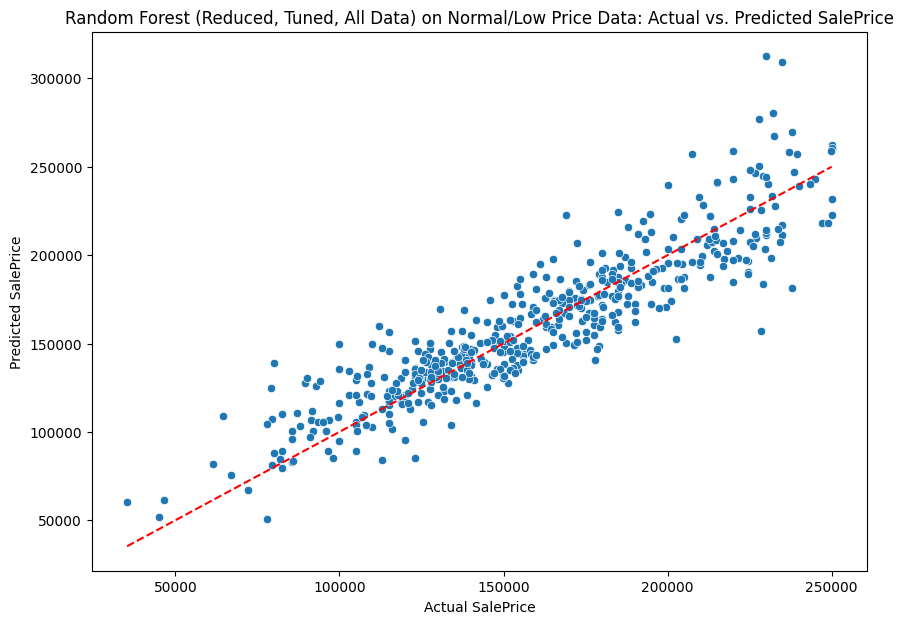

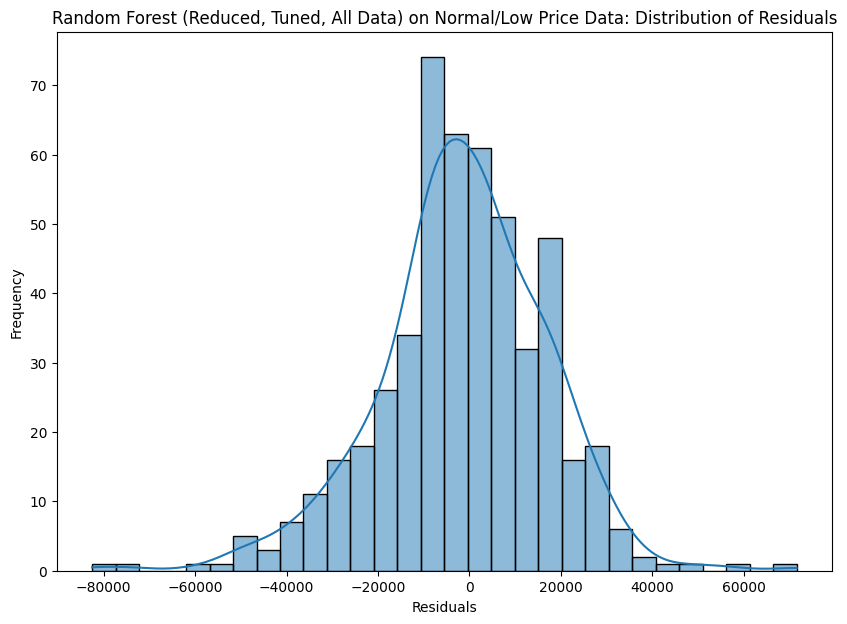

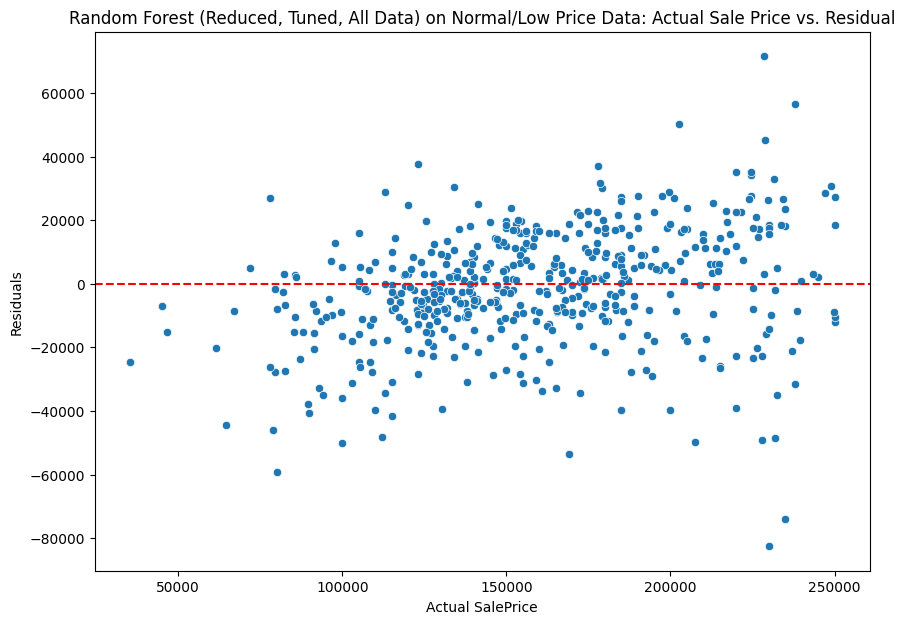


Random Forest (Reduced, Tuned, All Data): High Sale Price


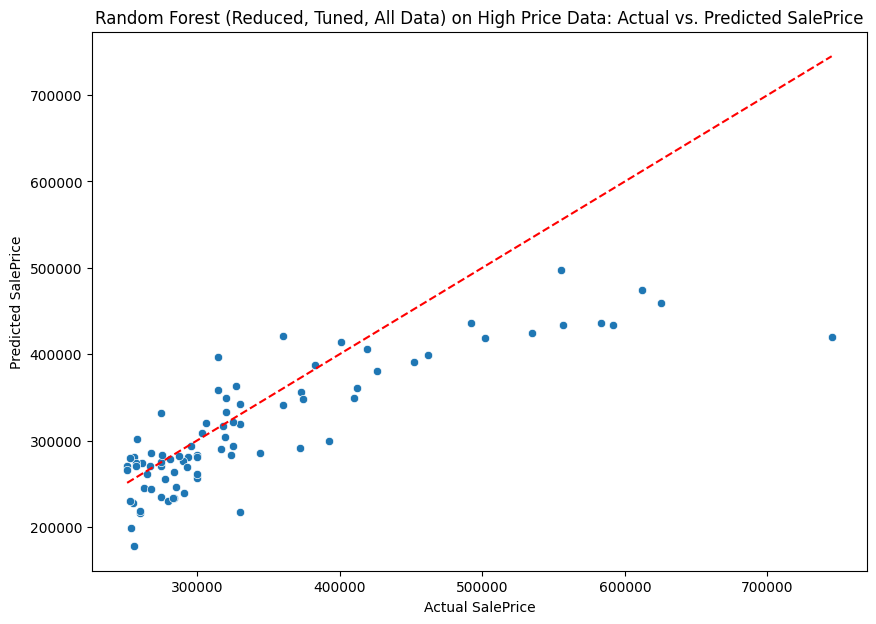

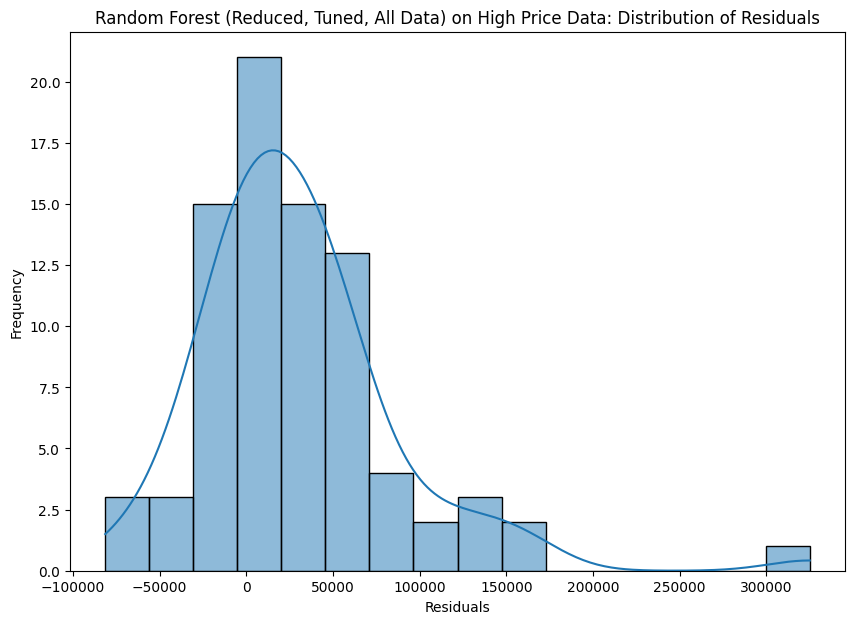

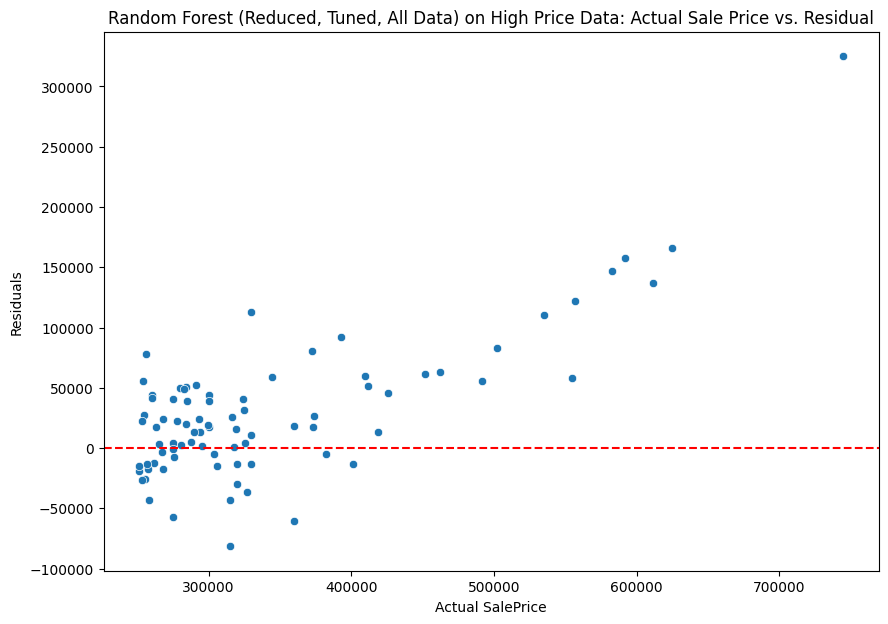


Random Forest (Reduced, Tuned, All Data): Full Dataset


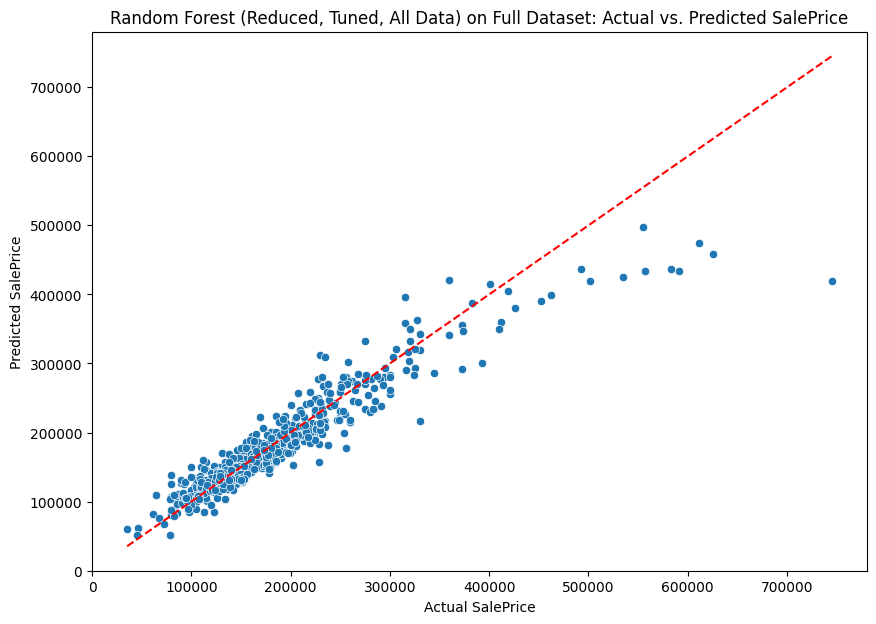

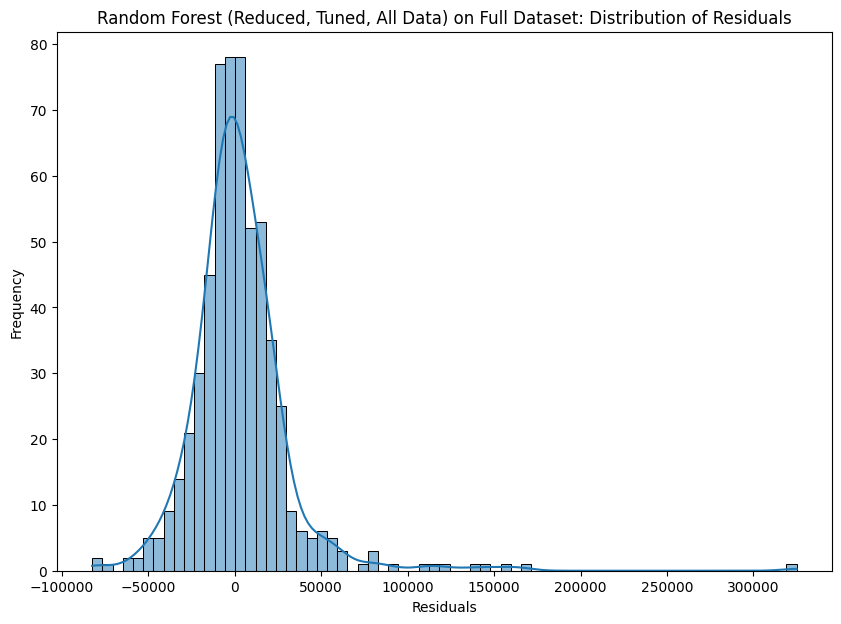

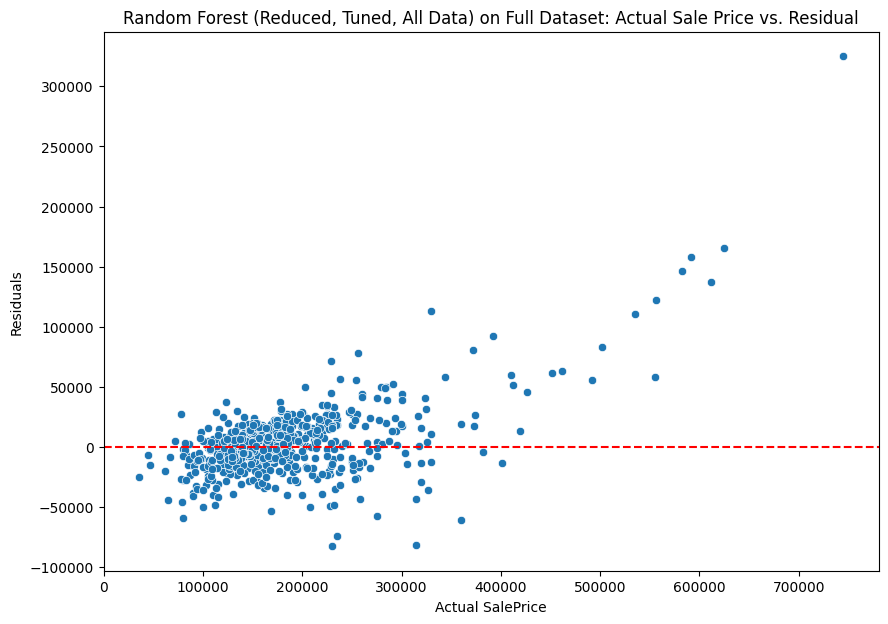


Random Forest (Reduced, Tuned, All Data): Scores

Random Forest (Reduced, Tuned, All Data): Low to Normal Sale Price
Mean Squared Error: 340129676.27
Root Mean Squared Error: 18442.60
R-squared: 0.82

Random Forest (Reduced, Tuned, All Data): High Sale Price
Mean Squared Error: 4254883189.59
Root Mean Squared Error: 65229.47
R-squared: 0.61

Random Forest (Reduced, Tuned, All Data): Full Dataset
Mean Squared Error: 892642220.32
Root Mean Squared Error: 29877.12
R-squared: 0.88


In [ ]:
rfr_reduced_tuned = RandomForestRegressor(
    n_estimators=best_params_rfr_reduced['n_estimators'],
    min_samples_split=best_params_rfr_reduced['min_samples_split'],
    min_samples_leaf=best_params_rfr_reduced['min_samples_leaf'],
    max_depth=best_params_rfr_reduced['max_depth'],
    random_state=RS
)

rfr_reduced_tuned.fit(X_train_reduced, y_train)

model_compare_predictions_values_all(rfr_reduced_tuned, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, model_name = 'Random Forest (Reduced, Tuned, All Data)')

### Re-train Random Forest on Reduced Feature Data with Log-Transformed Target

In [ ]:
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

rfr_reduced_log = RandomForestRegressor(random_state=RS)
grid_params_reduced_log = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_reduced_log = GridSearchCV(rfr_reduced_log, grid_params_reduced_log, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_reduced_log.fit(X_train_reduced, y_train_log)

best_params_rfr_reduced_log = grid_search_reduced_log.best_params_
print(f"Best hyperparameters for Random Forest on reduced data with log transform: {best_params_rfr_reduced_log}")

Best hyperparameters for Random Forest on reduced data with log transform: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}



Random Forest (Reduced, Tuned, Log Transformed): Low to Normal Sale Price


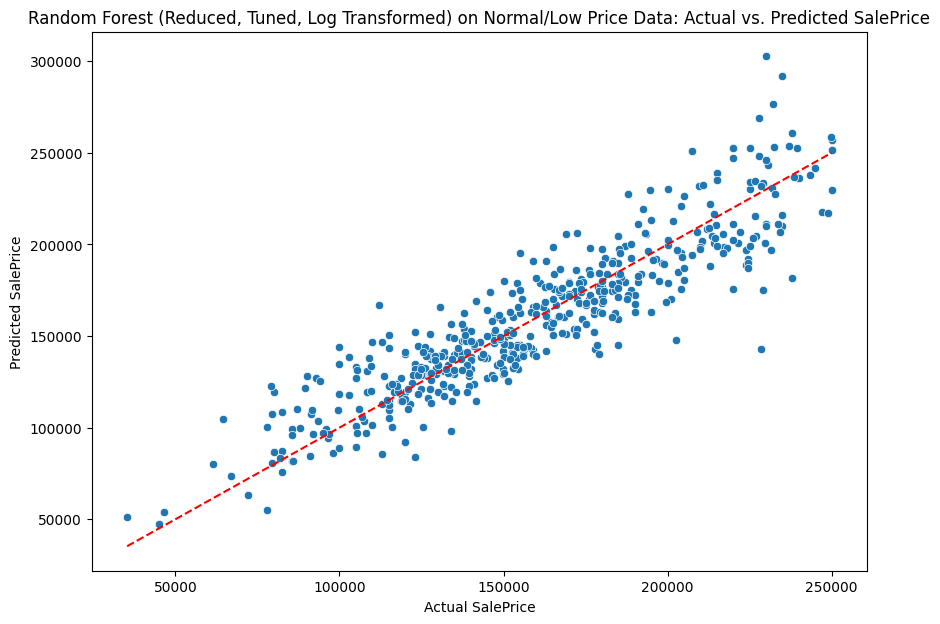

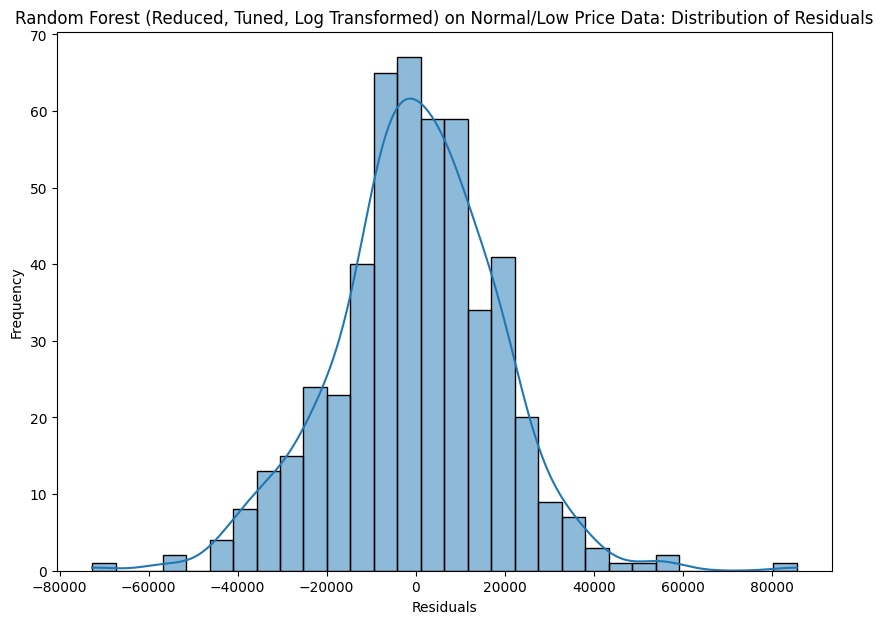

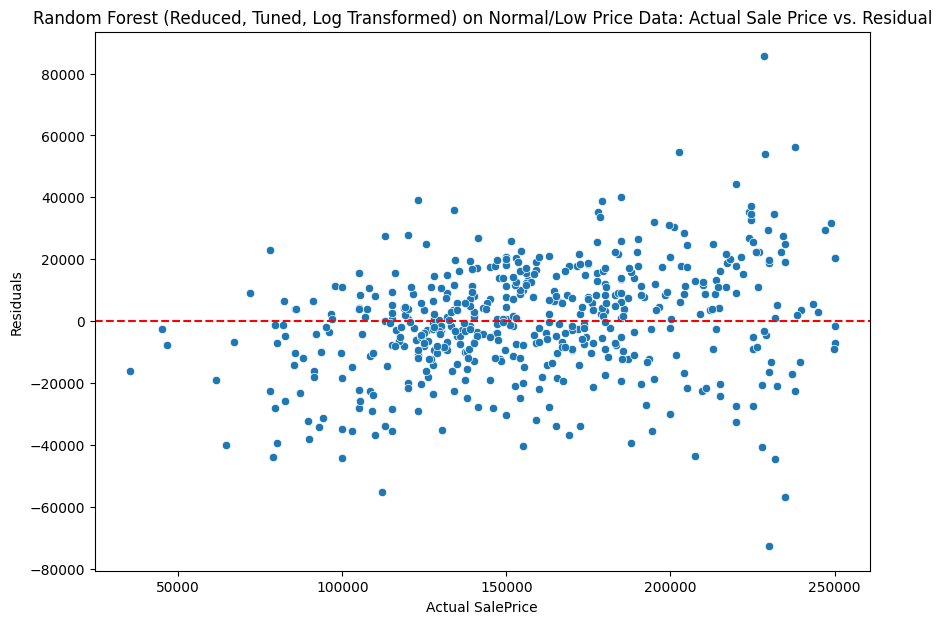


Random Forest (Reduced, Tuned, Log Transformed): High Sale Price


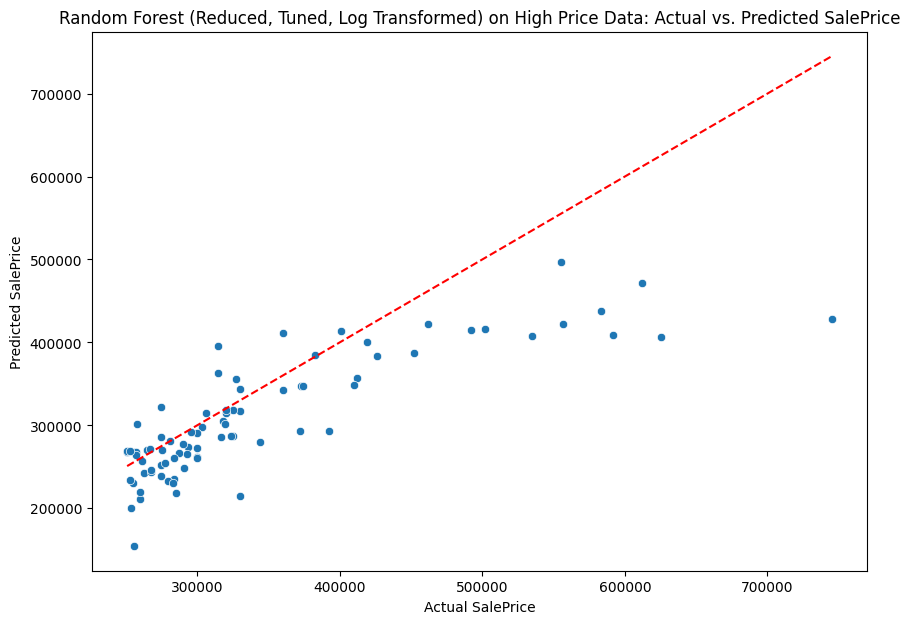

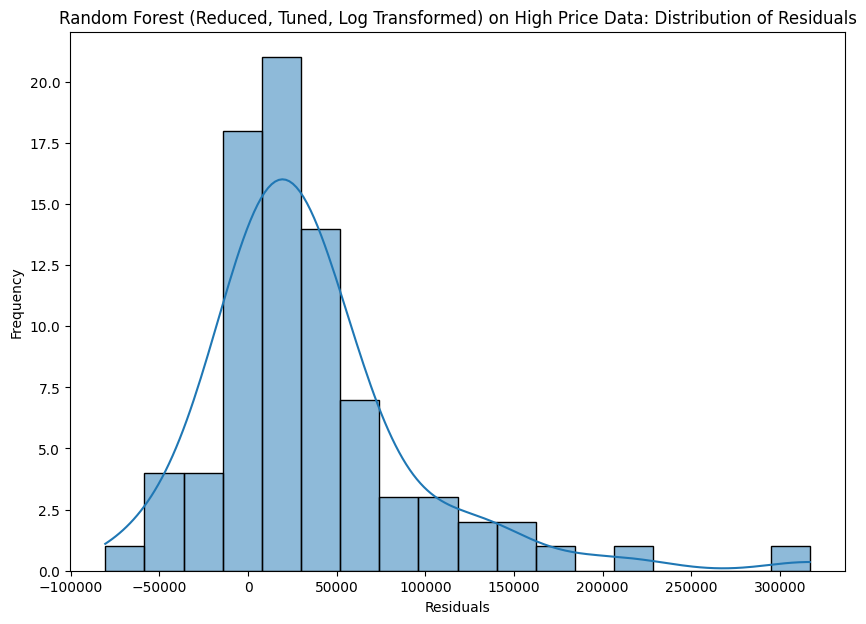

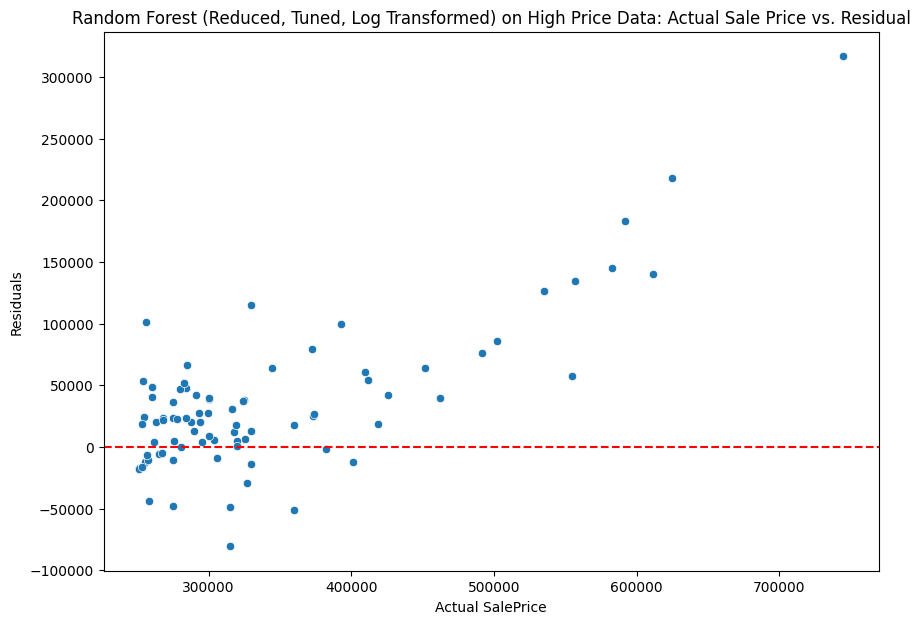


Random Forest (Reduced, Tuned, Log Transformed): Full Dataset


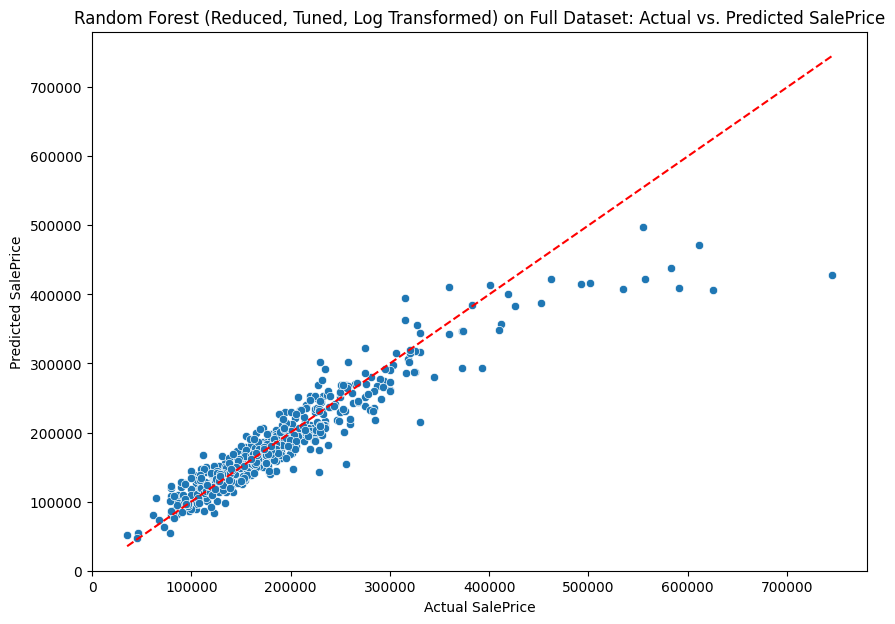

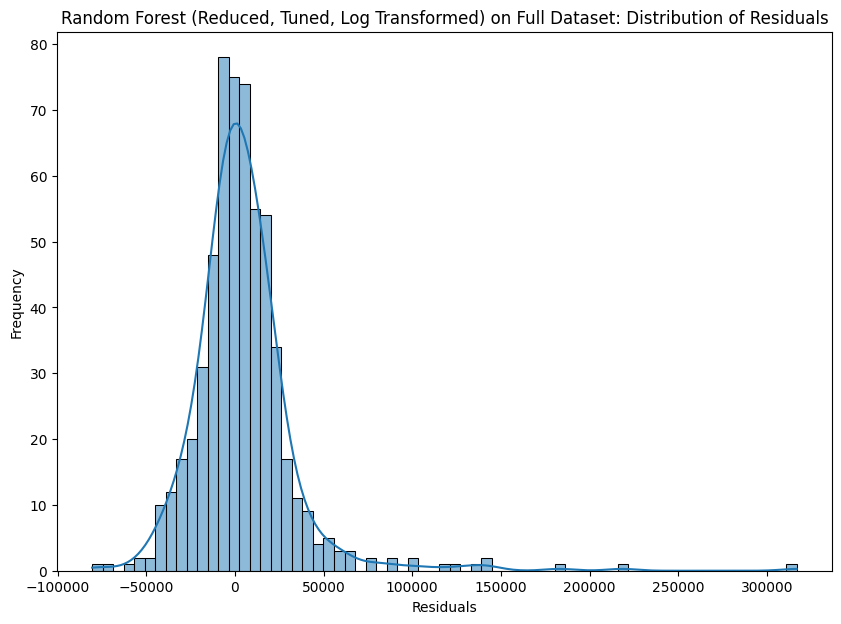

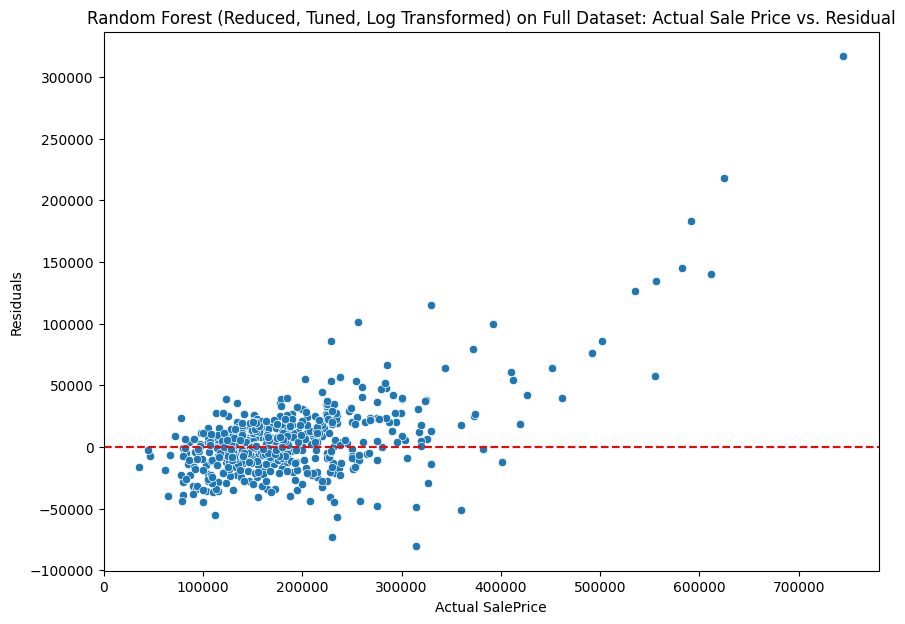


Random Forest (Reduced, Tuned, Log Transformed): Scores

Random Forest (Reduced, Tuned, Log Transformed): Low to Normal Sale Price
Mean Squared Error: 333623383.70
Root Mean Squared Error: 18265.36
R-squared: 0.82

Random Forest (Reduced, Tuned, Log Transformed): High Sale Price
Mean Squared Error: 4718287096.85
Root Mean Squared Error: 68689.79
R-squared: 0.56

Random Forest (Reduced, Tuned, Log Transformed): Full Dataset
Mean Squared Error: 952457160.77
Root Mean Squared Error: 30861.90
R-squared: 0.87


In [ ]:
rfr_reduced_log = RandomForestRegressor(
    n_estimators=best_params_rfr_reduced_log['n_estimators'],
    min_samples_split=best_params_rfr_reduced_log['min_samples_split'],
    min_samples_leaf=best_params_rfr_reduced_log['min_samples_leaf'],
    max_depth=best_params_rfr_reduced_log['max_depth'],
    random_state=RS
)

rfr_reduced_log.fit(X_train_reduced, y_train_log)

log_undo_model_compare_predictions_values_all(rfr_reduced_log, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, model_name = 'Random Forest (Reduced, Tuned, Log Transformed)')

### Re-train Tuned XGBoost on Threshold-Reduced Feature Data

In [ ]:
xgb_reduced = XGBRegressor(random_state=RS)

grid_params_reduced = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 3]
}

grid_search_reduced = GridSearchCV(xgb_reduced, grid_params_reduced, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_reduced.fit(X_train_reduced, y_train)

best_params_xgb_reduced = grid_search_reduced.best_params_
print(f"Best hyperparameters for XGBoost on Threshold-selected data: {best_params_xgb_reduced}")

xgboost_reduced_tuned = XGBRegressor(
    n_estimators=best_params_xgb_reduced['n_estimators'],
    learning_rate=best_params_xgb_reduced['learning_rate'],
    max_depth=best_params_xgb_reduced['max_depth'],
    min_child_weight=best_params_xgb_reduced['min_child_weight'],
    random_state=RS
)

Best hyperparameters for XGBoost on Threshold-selected data: {'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 200}



XGBoost (Reduced, Tuned, All Data): Low to Normal Sale Price


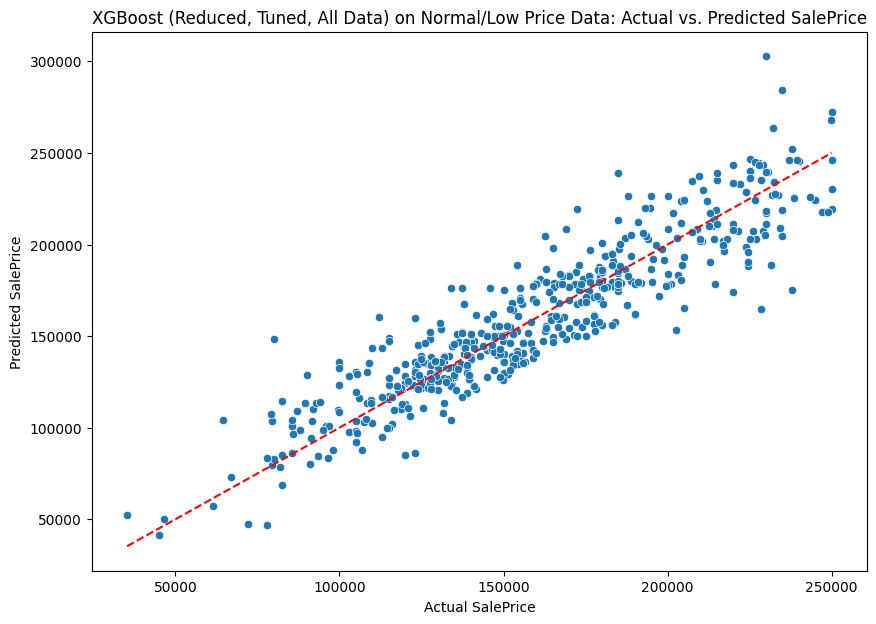

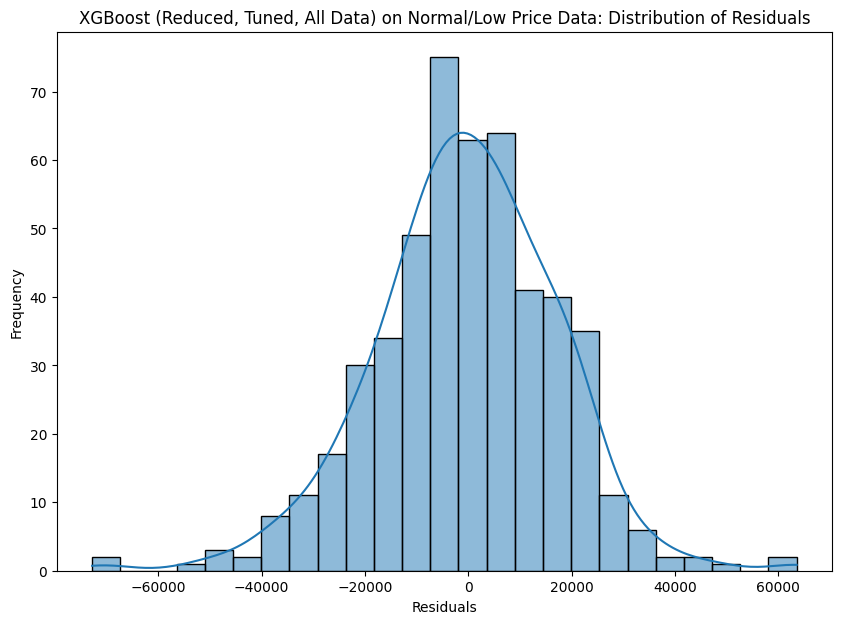

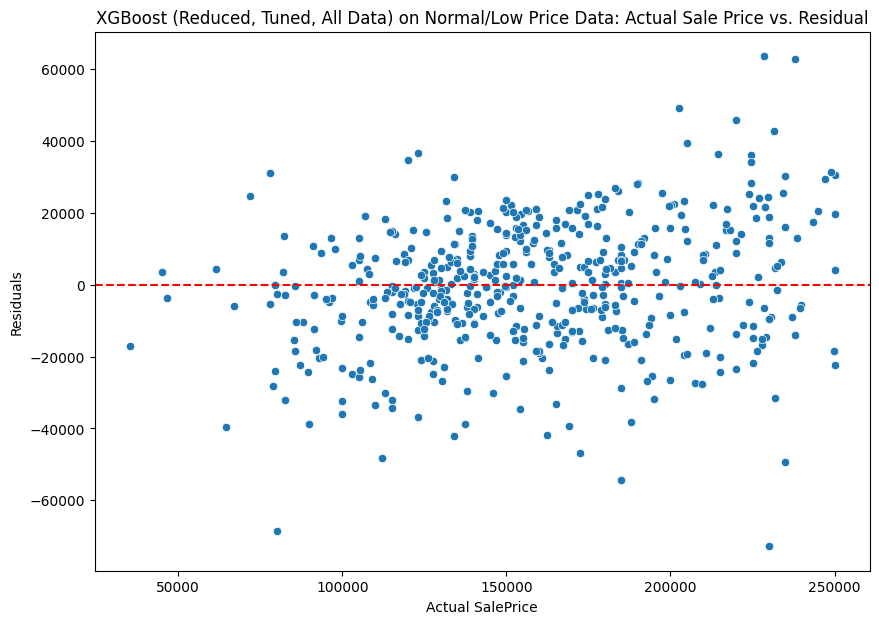


XGBoost (Reduced, Tuned, All Data): High Sale Price


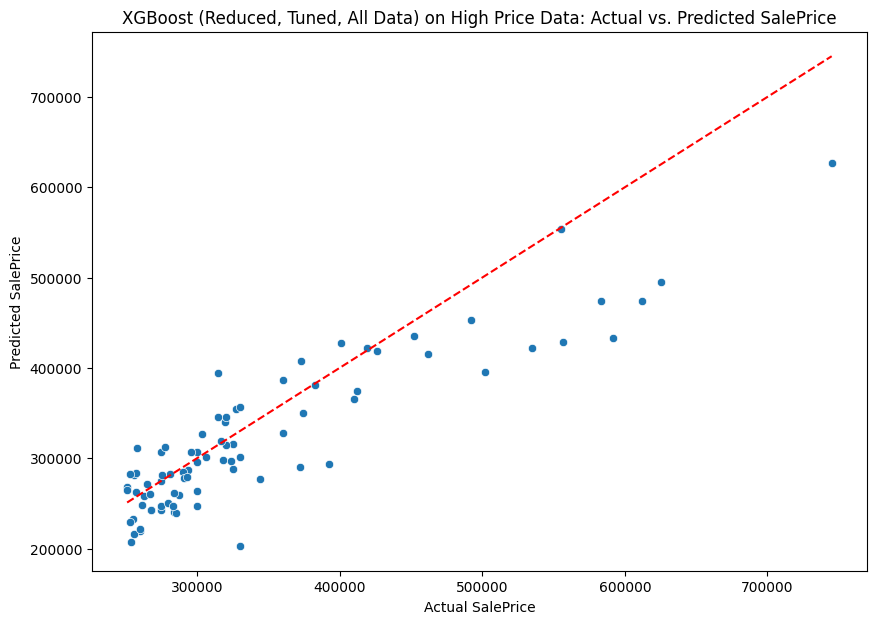

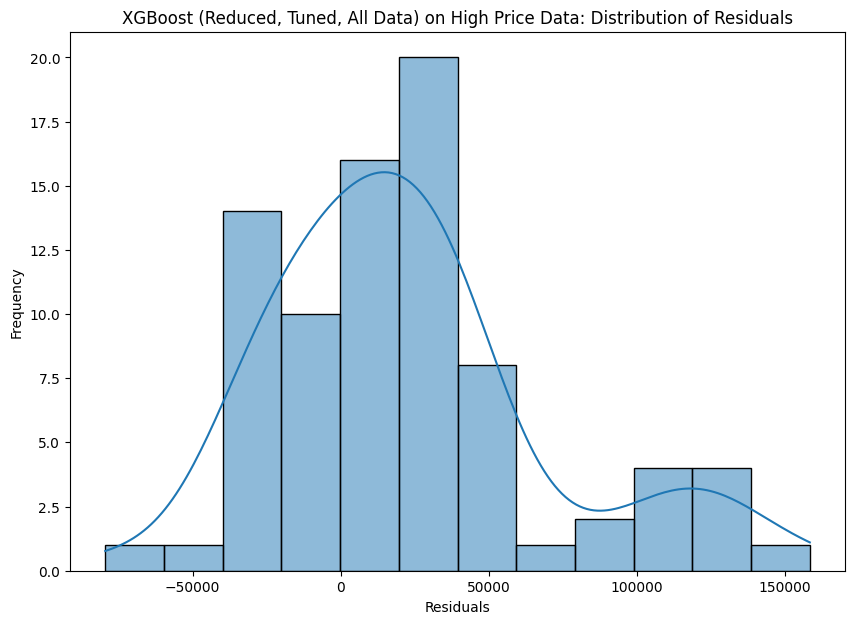

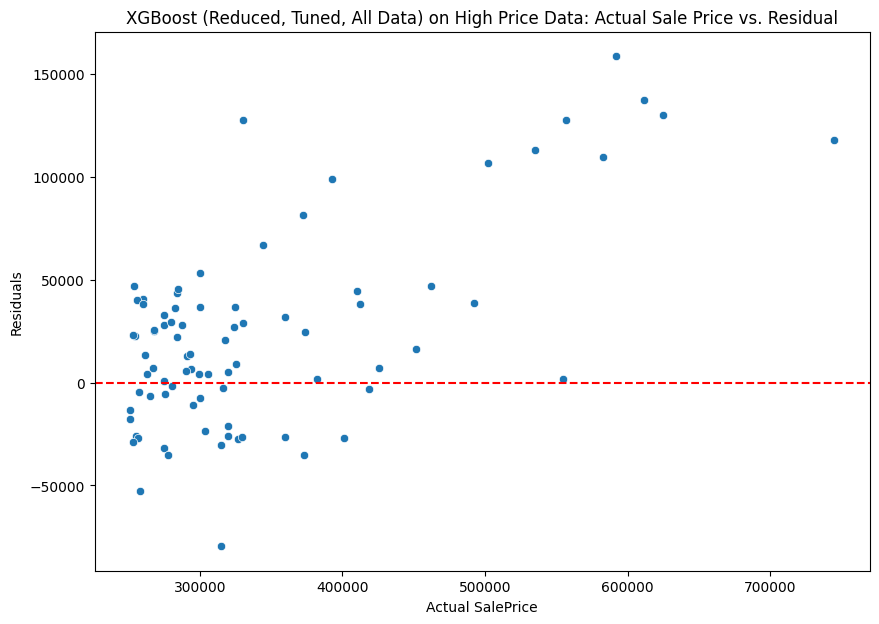


XGBoost (Reduced, Tuned, All Data): Full Dataset


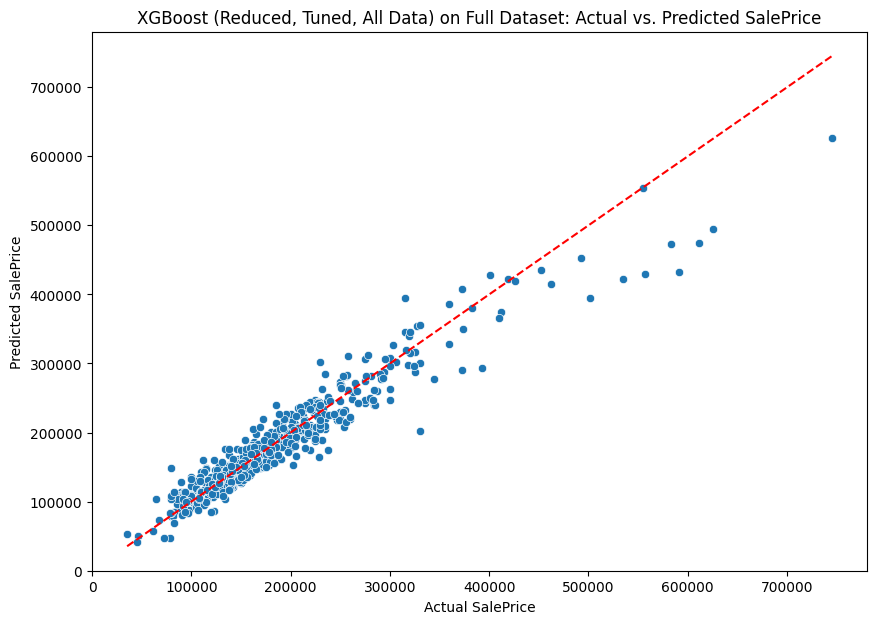

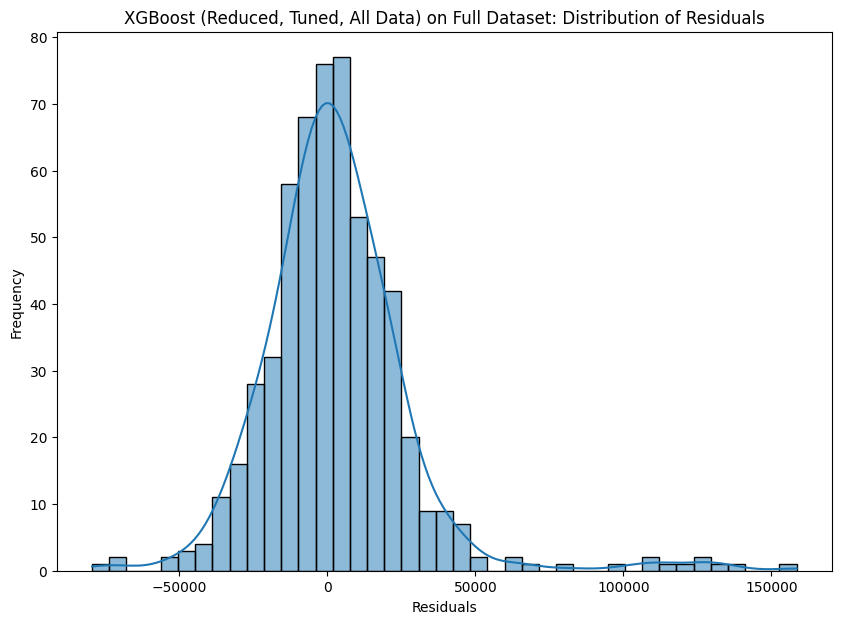

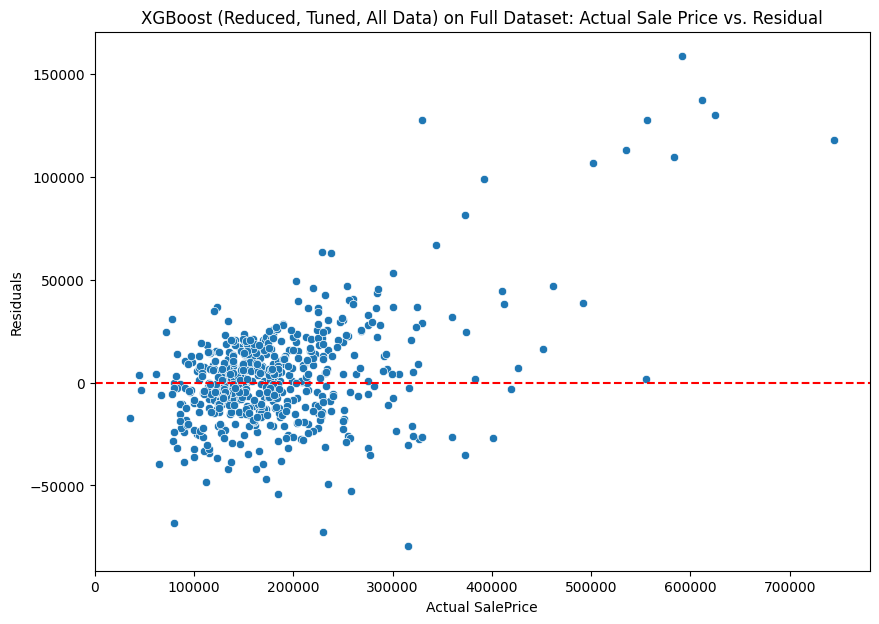


XGBoost (Reduced, Tuned, All Data): Scores

XGBoost (Reduced, Tuned, All Data): Low to Normal Sale Price
Mean Squared Error: 311209248.00
Root Mean Squared Error: 17641.12
R-squared: 0.83

XGBoost (Reduced, Tuned, All Data): High Sale Price
Mean Squared Error: 2698115840.00
Root Mean Squared Error: 51943.39
R-squared: 0.75

XGBoost (Reduced, Tuned, All Data): Full Dataset
Mean Squared Error: 648087616.00
Root Mean Squared Error: 25457.57
R-squared: 0.91


In [ ]:
xgboost_reduced_tuned.fit(X_train_reduced, y_train)

model_compare_predictions_values_all(xgboost_reduced_tuned, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, model_name = 'XGBoost (Reduced, Tuned, All Data)')

### Re-train XGBoost on Reduced Feature Data with Log-Transformed Target

In [ ]:
#y_train_log = np.log(y_train)
#y_test_log = np.log(y_test)

xgb_reduced_log = XGBRegressor(random_state=RS)

grid_params_reduced_log = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 3]
}

grid_search_reduced_log = GridSearchCV(xgb_reduced_log, grid_params_reduced_log, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_reduced_log.fit(X_train_reduced, y_train_log)

best_params_xgb_reduced_log = grid_search_reduced_log.best_params_
print(f"Best hyperparameters for XGBoost on reduced high-price data with log transform: {best_params_xgb_reduced_log}")

Best hyperparameters for XGBoost on reduced high-price data with log transform: {'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 200}



XGBoost (Log Transformed, Reduced, Tuned): Low to Normal Sale Price


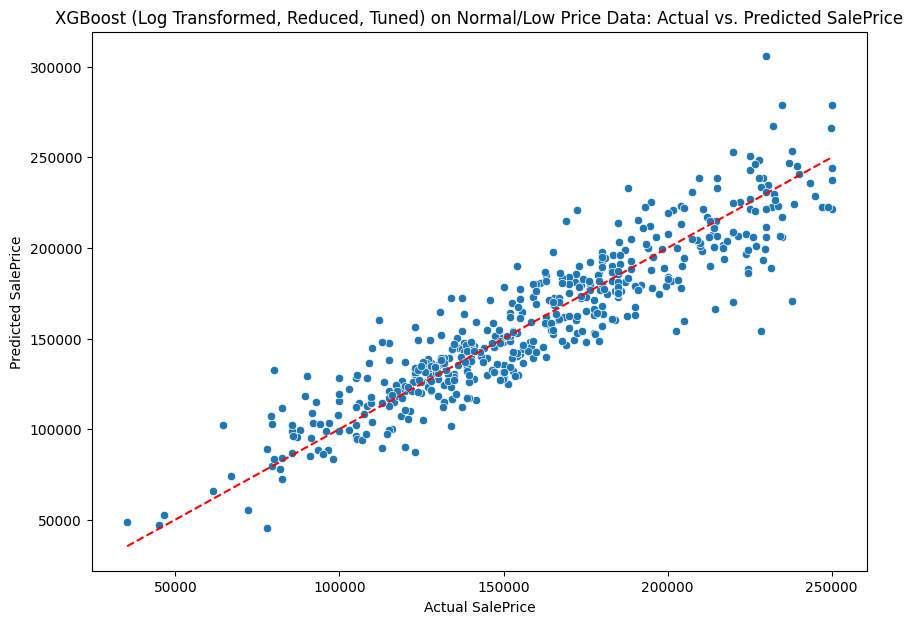

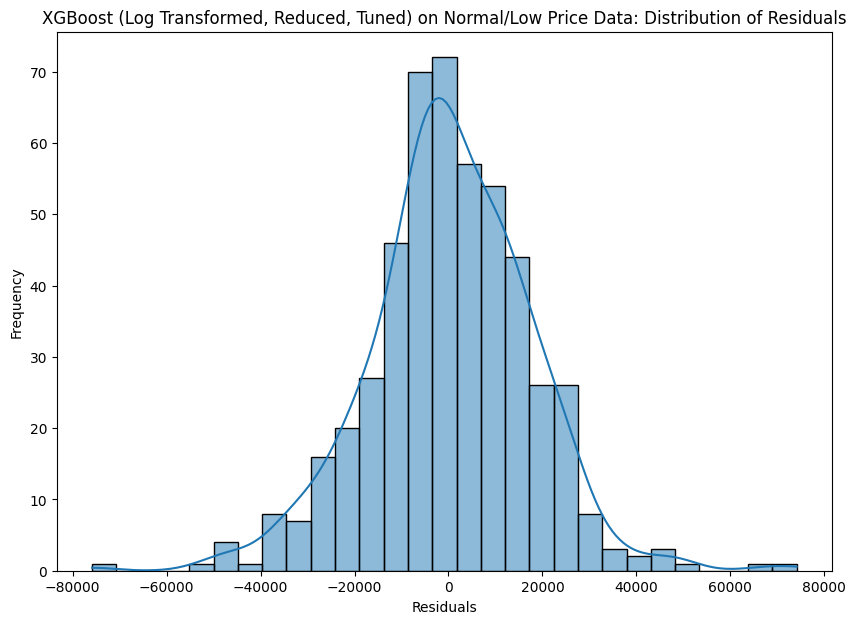

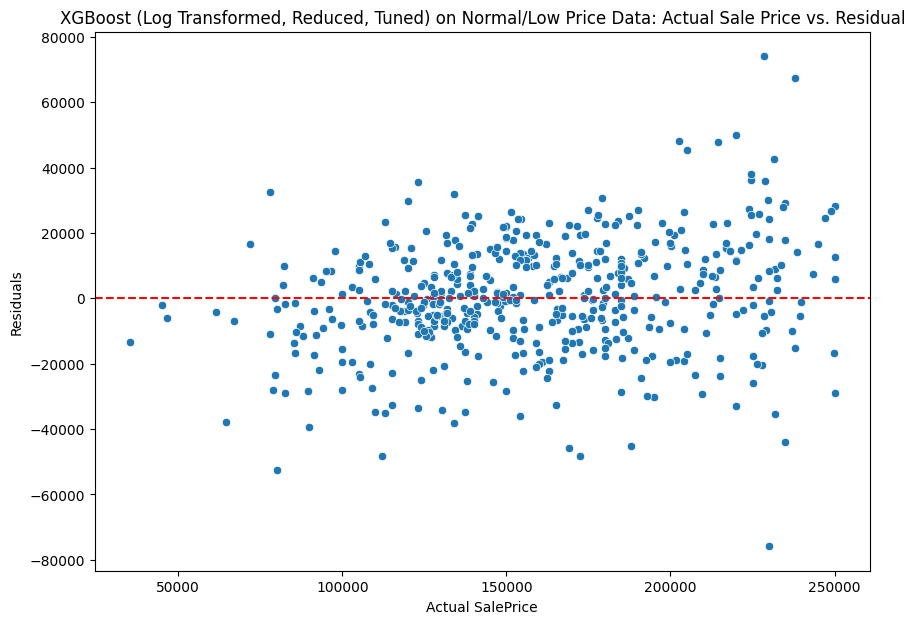


XGBoost (Log Transformed, Reduced, Tuned): High Sale Price


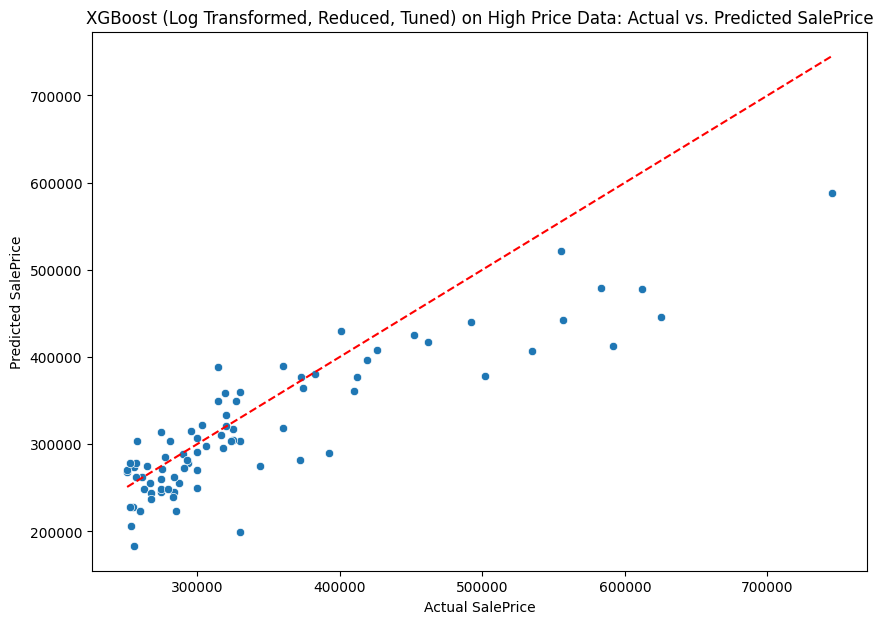

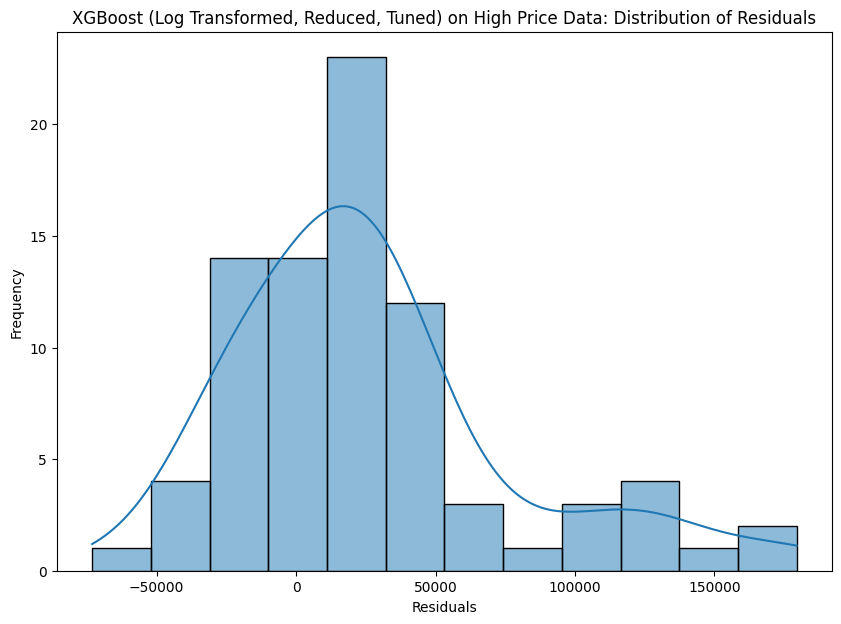

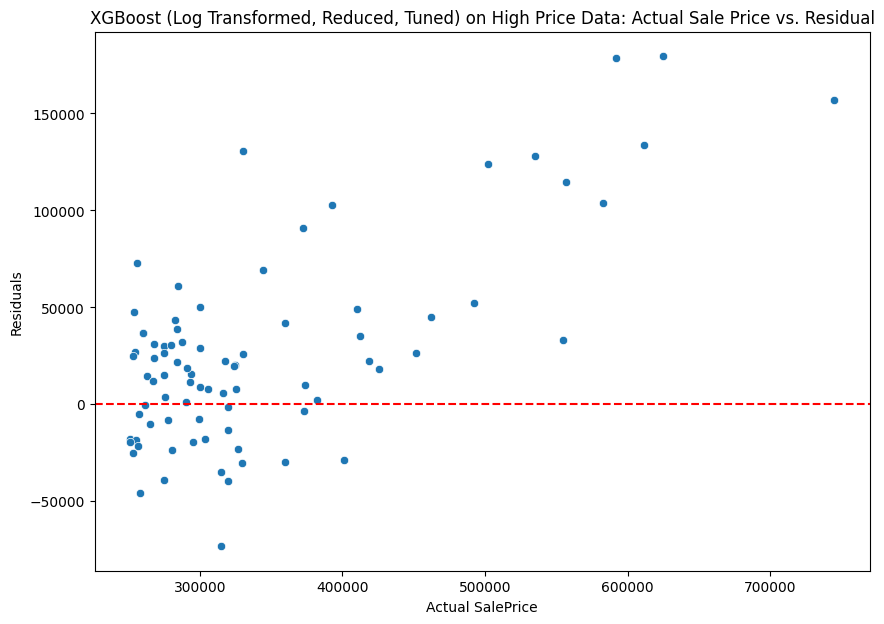


XGBoost (Log Transformed, Reduced, Tuned): Full Dataset


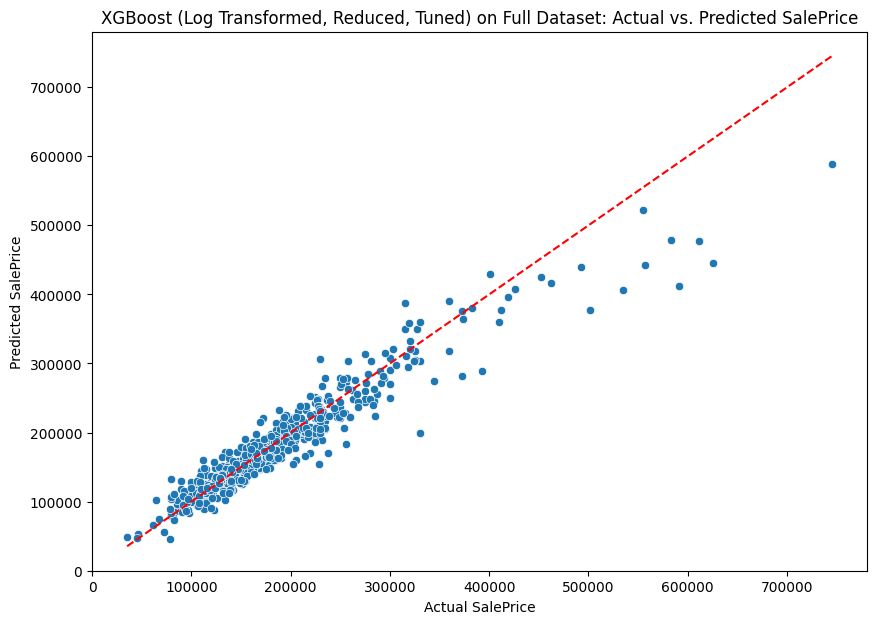

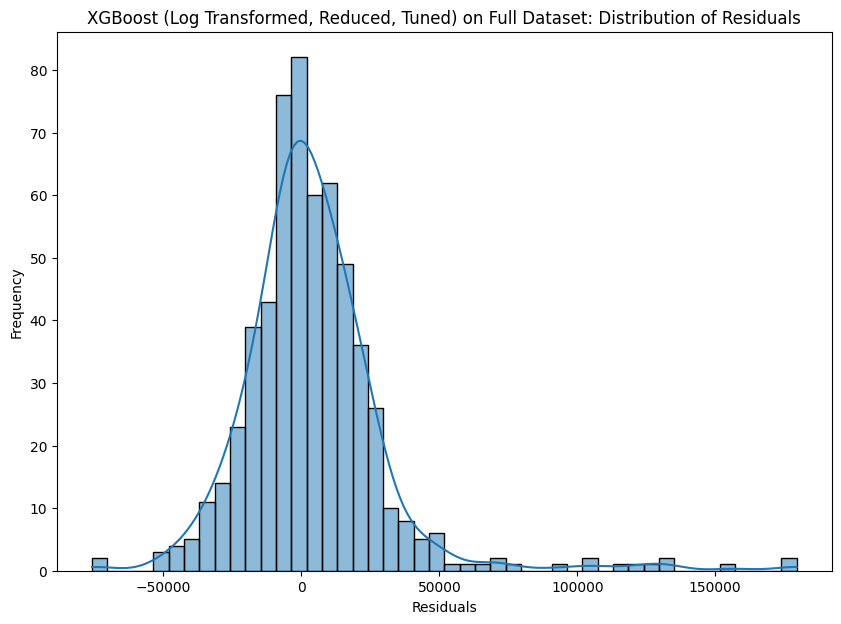

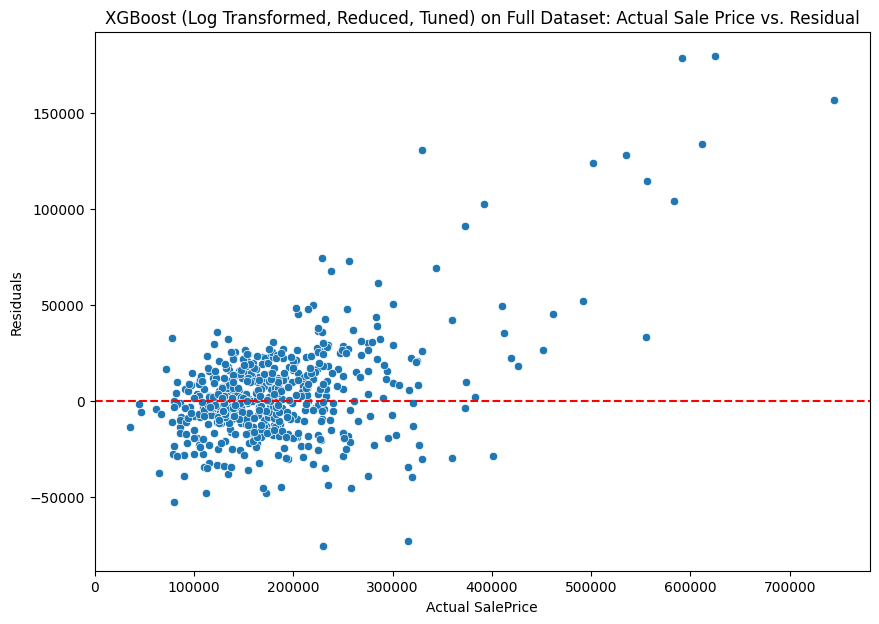


XGBoost (Log Transformed, Reduced, Tuned): Scores

XGBoost (Log Transformed, Reduced, Tuned): Low to Normal Sale Price
Mean Squared Error: 300806368.00
Root Mean Squared Error: 17343.77
R-squared: 0.84

XGBoost (Log Transformed, Reduced, Tuned): High Sale Price
Mean Squared Error: 3245317888.00
Root Mean Squared Error: 56967.69
R-squared: 0.70

XGBoost (Log Transformed, Reduced, Tuned): Full Dataset
Mean Squared Error: 716382912.00
Root Mean Squared Error: 26765.33
R-squared: 0.90


In [ ]:
xgboost_reduced_tuned_log = XGBRegressor(
    n_estimators=best_params_xgb_reduced_log['n_estimators'],
    learning_rate=best_params_xgb_reduced_log['learning_rate'],
    max_depth=best_params_xgb_reduced_log['max_depth'],
    min_child_weight=best_params_xgb_reduced_log['min_child_weight'],
    random_state=RS
)

xgboost_reduced_tuned_log.fit(X_train_reduced, y_train_log)

log_undo_model_compare_predictions_values_all(xgboost_reduced_tuned_log, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, model_name = 'XGBoost (Log Transformed, Reduced, Tuned)')

## Support Vector Regression (SVR)

### Overall data

In [ ]:
# Support Vector Regression Classifier
from sklearn.svm import SVR

svr = SVR()
grid_params = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

grid_search_svr = GridSearchCV(svr, grid_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_svr.fit(X_train_preprocessed, y_train)
grid_search_svr.best_params_

{'C': 10, 'gamma': 'scale', 'kernel': 'linear'}


SVR (Tuned, All Data): Low to Normal Sale Price


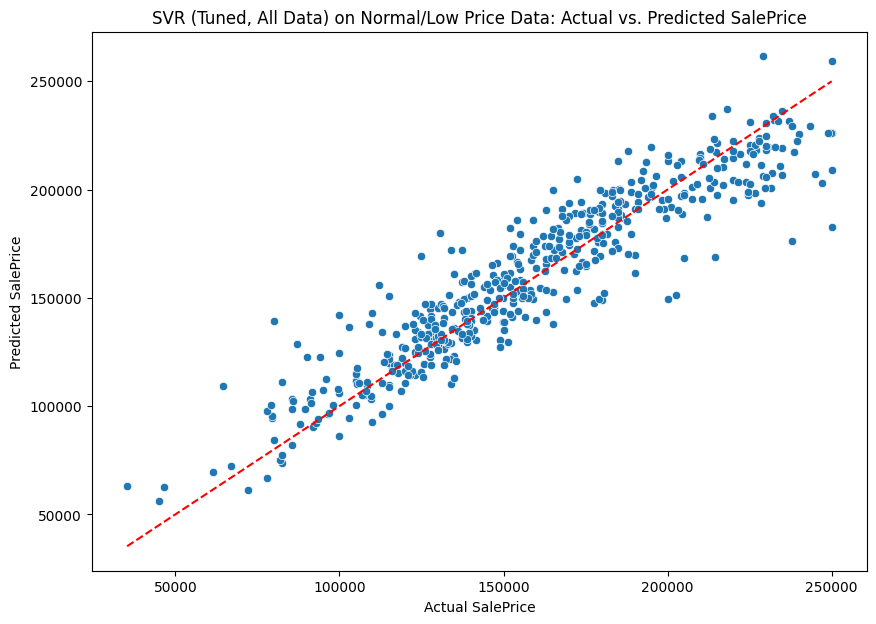

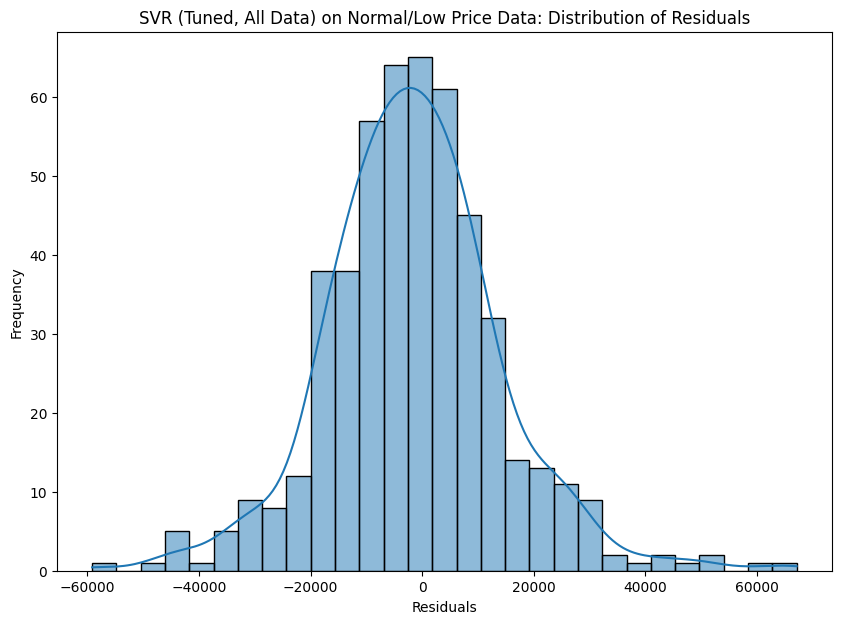

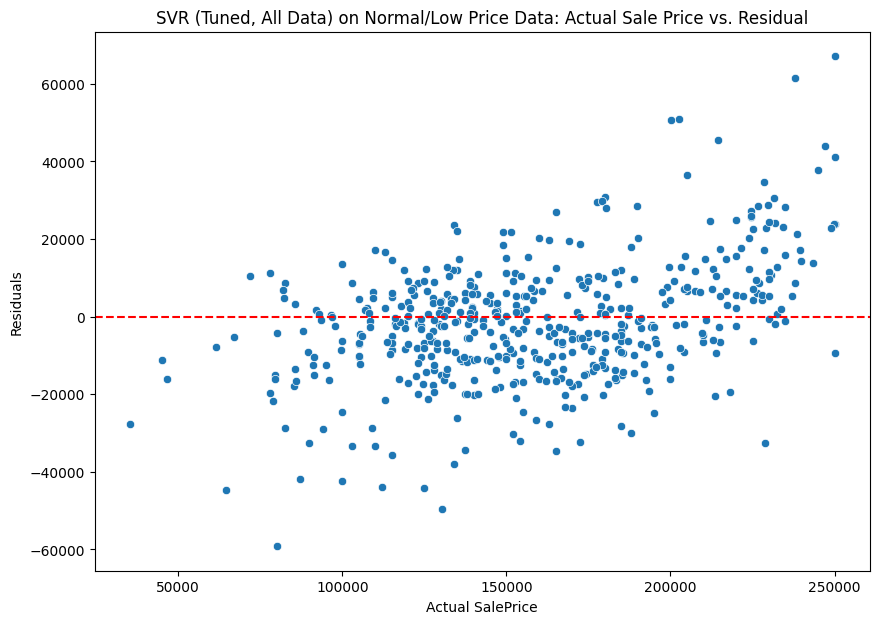


SVR (Tuned, All Data): High Sale Price


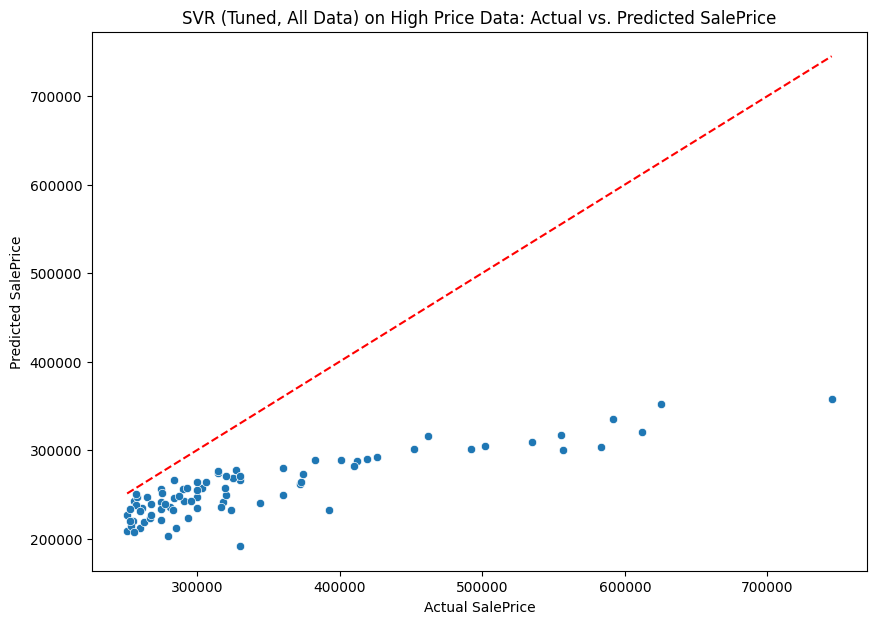

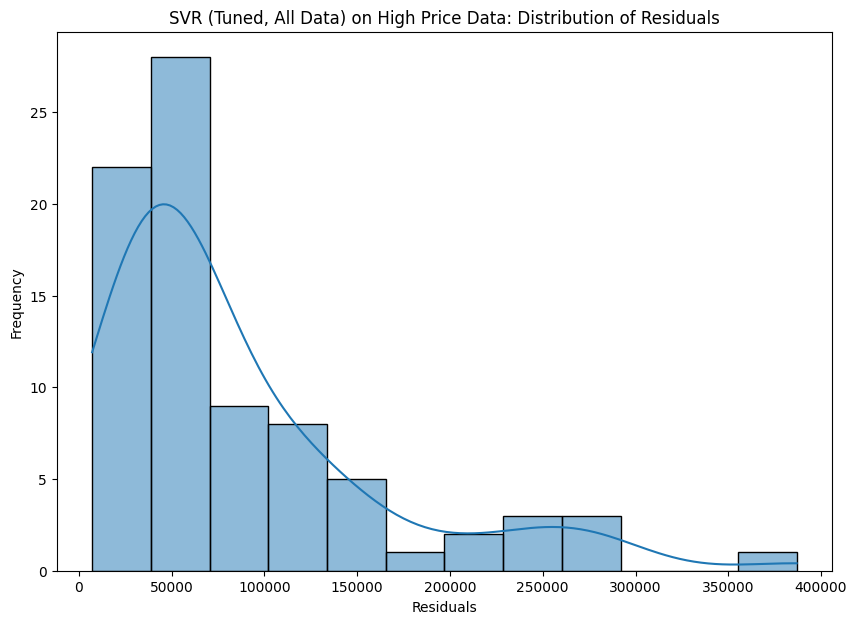

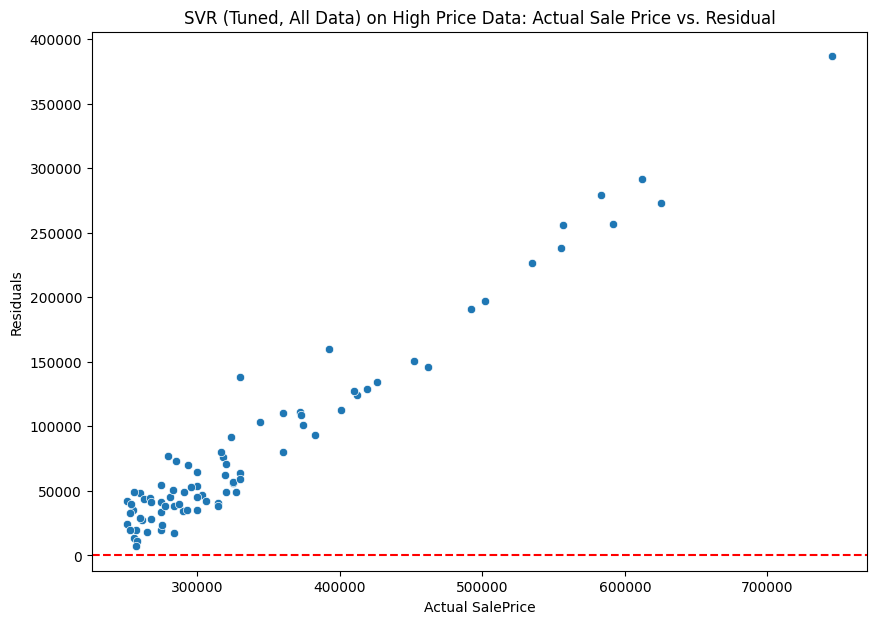


SVR (Tuned, All Data): Full Dataset


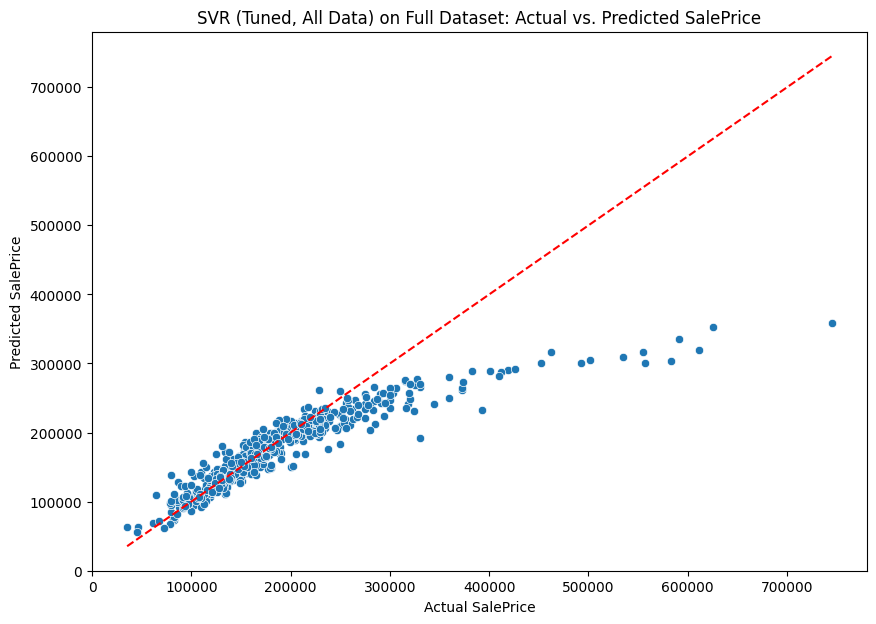

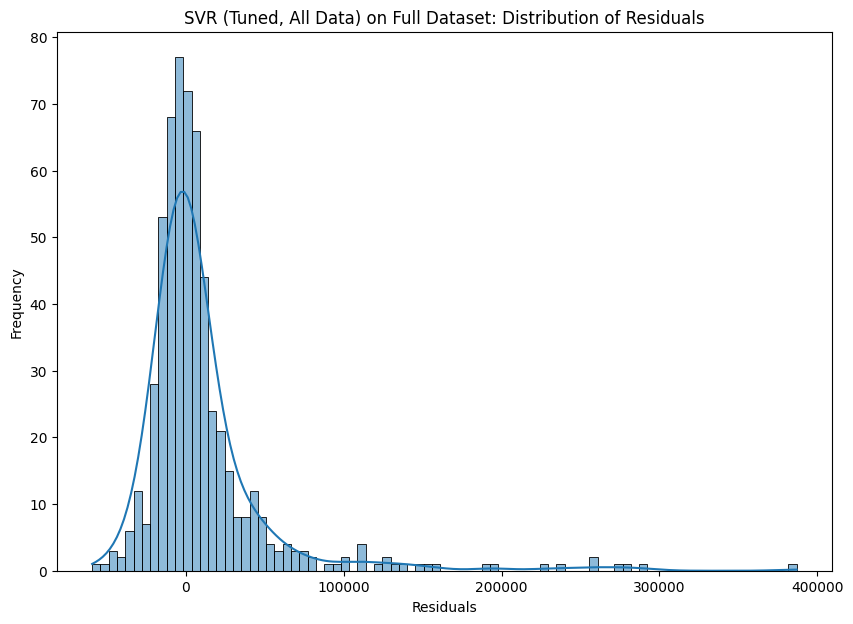

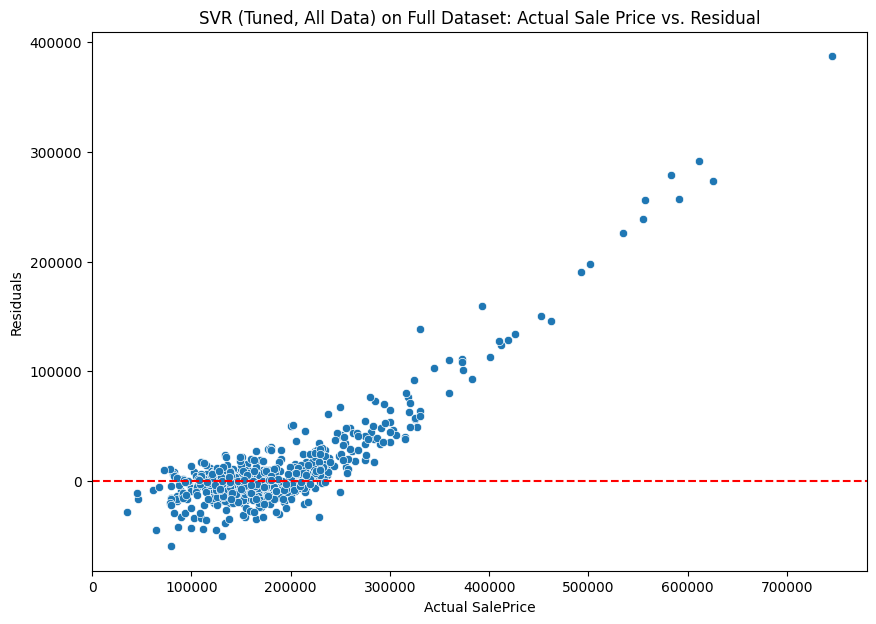


SVR (Tuned, All Data): Scores

SVR (Tuned, All Data): Low to Normal Sale Price
Mean Squared Error: 248598290.89
Root Mean Squared Error: 15767.00
R-squared: 0.87

SVR (Tuned, All Data): High Sale Price
Mean Squared Error: 13031538203.22
Root Mean Squared Error: 114155.76
R-squared: -0.21

SVR (Tuned, All Data): Full Dataset
Mean Squared Error: 2052730946.33
Root Mean Squared Error: 45307.07
R-squared: 0.71


In [ ]:
svr_best = SVR(C=grid_search_svr.best_params_['C'], gamma=grid_search_svr.best_params_['gamma'], kernel=grid_search_svr.best_params_['kernel'])
svr_best.fit(X_train_preprocessed, y_train)
y_pred_svr = svr_best.predict(X_test_preprocessed)

model_compare_predictions_values_all(svr_best, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, model_name = 'SVR (Tuned, All Data)')

### Reduced Data

In [ ]:
svr = SVR()
grid_params = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

grid_search_svr_reduced = GridSearchCV(svr, grid_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_svr_reduced.fit(X_train_reduced, y_train)

svr_best_reduced = SVR(C=grid_search_svr_reduced.best_params_['C'], gamma=grid_search_svr_reduced.best_params_['gamma'], kernel=grid_search_svr_reduced.best_params_['kernel'])
svr_best_reduced.fit(X_train_reduced, y_train)

SVR(C=10, kernel='linear')


SVR (All Data, Reduced): Low to Normal Sale Price


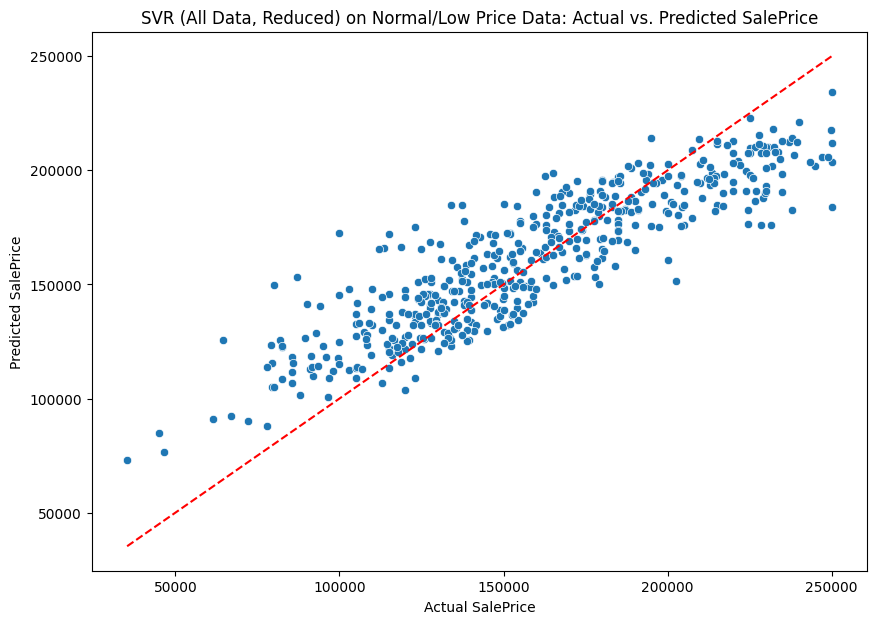

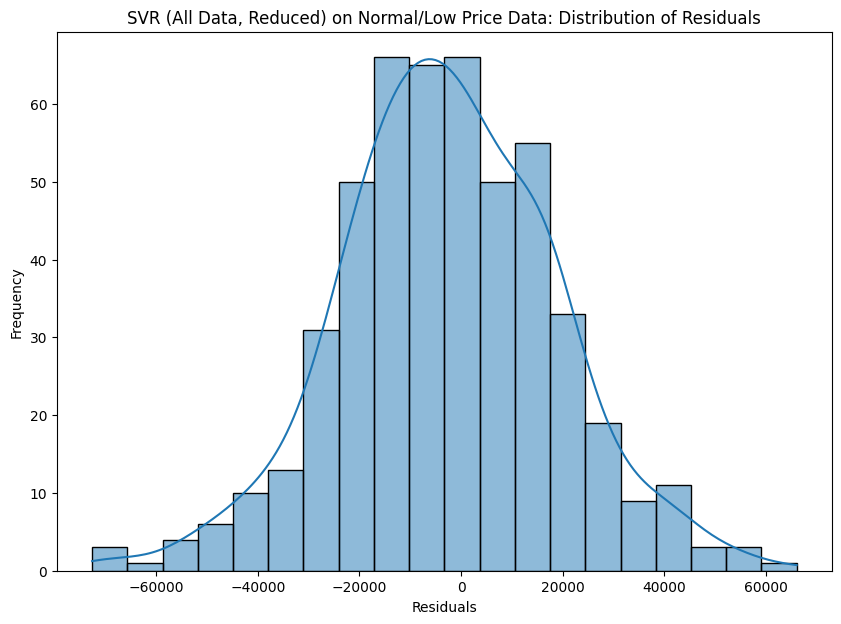

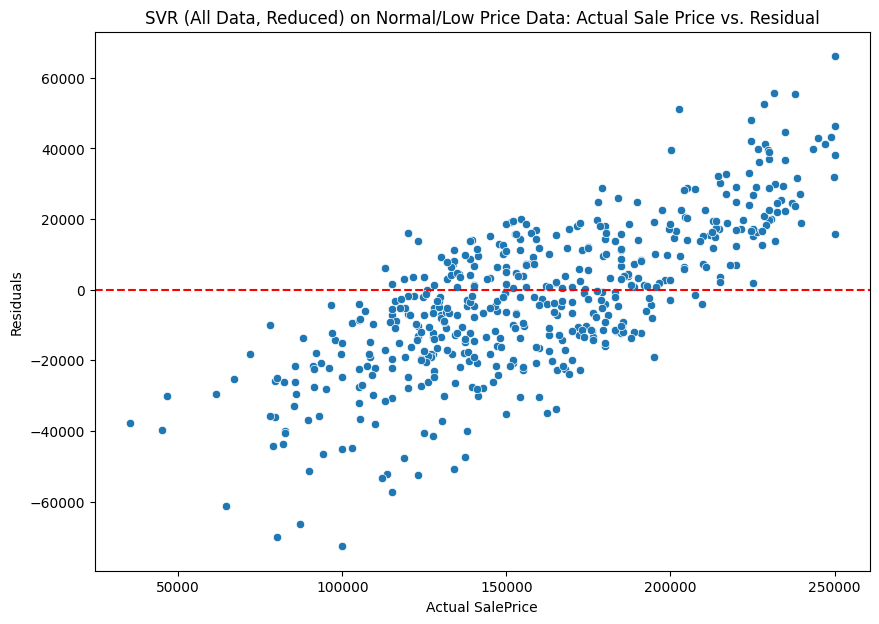


SVR (All Data, Reduced): High Sale Price


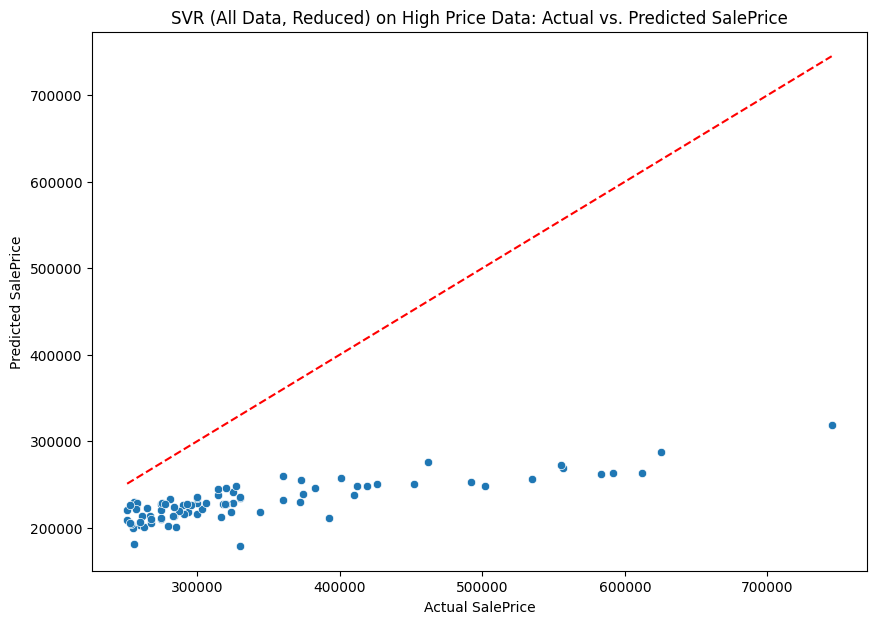

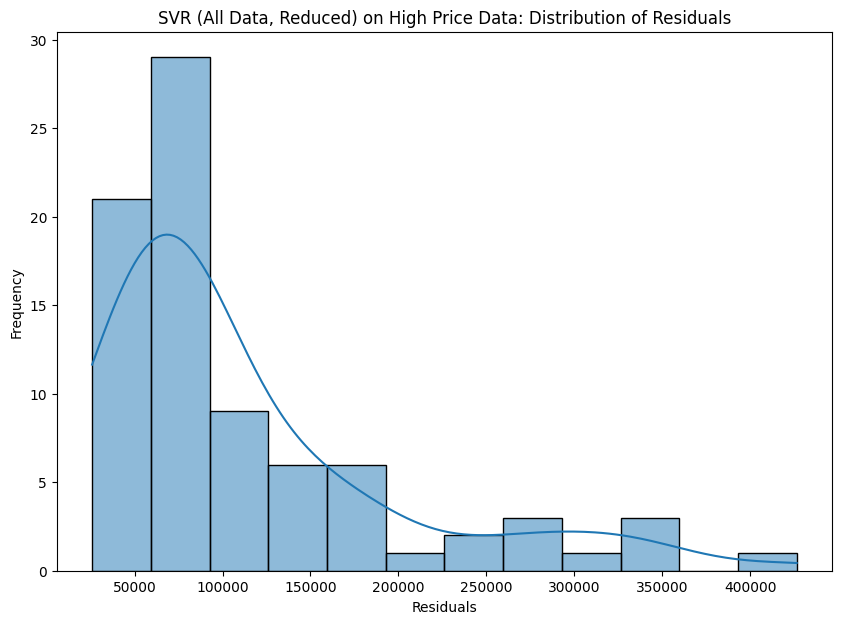

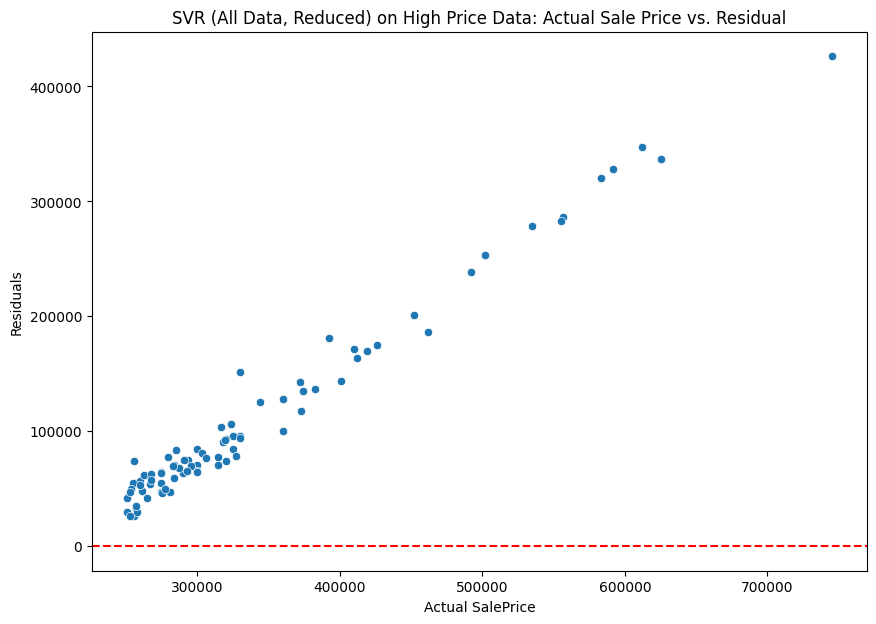


SVR (All Data, Reduced): Full Dataset


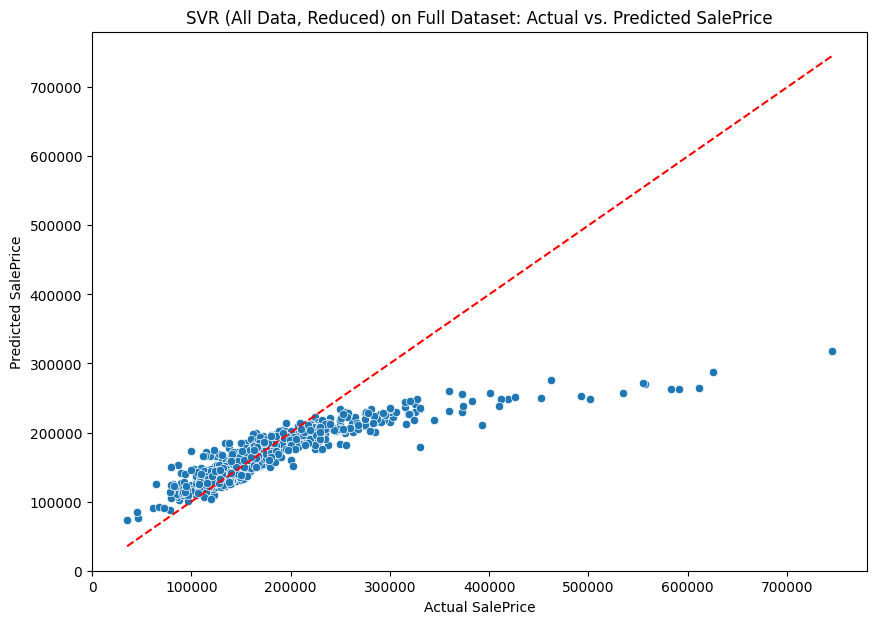

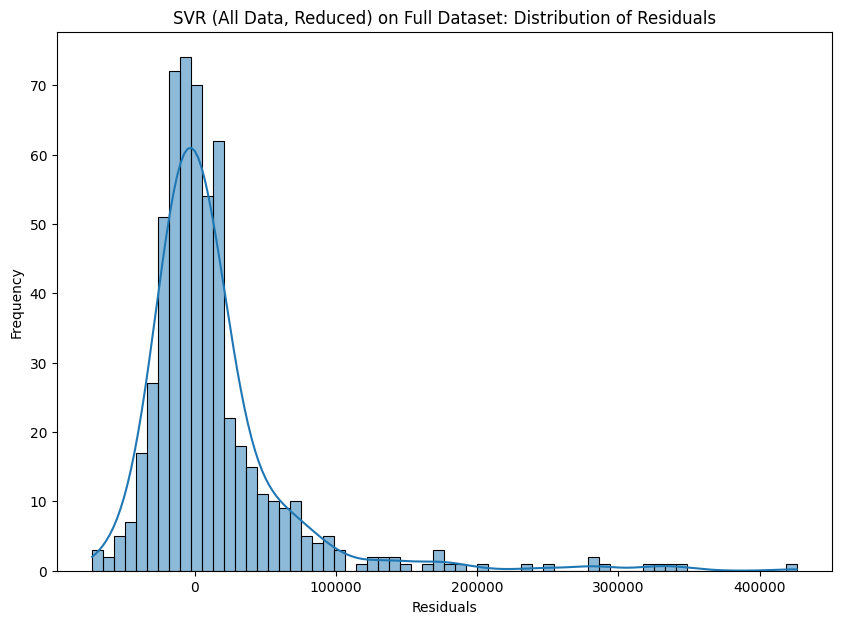

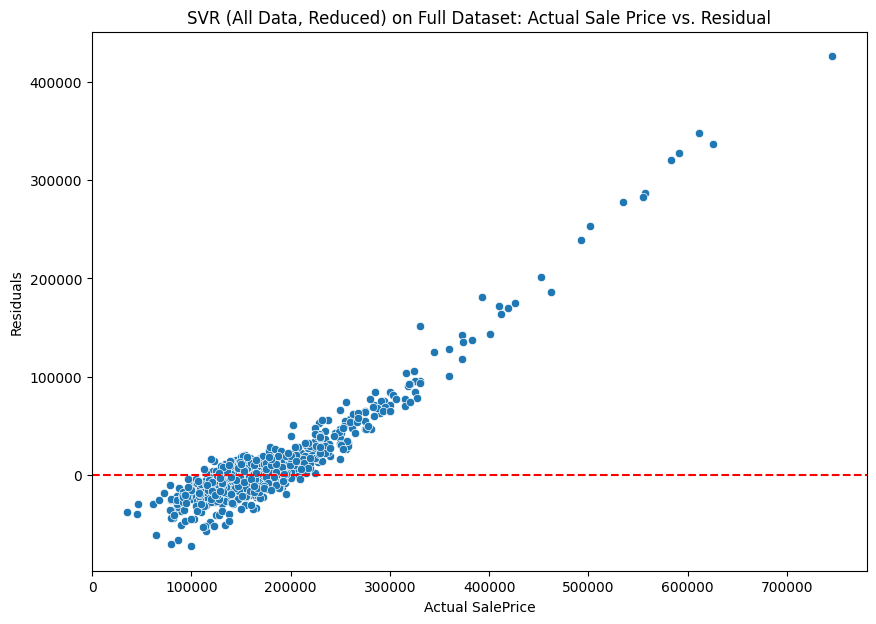


SVR (All Data, Reduced): Scores

SVR (All Data, Reduced): Low to Normal Sale Price
Mean Squared Error: 457350856.36
Root Mean Squared Error: 21385.76
R-squared: 0.75

SVR (All Data, Reduced): High Sale Price
Mean Squared Error: 19826919493.51
Root Mean Squared Error: 140808.09
R-squared: -0.84

SVR (All Data, Reduced): Full Dataset
Mean Squared Error: 3191093762.12
Root Mean Squared Error: 56489.77
R-squared: 0.56


In [ ]:
model_compare_predictions_values_all(svr_best_reduced, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, model_name = 'SVR (All Data, Reduced)')

# Comparing all the models

Our models were:
rfr (not tuned), rfr_best (tuned on all data), rfr_log (not tuned),rfr_log_tuned (tuned on all data), xgb (not tuned), xgboost_best (tuned on all data), xgboost_log (tuned on all data), rfr_reduced_tuned (tuned on all data), rfr_reduced_log (tuned on all data), xgboost_reduced_tuned (tuned on all data), xgboost_reduced_tuned_log (all data), svr_best (all data, tuned), svr_best_reduced (all data, tuned)

In [ ]:
# Models trained on the full preprocessed data
for [model, model_name] in [
    [rfr, 'Random Forest (not tuned)'],
    [rfr_best, 'Random Forest (tuned)'],
    [xgb, 'XGBoost (not tuned)'],
    [xgboost_best, 'XGBoost (tuned)'],
    [svr_best, 'SVR (tuned, all data)']
    ]:
  model_compare_predictions_values_all(model, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, to_plot=False, model_name = model_name)
  print('\n')

# Models trained on the reduced preprocessed data
for [model, model_name] in [
    [rfr_reduced_tuned, 'Random Forest (tuned, reduced)'],
    [xgboost_reduced_tuned, 'XGBoost (tuned, reduced)'],
    [svr_best_reduced, 'SVR (tuned, reduced)']
    ]:
  model_compare_predictions_values_all(model, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, to_plot=False, model_name = model_name)
  print('\n')

print('\n Log Models')

# Log-transformed models trained on the full preprocessed data
for [log_model, model_name] in [
    [rfr_log, 'Random Forest (log transformed, not tuned)'],
    [rfr_log_tuned, 'Random Forest (log-transformed, tuned)'],
    [xgboost_log, 'XGBoost (log-transformed, tuned)']
]:
  log_undo_model_compare_predictions_values_all(log_model, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, to_plot = False, model_name = model_name)
  print('\n')

# Log-transformed models trained on the reduced preprocessed data
for [log_model, model_name] in [
    [rfr_reduced_log, 'Random Forest (log-transformed, tuned, reduced)'],
    [xgboost_reduced_tuned_log, 'XGBoost (log-transformed, tuned, reduced)']
]:
  log_undo_model_compare_predictions_values_all(log_model, X_test_normal_low_price_reduced, y_test_normal_low_price, X_test_high_price_reduced, y_test_high_price, X_test_reduced, y_test, to_plot = False, model_name = model_name)
  print('\n')


Random Forest (not tuned): Scores

Random Forest (not tuned): Low to Normal Sale Price
Mean Squared Error: 251781715.06
Root Mean Squared Error: 15867.63
R-squared: 0.86

Random Forest (not tuned): High Sale Price
Mean Squared Error: 3452785997.90
Root Mean Squared Error: 58760.41
R-squared: 0.68

Random Forest (not tuned): Full Dataset
Mean Squared Error: 703558567.37
Root Mean Squared Error: 26524.68
R-squared: 0.90



Random Forest (tuned): Scores

Random Forest (tuned): Low to Normal Sale Price
Mean Squared Error: 253322330.95
Root Mean Squared Error: 15916.10
R-squared: 0.86

Random Forest (tuned): High Sale Price
Mean Squared Error: 3442424622.61
Root Mean Squared Error: 58672.18
R-squared: 0.68

Random Forest (tuned): Full Dataset
Mean Squared Error: 703419384.16
Root Mean Squared Error: 26522.05
R-squared: 0.90



XGBoost (not tuned): Scores

XGBoost (not tuned): Low to Normal Sale Price
Mean Squared Error: 298911296.00
Root Mean Squared Error: 17289.05
R-squared: 0.84

XGBoos

# Choosing my Model

In [ ]:
chosen_model = xgboost_log


Chosen Model [XGBoost (Log Transformed)] : Low to Normal Sale Price


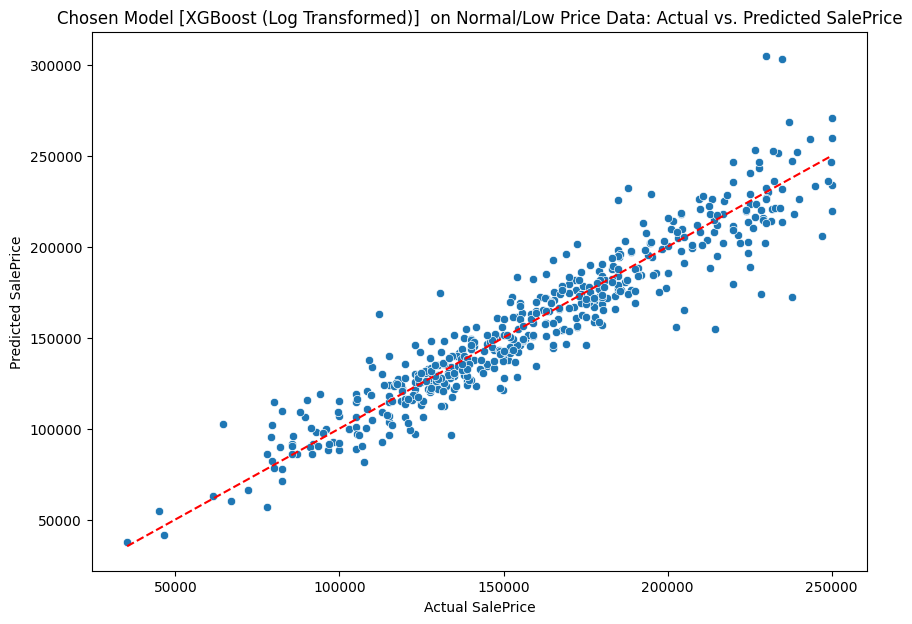

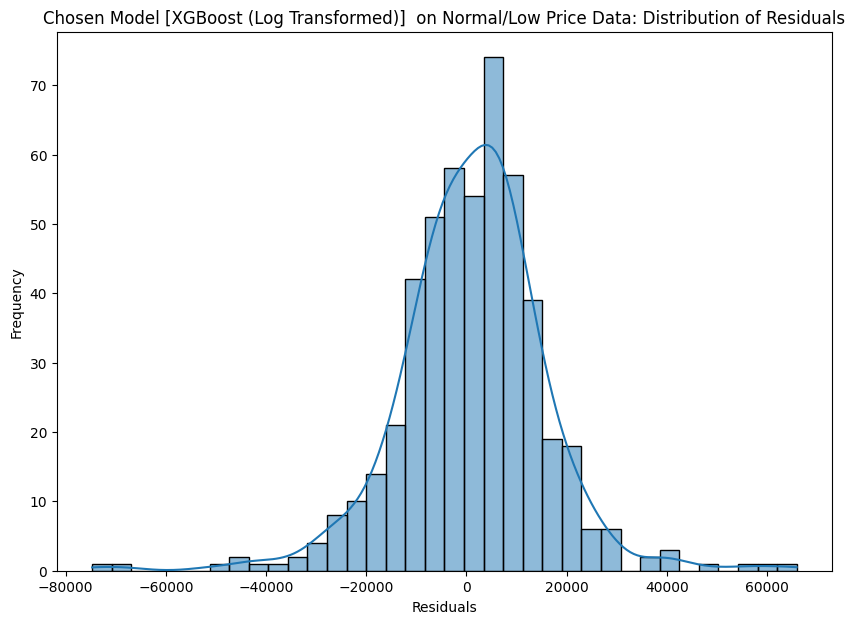

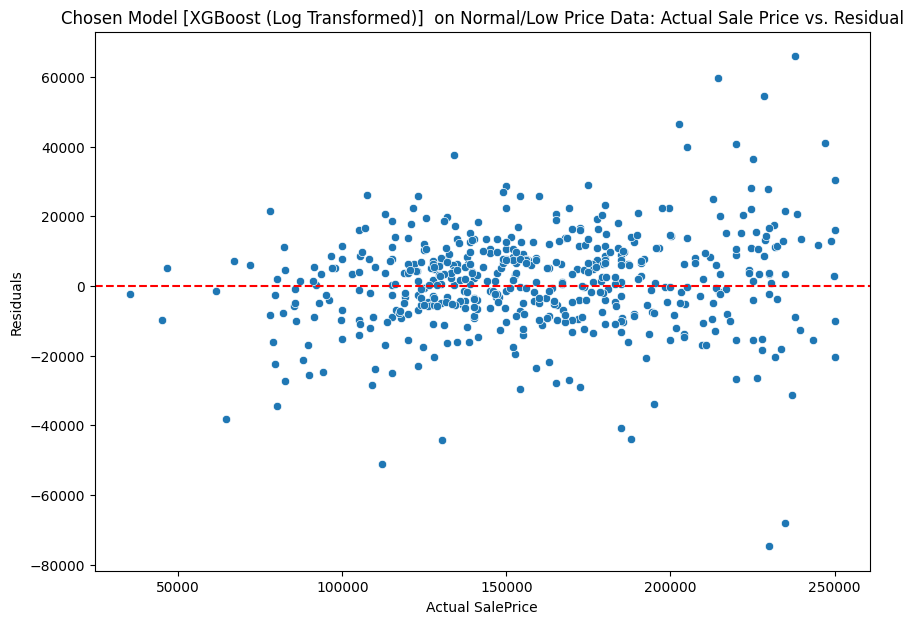


Chosen Model [XGBoost (Log Transformed)] : High Sale Price


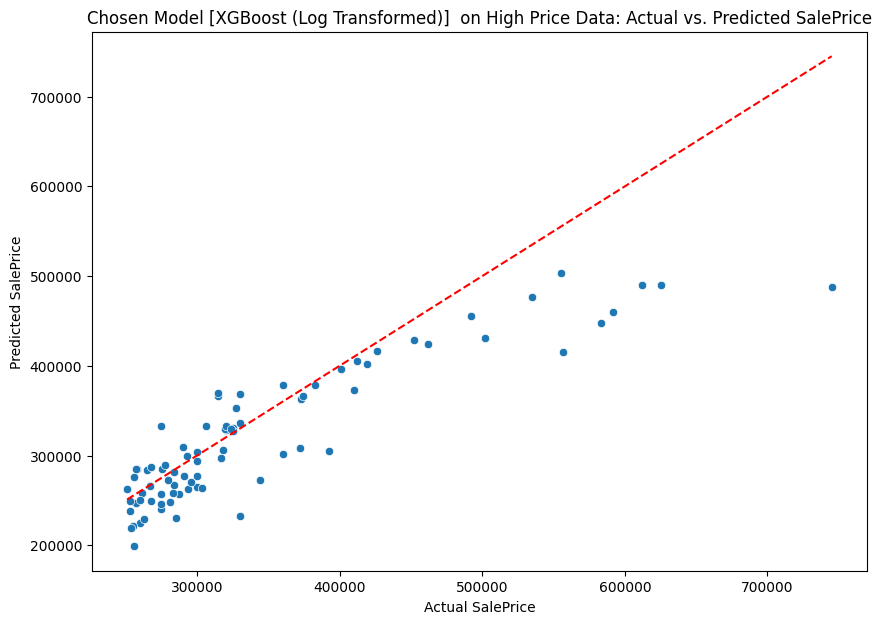

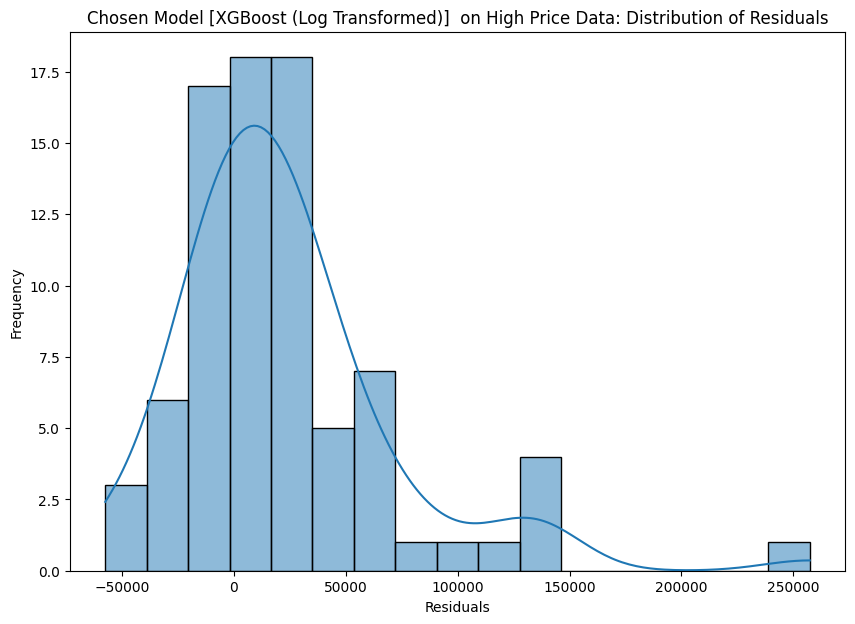

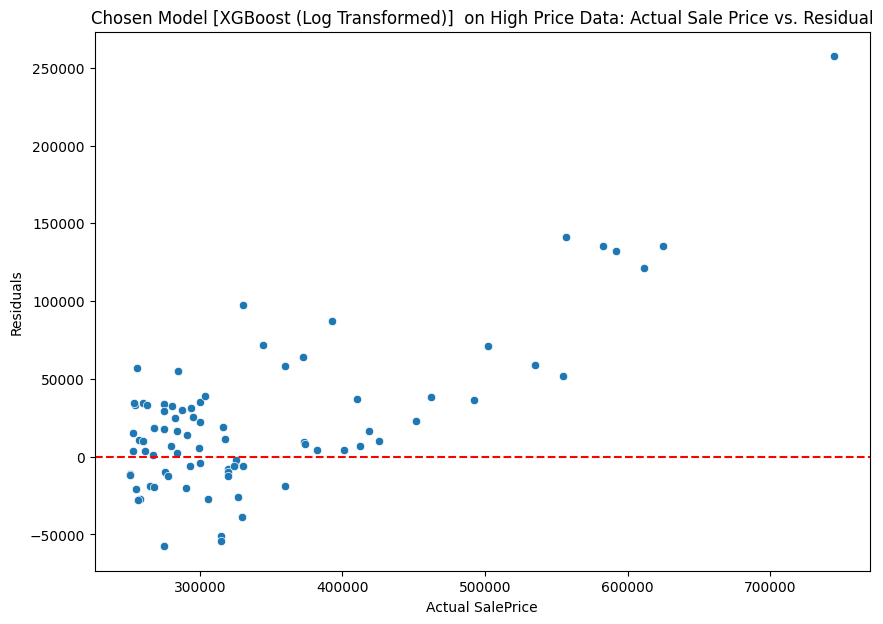


Chosen Model [XGBoost (Log Transformed)] : Full Dataset


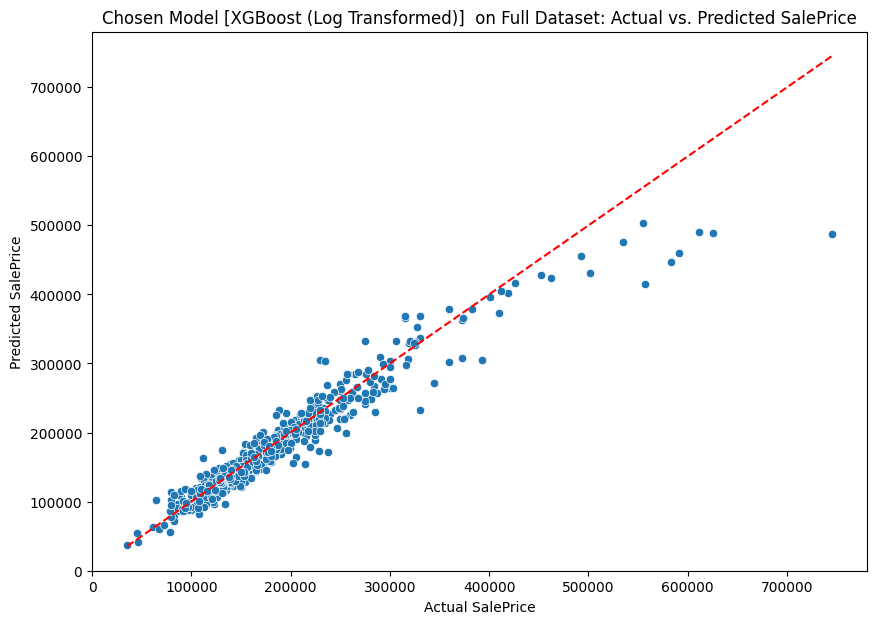

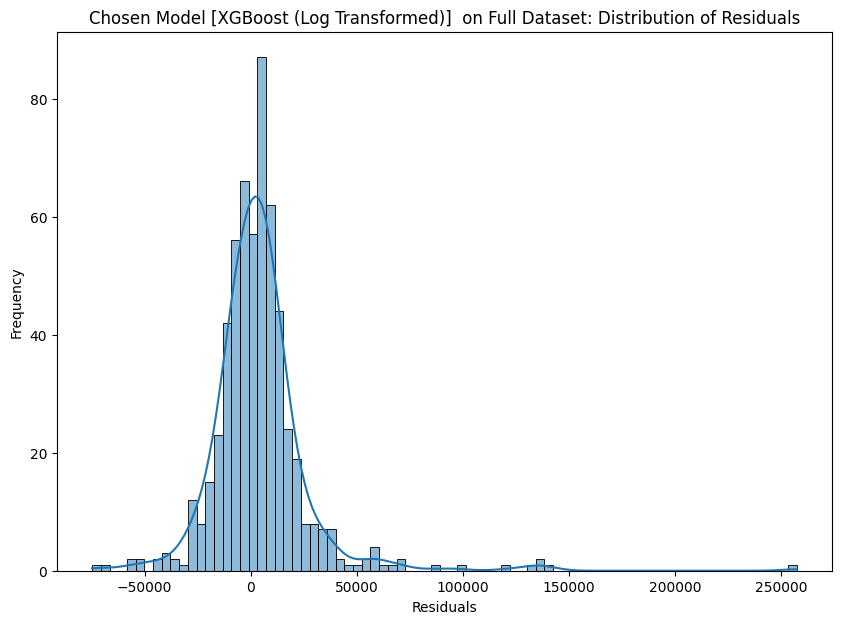

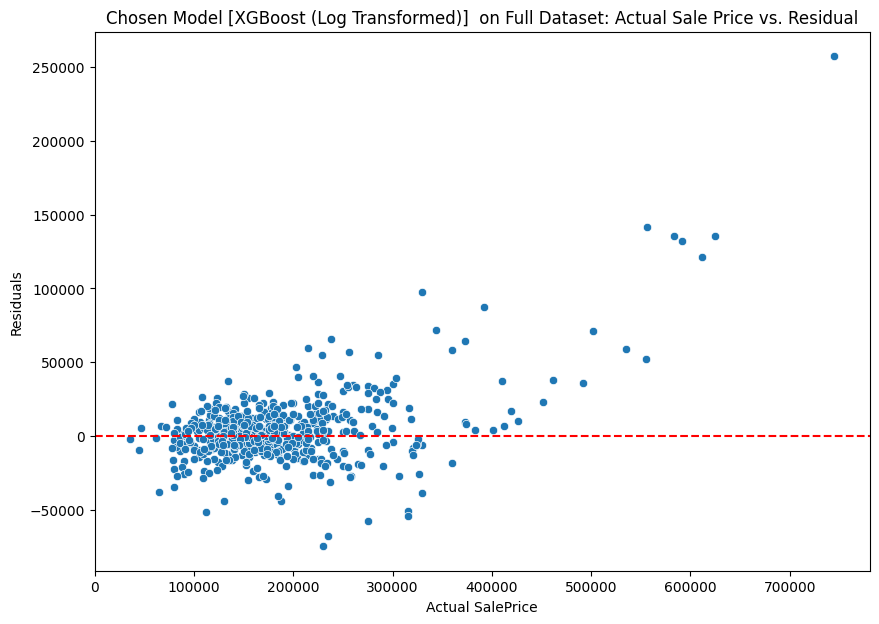


Chosen Model [XGBoost (Log Transformed)] : Scores

Chosen Model [XGBoost (Log Transformed)] : Low to Normal Sale Price
Mean Squared Error: 216025280.00
Root Mean Squared Error: 14697.80
R-squared: 0.88

Chosen Model [XGBoost (Log Transformed)] : High Sale Price
Mean Squared Error: 2930023424.00
Root Mean Squared Error: 54129.69
R-squared: 0.73

Chosen Model [XGBoost (Log Transformed)] : Full Dataset
Mean Squared Error: 599068160.00
Root Mean Squared Error: 24475.87
R-squared: 0.92


In [ ]:
log_undo_model_compare_predictions_values_all(chosen_model, X_test_normal_low_price_preprocessed, y_test_normal_low_price, X_test_high_price_preprocessed, y_test_high_price, X_test_preprocessed, y_test, to_plot = True, model_name = 'Chosen Model [XGBoost (Log Transformed)] ')

> I am fine with this model, given its low overall RMSE and low RMSE on low to normal sale price data. On top of that, the RMSE on high sale price data is not too high, again given the fact that the high sale price data has tons of high outliers

# Adding SHAP

In [ ]:
# Install SHAP
!pip install shap
import shap

In [ ]:
shap.initjs()

In [ ]:
explainer = shap.Explainer(chosen_model, X_train_preprocessed)
shap_values = explainer(X_test_preprocessed)

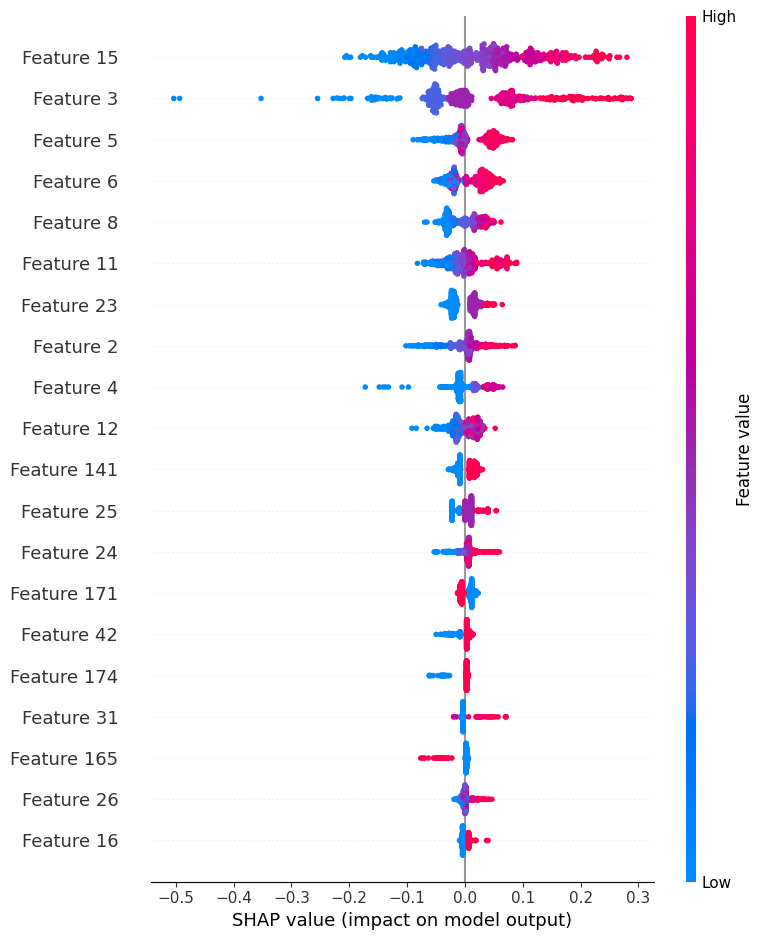

In [ ]:
shap.summary_plot(shap_values, X_test_preprocessed)

> Here, I can't get the actual feature names

In [ ]:
# Get all feature names after preprocessing
all_preprocessed_feature_names = preprocessor.get_feature_names_out()

# Example: Get the name for 'Feature 3' (using 0-based indexing)
# Assuming 'Feature 3' means the feature at index 3 in the preprocessed data

for feature_index in range(len(all_preprocessed_feature_names)):
  if feature_index < len(all_preprocessed_feature_names):
      feature_name = all_preprocessed_feature_names[feature_index]
      print(f"Feature at index {feature_index} is: {feature_name}")
      if feature_name.startswith('num__'):
          original_col_name = feature_name.replace('num__', '')
          print(f"  -> Original numerical column: {original_col_name}")
      elif feature_name.startswith('cat__'):
          parts = feature_name.replace('cat__', '').rsplit('_', 1)
          original_col_name = parts[0]
          category_value = parts[1] if len(parts) > 1 else ""
          print(f"  -> Original categorical column: {original_col_name}")
          print(f"  -> Category value: {category_value}")
  else:
    print(f"Feature index {feature_index} is out of bounds. Total features: {len(all_preprocessed_feature_names)}")

Feature at index 0 is: num__MS SubClass
  -> Original numerical column: MS SubClass
Feature at index 1 is: num__Lot Frontage
  -> Original numerical column: Lot Frontage
Feature at index 2 is: num__Lot Area
  -> Original numerical column: Lot Area
Feature at index 3 is: num__Overall Qual
  -> Original numerical column: Overall Qual
Feature at index 4 is: num__Overall Cond
  -> Original numerical column: Overall Cond
Feature at index 5 is: num__Year Built
  -> Original numerical column: Year Built
Feature at index 6 is: num__Year Remod/Add
  -> Original numerical column: Year Remod/Add
Feature at index 7 is: num__Mas Vnr Area
  -> Original numerical column: Mas Vnr Area
Feature at index 8 is: num__BsmtFin SF 1
  -> Original numerical column: BsmtFin SF 1
Feature at index 9 is: num__BsmtFin SF 2
  -> Original numerical column: BsmtFin SF 2
Feature at index 10 is: num__Bsmt Unf SF
  -> Original numerical column: Bsmt Unf SF
Feature at index 11 is: num__Total Bsmt SF
  -> Original numerica

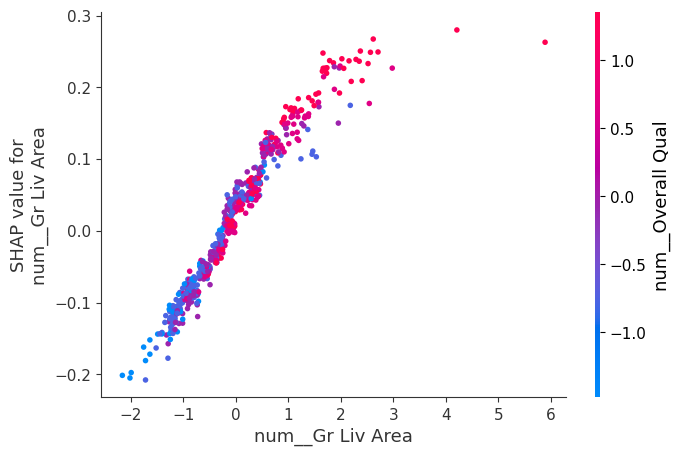

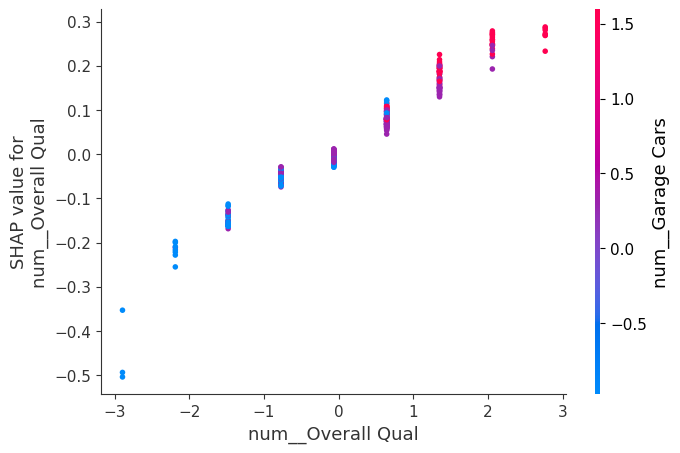

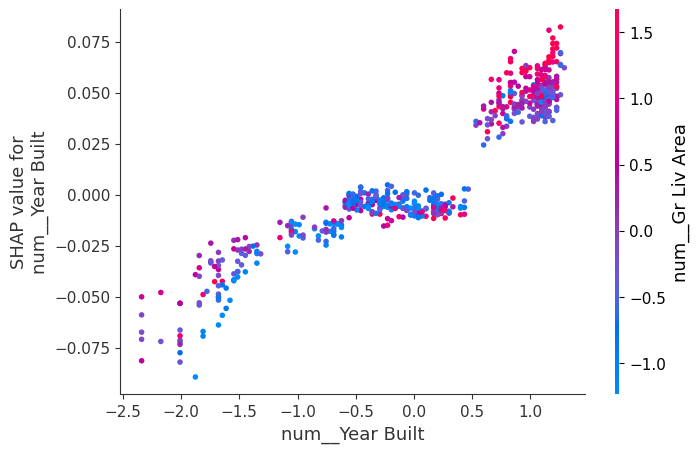

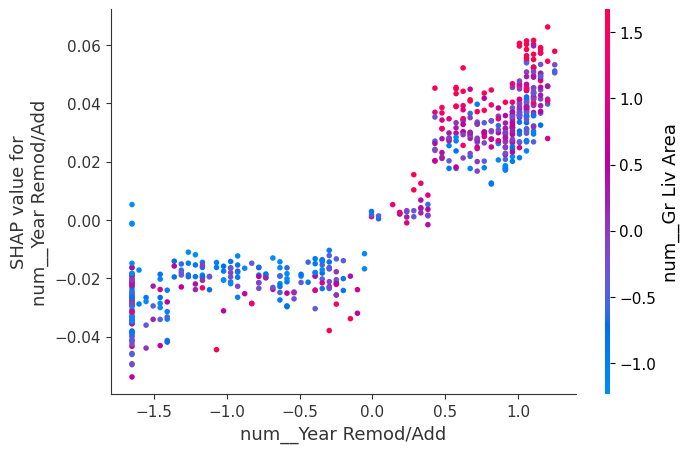

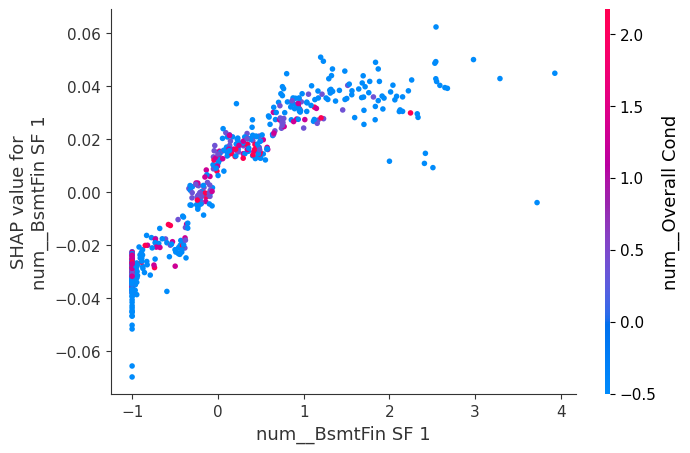

...

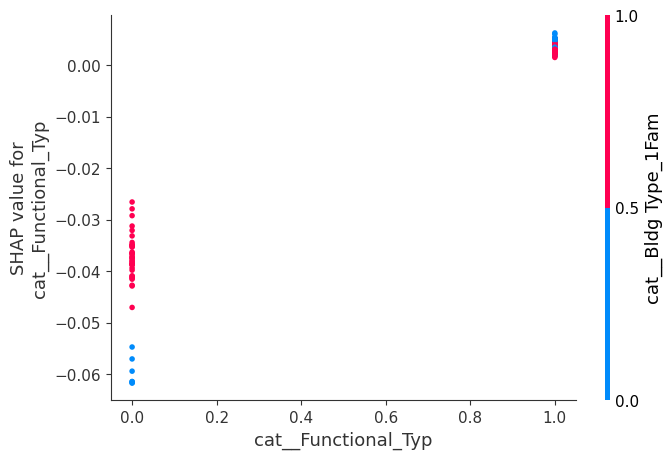

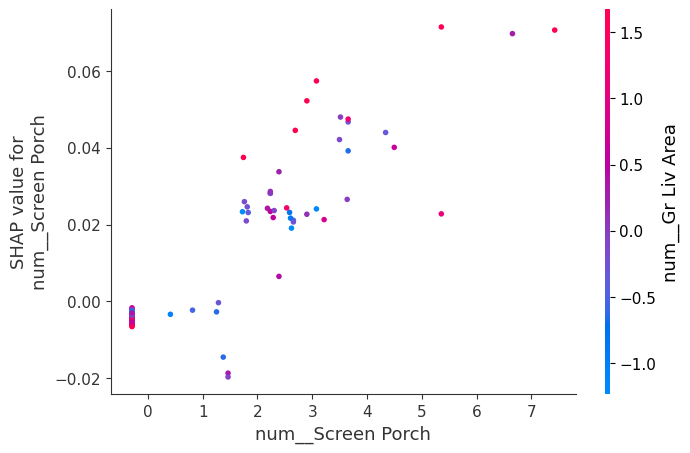

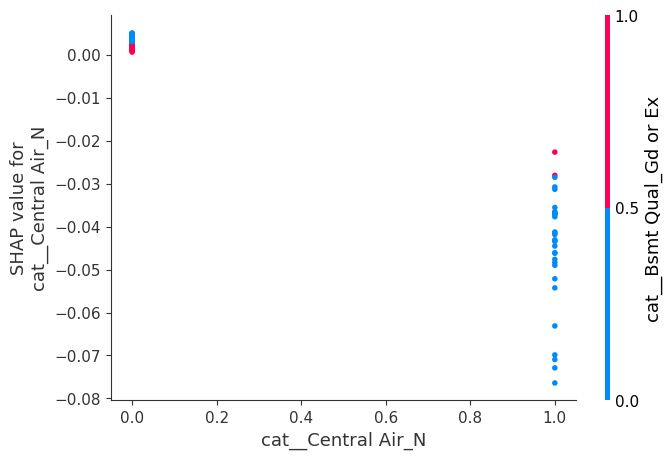

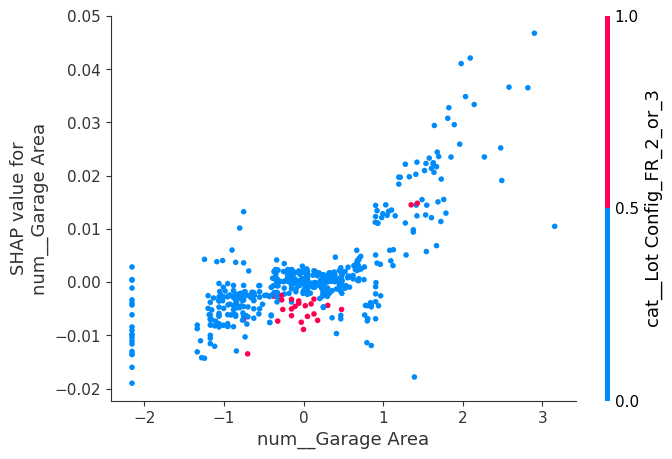

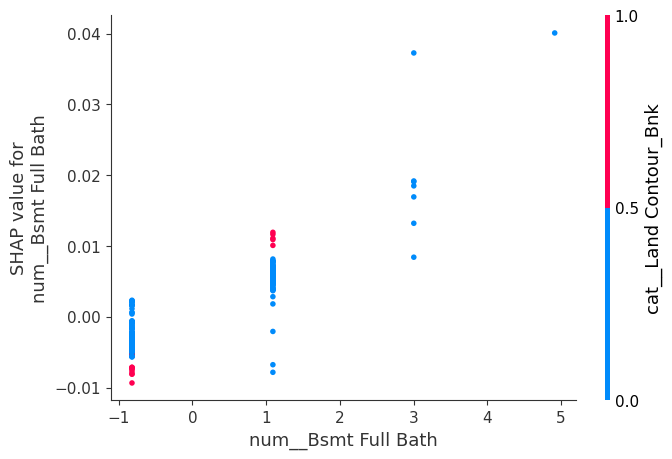

In [ ]:
# Assuming all_preprocessed_feature_names is available from a previous cell

for feature_index in [15, 3, 5, 6, 8, 11, 23, 2, 4, 12, 141, 25, 24, 171, 42, 174, 31, 165, 26, 16]:
  # Dependency plot
  shap.dependence_plot(
      feature_index,
      shap_values.values,  # Use the numerical SHAP values array
      shap_values.data,    # Use the original feature data that shap_values was computed on
      feature_names=all_preprocessed_feature_names.tolist(), # Pass feature names for better labels
      interaction_index="auto" # Keep auto to compute interaction, or set to None if still problematic
  )

Here, it seems that the most important features are:

> (Top 2, by far): Gr Liv Area (slightly more impact of high values), Overall Qual (much more impact of higher values)

> Year Built (with lower-end years built having much more impact than higher-end years built)

> Year Remod/Add (approx. equal impact of low and high values)

> BsmtFin SF 1 (lower values have a lot more impact)

> Total Bsmt SF (low and high values have approx. equal impact)

> Fireplaces (higher values have significantly more impact than lower values)

> Lot Area (a little more impact of lower values than higher values)

> Overall Cond (noticeably more impact of lower values than higher values)

> 1st Flr SF (noticeably more impact of lower values)

> Bsmt Qual = Gd or Ex (approx. equivalent impact of false and true values)

> Garage Cars (more impact of higher values)

> Garage Yr Blt (approx. equal impact of low and high values)

> Kitchen Qual = TA (approx. equal impact of false and true values)

> MS Zoning = RL (much more impact of false values than true values)

> Functional = Typ (much more impact of false than true values)

> Screen Porch (much more impact of high-end values than low-end values)

> Central Air = N (much more impact of false values than true values)

> Garage Area (much more impact of high values than low values)

> Bsmt Full Bath (more impact of high values than low values)



# Conclusion

## EDA steps

I did not do too much with the EDA, aside from analyzing the distributions of each column and the correlation between different columns.

However, I did note that plenty of the features were significantly correlated with each other and plenty of the features were significantly correlated with the sale price, thus increasing my expectations of a high-quality model

## Feature engineering steps

My primary focus for feature engineering was imputing missing values so that the data was in a consistent format for the entirety of the model building process.

> To do this, I first printed the null counts for each column. After seeing many columns with only 1 null entry, I first decided to see if many of these null entries were due to the same row. In this case, I found that many of these null entries came from just 4 rows, so I decided to drop these rows to resolve the null entries simply and without losing lots of information.

> After that, I printed the null counts for each column again and saw that many basement-related columns had aproximately the same number of null values (between 78 and 81 inclusive). One key idea that came to my mind was that these null values could be related, and when I checked on the rows with null BsmtFin Type 1 and null BsmtFin Type 2, I saw that those rows also had the vast majority of null values for the other basement-related columns. It made sense to me that this could be if the related rows corresponded to houses without basements.

>> I felt that 78 rows was a lot of information to drop from the dataset, so I instead decided to create a column representing whether a house had a basement or not. I started by filling in the missing basement column values with 'NA' (as they seemed to be non-numerical), and then creating the column 'Has Basement' where one of my chosen columns (in this case 'Bsmt Qual') was 'NA'. The 'Has Basement' column was to help prevent future models from making false assumptions on my data due to my imputed values

> I also saw that there were similar null counts for all garage-related columns and reasoned that perhaps these houses did not have garages. I found that 157 of the rows had all garage-related column values missing and the 1 remaining missing value for 4 of the columns corresponded to just 1 row.

>> Again, due to not wanting to lose information (in this case 158 rows), I imputed them with standard values (though in this case I had to fill numerical columns with 0 rather than 'NA'), along with creating a feature 'Has Garage' to help prevent future models from making false assumtpions on the data due to these imputations. This was even more important here due to some of the imputed columns being numerical and the value of 0 being well out of the standard range of 'Garage Yr Blt' and 'Garage Area'

> The other column I was going to try to deal with missing values in was 'Mas Vnr Area', which had 23 missing values. Due to it being a numerical column and not needing to fill in too many values, I filled the values in with 0, though in hindsight I probably also should have created a column representing if Masonry was existent or not.

> After that, Lot Frontage had 490 missing values so I filled them in with 0 and created a column 'Has Lot Frontage', and then since the remaining null-containing columns had so many null values (starting at almost half the rows), were categorical, and were not necessarily connected, I just filled them in with 'NA'

## Feature Selection and Dataset Finalization

When beginning my model building, I first separated my data into training and testing sets. On top of that, I also created further-separated training/testing sets for sale prices below and above a certain threshold, making sure to choose a threshold that would leave plenty of samples for each dataset. This way, I could compare the predictions of my models for low to medium sale price data and high sale price data individually, rather than only being able to focus on the whole dataset.
> If I had more resources, I could experiment with different threshold values

Finally, I decided to do feature selection via Lasso Regression to get important features to use in our model, noting that Lasso Regression would reduce some of its feature importances to 0. After getting the selected features to use from Lasso Regression, I created a ColumnTransformer object to preprocess the data into a format suitable for machine learning (in this case, I standard-scaled numerical features and One-hot encoded categorical features), and applied this to all my training and testing sets.

With that, I had my data and selected features for model training

After testing my models on these initially-selected features, I tried to see if the model could benefit from a less-complex training dataset, so I selected the features from my current best model (all-data XGBoost) whose importances had an absolute value above a threshold of 0.01.
> Again, if I had more time, I could experiment with different values for the importance threshold.

## Model Metrics

I chose to use the root mean squared error (RMSE) as my error metric due to the mean squared error being an extremely common error metric in regression and the root mean squared error values being a lot more sensible on the scale of our sale prices than the extremely large mean squared error values.

In hindsight, with all the high outliers present in the high sale price data, I could have also used the mean absolute error (MAE) instead of the RMSE as my loss function, in order to mitigate the extreme effects of the very high sale price outliers.

One more thing I did to try and mitigate the effects of very high outliers was to train models using log-transformed sale prices (simply taking the natural logarithm of the sale prices) and then undo those predictions using the exp() function.

After training all my models, I selected the model with the lowest RMSE on the whole dataset, being my XGBoost classifier trained on the log-transformed sale price without importance threshold-reduced features (but remember, this was still with just the features selected by our initial Lasso Regression). I noted that this also led to very low RMSEs for the low to medium and high sale price data separately compared to the rest of our models.

> The RMSE on the whole dataset was 24475.87, with the RMSE on the low to normal sale price data being 14697.80 and the RMSE on the high sale price data being 54129.69. Because our sale price in the original dataset was reported in U.S. dollars, it is safe to say that these RMSE values are in U.S. dollars as well.

> An RMSE of around this much would also make sense in the real world given the variation in home buyer incomes, what they valued, how much they valued it, and so on, and that no model would realistically be able to account for this without overfitting.

## Explaining the most important features

Throughout these features, we see that some of them have a higher impact on our model when their values are lower, equal impact whether low or high, or higher impact for higher values.

> Reason 1: I note that, in general, features where higher values have a lot more positive impact than lower values having negative impact could be due to low feature values and thus lower-scale (note the word of the use "scale") prices already indicating a buyer as willing and/or able to pay less for a house (such as if they have less money or are not buying a house so much for convenience), whereas high feature values and thus higher-scale prices indicate a buyer as willing and able to pay more for extra convenience in their home.
>>tl;dr more about necessity for lower values and convenience for higher values

> Reason 2: Low values could have more impact than high values for features where having at least noticeable values at least is seen as non-negotiable or a necessity.

> Reason 3: Low feature values having more negative impact than high values having positive impact values could indicate certain traits about a house (such as being constructed with not-very-good technology or not being equipped to handle modern usage patterns).
>> One big reason for this could be the accelerating nature of technological advancement (for example, technology did not advance as much from 1880 to 1920 as from 1980 to 2020). As another example, gaming consoles and handheld electronics were not nearly as prominent before the late 1900s as they were/are nowadays, thus requiring more power outlets.

> Reason 4: Low feature values having more negative impact than high values could also be in part due to us imputing missing numerical values with a single default value of 0, thus exaggerating the effects

The top 2 most important features of my chosen model by far were Gr Liv Area (IE the ground living area in square feet) and Overall Qual. Both of these make lots of sense as the important features due to being among the most important things to focus on when buying a house, and the strong impact of high values can be explained by Reason 1. On top of that, Overall Qual is more of a comfort feature and negotiable than Gr Liv Area

Year Built matters because in general, you'd want a house that was more recently built due to it being more accommodative of modern usage trends (ex: more power outlets), ease of maintenance, etc.
> Year Built could also have a larger impact with lower values due to Reason 3.

Year Remod / Add would make sense as a feature too, since people would want to buy houses that were more recently remodeled / added to versus houses that were remodeled / added to longer ago.
> The difference in effects of low/high values could be due to Reason 3 but not necessarily Reason 4 (as there were no missing values for Year Remod / Add in the original data to impute with 0)

BsmtFin SF 1 could be important as people would prefer a greater area of Type 1 finished basement, such as for extra space

> BsmtFin SF 1 exhibit a larger impact with lower values due to Reason 1, but NOT reason 4 (as we removed the 1 row with a null value for BsmtFin SF1, rather than imputing it with 0)

Total Bsmt SF could be important for the same reasons as BsmtFin SF 1.

> Total Bsmt SF surprisingly defies Reason 1 and has approximately equal impact of low and high values. This could be due to a combination of Reason 1 and Reason 2

Fireplaces matter because, if you're paying for an expensive house, you'd prefer more fireplaces versus fewer.
> Fireplaces having higher values give significantly more impact than lower values could be attributed to Reason 1

Lot Area can be valuable for several reasons, such as to hold more cars.  
> Lot Area might have a little more impact of lower values than higher values due to Reason 2 (if having at least medium lot area is seen as non-negotiable, such as due to cars being so dominant in today's world)

Overall Cond can be seen as an important thing for people buying a house, as higher condition indicates things the lower presence of house issues, such as maintenance costs or inconveniences.
> Overall Cond's noticeably more impact of low values can be attributed to Reason 2 if having at least a good condition is seen as very important. After that, having a significantly higher condition is not as useful

1st Flr SF can be seen as particularly important for people that want to live above the basement of their house, as the first floor is generally very big and houses (no pun intended) most of a house's common resources (kitchen, laundry, etc.)

> 1st Flr SF having a noticeably higher impact of lower values could be due to Reason 2, such as due to needing more area on at least the first floor for things such as appliances

BsmtQual = Gd or Ex is important because people want to have at least a good basement quality, and are turned off by a basement quality that is Fa or Po.

> BsmtQual = Gd or Ex could have an equal impact of false (IE BsmtQual is not Gd or Ex) and true values due to Gd / Ex encompassing a wider range of values than just the value of Gd or the value of Ex alone. Seeing our data, very few of the Bsmt Qual values are Fa, NA, or Po

> On top of that, maybe BsmtQual is not seen as very important if people generallly live on the first floor or above rather than in the basement

Garage Cars having a value of at least 1 or 2 can be seen as a necessity for many home buyers. Beyond that, having more garage cars can usually be attributed to comfort or a luxorious lifestyle, such as if a buyer can afford many cars

> Garage Cars has more impact of higher values likely due to Reason 1

Garage Yr Blt yields both a decrease in sale price for low values (older garages) and an increase in sale price for high values (newer garages).
> It's possible that the equal effects of low and high values could be attributed to Reason 1 for higher values versus Reason 4 for lower values

Kitchen Qual = TA is an important feature because people want at least a typical / average kitchen quality, and having a less-than-average versus a greater-than-average kitchen quality can be an important variable in buying a house.

> Kitchen Qual = TA has an approximately equal impact of false / true values due to false values encompassing Kitchen Qual = Fa, Po, Gd, or Ex, and the worse of these values balance out with the better

MS Zoning = RL: I'm not sure, but false means that MS Zoning could be equal to A, C, FV, I, RH, RP, or RM.

Functional = Typ is important because people want a good garage, particularly for housing their cars or other appliances such as tools. If there is damage, it could indicate the need for maintenance or make buyers worried about damage to things in their garage.

> Functional = Typ has much more impact of false values than true values because, according to the dataset description, all the non-Typ values indicate damage from minor to severe or salvage only, and all of these (especially the ones indicating higher damage) would decrease the sale prices

A screen porch might not be seen as a necessity but more as a convenience.

> Screen Porch might have greater impact of high values than low values due to Reason 1

Central Air conditioning could be less desirable for many home owners and thus decrease house value due to the fact that, if a central AC unit goes out, the air conditioning for the whole house goes out, and that this disadvantage is not present in homes with multiple AC units.  

> Centrai Air = N could have a much higher impact of false (IE central air conditioning) than true values for the above logic and non-central AC thus being seen as non-negotiable, thus applying Reason 2

Garage Area is important especially in today's age of having cars and sometimes needing to park them inside.

> Garage Area has a much higher impact of high values than low values due to Reason 1. Reason 4 is not enough to mitigate this.

Bsmt Full Bath can be seen as a convenience for many high-price home buyers but also a potential necessity for homes that have no or few bathrooms on other floors

> Bsmt Full Bath has a much higher effect of high values due to Reason 1

## Improvements

There are also a few potential improvements I believe I could make to this project

Getting the feature importances for all my models, rather than just my chosen model, could have helped me choose what features to focus more on in the model-building process and helped me detect the presence of other important features aside from just the top ones of my chosen model.

> In fact, I would do exactly this if I had more time, and I could easily do this by just coding the feature importance plots (with SHAP or other tools) into the evaluation functions.

>>One downside is that, since better models would logically choose better features, it's possible we could end up seeing some less important features as more important.

>>Another downside is that this would take up a lot of space in my output and it would be very inconvenient for a viewer to try and summarize important features when being bombarded with these plots,

Another thing I could do is look at the dates when these houses were sold and account for economic inflation. For a general example (not necessarily relevant to this dataset), if a house was sold in 1940 for \$40,000, it would represent a lot more value than a house sold in 2020 for \$40,000 due to inflation

>If I accounted for that difference, maybe the model would do even better on the data due to less discrepancy

Looking back on my notes, it also seems that MS Subclass was a numerical column that was never encoded, despite behaving as essentiallly a categorical variable.

> Fortunately, from the initial correlation heatmap, it did not seem that MS Subclass had a noticeable correlation to sale price